# Restaurant Sucess Prediction in Bangalore

### Table of Contents

1. Introduction
2. Problem Defination
3. Data Acquisition
4. Data processing and Feature Engineering
5. EDA
6. ML Problem
7. Performance Metrics
8. Data Preparation
9. ML Models
10. Ensemble Models
11. Summary

### 1. Introduction

Bangalore officially known as Bengaluru, is the capital and the largest city of the Indian state of Karnataka. It has a population of more than 8 million and a metropolitan population of around 11 million, making it the third most populous city and fifth most populous urban agglomeration in India. The diversity of the cuisine available is reflective of the social and economic diversity of Bangalore. Food culture is massive in Bangalore and we can find restaurants from all over the world having over 12000 restaurants and its increasing day by day. Even with such high numbers the market has not yet saturated.

### 2. Problem Defination 

Due to such high diversity, the demand of new resturanats in bangalore is not stopping. However, it is becoming more and more difficult for the new ones to compete with the already establised places.The key issues that continue to pose a challenge to them include high real estate costs, rising food costs, shortage of quality manpower, fragmented supply chain and over-licensing.

This project aims at analyzing demography of the location. Most importantly it will help new restaurants in deciding their theme, menus, cuisine, cost etc for a particular location.

In particular, the concluded analysis will target stakeholders who want to set up one of the popular restaurants in Bangalore. We will use various data science and analysis techniques to reach our goal of selecting optimal locations. The advantages of each area will then be clearly expressed so that the best possible final location can be chosen by stakeholders.

### 3. Data Acquisition 

The data and their respective sources are given below :

1. **Zomato.csv** :
    This file was taken from Kaggle, it contains all the information about the resturants in Bangalore given in  51717 data points in total. It contains the following features:
    
    -   **Url** : contains the url of the restaurant in the zomato website
    -   **Address** : contains the address of the restaurant 
    -   **Name** : contains the name of the restaurant
    -   **Online-order** : states whether online ordering is available in the restaurant or not
    -   **Book-table** : states whether table booking option is available or not
    -   **Rate** : contains the overall rating of the restaurant out of 5
    -   **Votes** : contains the sum total of ratings a restaurant has received
    -   **Phone** : contains the phone number of the restaurant
    -   **Location** : contains the neighborhood in which the restaurant is located
    -   **Rest-type** : restaurant type
    -   **Dish-liked** : contains the most popular dishes of the resturant
    -   **Cuisines** : constains the cuisines offered by the restaurant
    -   **Reviews-list** : constains the reviews of that restaurant
    -   **Menu-item** : contains menu items of that restaurant
    -   **Approx-cost(for_2_people)** : average cost of dining at that restaurant for 2 people
    -   **Listed-in(type)** : what is the speciality of the restaurant
    -   **Listed-in(city)** : locality of the restaurant
    
  
2. **Georgraphical Latitude and Logitudes** :
    These were calculated after extracting the location values from **Zomato.csv** and using the Geocoders library in python. We used the Nominatim from Geocoders to extract our latitudes and longitudes.
    
  
3. **population_data.csv** :
    This was extracted from **console.geoiq.io** using the georaphical latitudes and logitudes values obtained from above. It contains the following features:
    
    -   **Location** : contains the name of the locality  
    -   **Total Population** : contains the total population of a locality  
    -   **Grocery** : contains concentration of grocery with respect to population   
    -   **Restaurant** : contains concentration of restaurant with respect to population  
    -   **Cafe** : contains concentration of cafe with respect to population 
    -   **Female population** : contains the female population of a locality 
    -   **Male population** : contains the male population of a locality

### 4. Data processing and Feature Engineering

#### 4.1 Importing the required libraries

In [47]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from geopy.geocoders import Nominatim
import folium
from folium.plugins import HeatMap
from statsmodels import robust
from wordcloud import WordCloud, STOPWORDS
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from scipy.sparse import hstack
from sklearn import neighbors
from sklearn.metrics import mean_squared_error 
import math
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.ensemble import StackingRegressor
from prettytable import PrettyTable 

#### 4.21 Loading the Zomato.csv Dataset

In [48]:
df  = pd.read_csv('zomato.csv')
df.tail(3)

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
51714,https://www.zomato.com/bangalore/plunge-sherat...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,NaN,0,NaN,Whitefield,Bar,NaN,Finger Food,"2,000",[],[],Pubs and bars,Whitefield
51715,https://www.zomato.com/bangalore/chime-sherato...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3 /5,236,080 49652769,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,"2,500","[('Rated 4.0', 'RATED\n Nice and friendly pla...",[],Pubs and bars,Whitefield
51716,https://www.zomato.com/bangalore/the-nest-the-...,"ITPL Main Road, KIADB Export Promotion Industr...",The Nest - The Den Bengaluru,No,No,3.4 /5,13,+91 8071117272,"ITPL Main Road, Whitefield","Bar, Casual Dining",NaN,"Finger Food, North Indian, Continental","1,500","[('Rated 5.0', 'RATED\n Great ambience , look...",[],Pubs and bars,Whitefield


In [49]:
print(df.shape)
print("Number of duplicated data points : {}".format(df.duplicated().sum()))

(51717, 17)
Number of duplicated data points : 0


##### 4.22 Observations

-  url shows the website address of the restaurant which is not very usefull in our analysis
-  online_order, book_table appear to be binary features
-  rate appears to be in string format as its given in the form a ratio
-  cuisines and rest-type features seem to have multiple values
-  menu-item feature appear to be empty
-  votes and approx-cost appear to be numeric features
-  location and Listen-in(city) appear to be same
-  There are 51717 rows and 17 features, non of the data points are repeating.

#### 4.31 Checking the data type of all features

In [50]:
for col in df.columns:
    print([col,type(df[col][0])])

['url', <class 'str'>]
['address', <class 'str'>]
['name', <class 'str'>]
['online_order', <class 'str'>]
['book_table', <class 'str'>]
['rate', <class 'str'>]
['votes', <class 'numpy.int64'>]
['phone', <class 'str'>]
['location', <class 'str'>]
['rest_type', <class 'str'>]
['dish_liked', <class 'str'>]
['cuisines', <class 'str'>]
['approx_cost(for two people)', <class 'str'>]
['reviews_list', <class 'str'>]
['menu_item', <class 'str'>]
['listed_in(type)', <class 'str'>]
['listed_in(city)', <class 'str'>]


In [51]:
df.isna().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [52]:
percentage = df.isna().sum()/df.shape[0]*100
features = list(df.columns)
percentage

url                             0.000000
address                         0.000000
name                            0.000000
online_order                    0.000000
book_table                      0.000000
rate                           15.033741
votes                           0.000000
phone                           2.335789
location                        0.040606
rest_type                       0.438927
dish_liked                     54.291626
cuisines                        0.087012
approx_cost(for two people)     0.669026
reviews_list                    0.000000
menu_item                       0.000000
listed_in(type)                 0.000000
listed_in(city)                 0.000000
dtype: float64

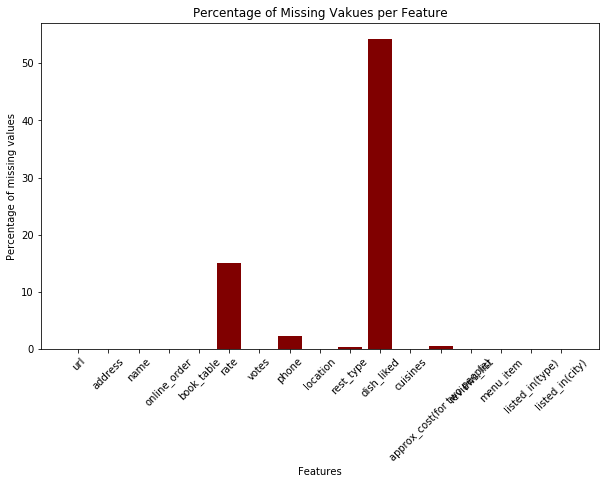

In [53]:
plt.figure(figsize = (10, 6))
plt.bar(features,percentage, color='maroon')
plt.xticks(rotation = 45)
plt.xlabel('Features')
plt.ylabel('Percentage of missing values')
plt.title('Percentage of Missing Vakues per Feature')
plt.show()

-  We are plotting the percentage of missing values per feature to get an insight about our data.
-  We Observe that in reviews_list and menu_item the feilds were filled with '[]' which does not make sense, these cells must be considered as empty but in our analysis here menu_item and reviews_list have 0 empty cells.

In [54]:
menu=[]
for i in df.menu_item.values:
    if i=='[]':
        menu.append(None)
    else:
        menu.append(i)
df['menu'] = menu
review=[]
for i in df.reviews_list.values:
    if i=='[]':
        review.append(None)
    else:
        review.append(i)
df['review'] = review
number=[]
for i in df.votes.values:
    if i==0:
        number.append(None)
    else:
        number.append(i)
df['number']= number

We are creating 3 new features menu, review, number.
-  menu is derived from menu_item, we just changed '[]' to None as it should represent a empty cell.
-  review is derived from reviews_list similar to menu_item.
-  number is derived from votes, we changed 0 to None to check the number of 0 votes.
-  We added these 3 new features and plotted the percentage of missing points graph again to specifically observe these features.

In [55]:
df.isna().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
menu                           39617
review                          7595
number                         10027
dtype: int64

In [56]:
percentage = df.isna().sum()/df.shape[0]*100
features = list(df.columns)
percentage

url                             0.000000
address                         0.000000
name                            0.000000
online_order                    0.000000
book_table                      0.000000
rate                           15.033741
votes                           0.000000
phone                           2.335789
location                        0.040606
rest_type                       0.438927
dish_liked                     54.291626
cuisines                        0.087012
approx_cost(for two people)     0.669026
reviews_list                    0.000000
menu_item                       0.000000
listed_in(type)                 0.000000
listed_in(city)                 0.000000
menu                           76.603438
review                         14.685693
number                         19.388209
dtype: float64

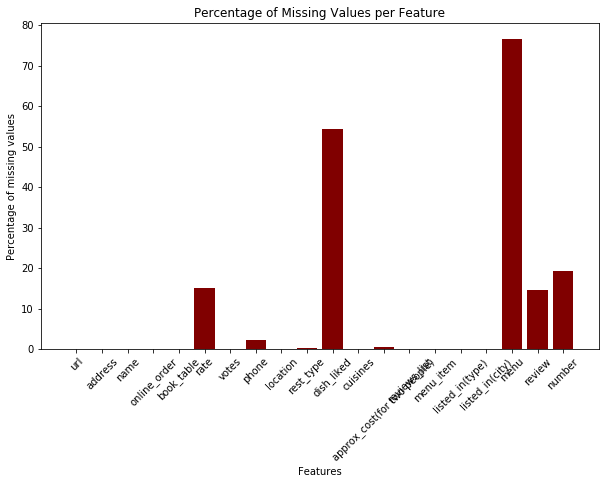

In [57]:
plt.figure(figsize = (10, 6))
plt.bar(features,percentage, color='maroon')
plt.xticks(rotation = 45)
plt.xlabel('Features')
plt.ylabel('Percentage of missing values')
plt.title('Percentage of Missing Values per Feature')
plt.show()

-  We plotted the same graph but this time we added the filtered version of reviews_list as review, menu_item as menu and votes as number
-  menu_item have over 74% values missing, therefore we must remove this feature
-  review has 14.6% and votes has 19%
-  votes may be empty or 0 for new restaurants.

In [58]:
#Keeping a count of data points having same values in location and Listed_in(city)
# Checking all the indivisual points on the 2 features and returning True for same and False otherwise
# Taking this list in a loop and counting the True values

count =0
for i in df.location.values==df['listed_in(city)']:
    if i==True:
        count=count+1
print('Percentage of points Location and Listed_in(city) have common : {}'.format(count/df.shape[0]*100))
print('Percentage of points Location and Listed_in(city) have different : {}'.format(100-count/df.shape[0]*100))

Percentage of points Location and Listed_in(city) have common : 30.976274725912177
Percentage of points Location and Listed_in(city) have different : 69.02372527408782


In [59]:
df.drop(columns=['url','dish_liked','menu_item','phone','address','menu','reviews_list','number'],inplace=True)
df = df[df['location'].notnull()]
df = df[df['approx_cost(for two people)'].notnull()]
df.reset_index(inplace = True, drop = True)
df.tail(3)

,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city),review
51368,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,NaN,0,Whitefield,Bar,Finger Food,"2,000",Pubs and bars,Whitefield,None
51369,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3 /5,236,"ITPL Main Road, Whitefield",Bar,Finger Food,"2,500",Pubs and bars,Whitefield,"[('Rated 4.0', 'RATED\n Nice and friendly pla..."
51370,The Nest - The Den Bengaluru,No,No,3.4 /5,13,"ITPL Main Road, Whitefield","Bar, Casual Dining","Finger Food, North Indian, Continental","1,500",Pubs and bars,Whitefield,"[('Rated 5.0', 'RATED\n Great ambience , look..."


#### 4.32 Observations:

-  votes is in numberic form, but approx-cost which we thought was numeric is in string format.
-  remaining all the features are in string format.
-  We observe that dish_liked is a not a empty list but has over 50% of its values missing, therefore we remove the feature
-  We observe that rating feature has almost 15% of its data missing, we could use reviews_list feature to fill that up.
-  We have no use of Url and phone number features in our analysis, therefore we remove it.
-  Since we already have the location and listed city features, therefore we can remove the address feature. 
-  We can observe that 69% of points in Location and Listed_in(city) are different, therefore we keep both the features.
-  We removed the rows which were having NaN values in Location and approx_cost(for two people)
-  We removed the temporary features we added (number,menu)
-  We keep the filtered version of reviews_list as review and remove reviews_list

#### 4.33 Checking specific rows having no values in other features

In [14]:
df[df.name=='Vinod Bar And Restaurant']

,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city),review
50925,Vinod Bar And Restaurant,No,No,NaN,0,Whitefield,Bar,Finger Food,600,Dine-out,Whitefield,None
51367,Vinod Bar And Restaurant,No,No,NaN,0,Whitefield,Bar,Finger Food,600,Pubs and bars,Whitefield,None


In [60]:
df[(df.review.isnull()) & (df.rate.isnull())].shape


(5229, 12)

#### Observations

-  We noticed that some of the data points (5229) had majority of the features missing, which is vital for our analysis.
-  These data points may be of new restaurants or the entiries might be missing, either way we cannot use these, therefore we remove all these points.

In [16]:
df = df[((df.review.notnull()) & (df.rate.notnull())) |
  ((df.review.isnull()) & (df.rate.notnull())) |
  ((df.review.notnull()) & (df.rate.isnull()))]
df.reset_index(inplace = True, drop = True)
df

,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city),review
0,Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,Buffet,Banashankari,"[('Rated 4.0', 'RATED\n A beautiful place to ..."
1,Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,Buffet,Banashankari,"[('Rated 4.0', 'RATED\n Had been here for din..."
2,San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,Buffet,Banashankari,"[('Rated 3.0', ""RATED\n Ambience is not that ..."
3,Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,"South Indian, North Indian",300,Buffet,Banashankari,"[('Rated 4.0', ""RATED\n Great food and proper..."
4,Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600,Buffet,Banashankari,"[('Rated 4.0', 'RATED\n Very good restaurant ..."
...,...,...,...,...,...,...,...,...,...,...,...,...
46137,Topsy Turvey,No,No,NaN,0,Whitefield,Bar,Finger Food,900,Pubs and bars,Whitefield,"[('Rated 4.0', ""RATED\n A divine joint for Fl..."
46138,Bhagini,No,No,2.5 /5,81,Whitefield,"Casual Dining, Bar","Andhra, South Indian, Chinese, North Indian",800,Pubs and bars,Whitefield,"[('Rated 4.0', 'RATED\n A fine place to chill..."
46139,Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6 /5,27,Whitefield,Bar,Continental,"1,500",Pubs and bars,Whitefield,"[('Rated 5.0', ""RATED\n Food and service are ..."
46140,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3 /5,236,"ITPL Main Road, Whitefield",Bar,Finger Food,"2,500",Pubs and bars,Whitefield,"[('Rated 4.0', 'RATED\n Nice and friendly pla..."


#### 4.34 Observations:

-  We noticed that some of the data points (5229) had majority of the features missing, which is vital for our analysis.
-  These data points may be of new restaurants or the entiries might be missing, either way we cannot use these, therefore we remove all these points.
-  After removing these points we have 46142 data points with 12 features.

#### 4.4 Feature extraction:

In [17]:
df.review.values[52]

'[(\'Rated 3.0\', "RATED\\n  Always a fan of corner house. Hadn\'t been to one in the longest time. Probably that is why it all felt different. It was all melty even before we started eating. It just did not feel like the classic corner house this time. Will definitely visit again though."), (\'Rated 5.0\', "RATED\\n  As always, corner house is known for its same taste and quality throughout Bangalore! This outlet didn\'t disappoint as well. Dbc and Hcf are the best here and love the chocolate sauce here!"), (\'Rated 4.0\', \'RATED\\n  Corner house is a best place for ice cream and DBC is the beat here, price is little expensive but the quantity and the quality is excellent\'), (\'Rated 4.0\', \'RATED\\n  One of my favourite place and DBC i love the most !! Must try . Place is quite good n itÃ\x83\\x83Ã\x82\\x83Ã\x83\\x82Ã\x82\\x82Ã\x83\\x83Ã\x82\\x82Ã\x83\\x82Ã\x82\\x92s quite pocket friendly too for the quantity they give !! Must visit !! Thumbs up\'), (\'Rated 5.0\', \'RATED\\n  I d

In [18]:
df.review.values[52].split("'")

['[(',
 'Rated 3.0',
 ', "RATED\\n  Always a fan of corner house. Hadn',
 't been to one in the longest time. Probably that is why it all felt different. It was all melty even before we started eating. It just did not feel like the classic corner house this time. Will definitely visit again though."), (',
 'Rated 5.0',
 ', "RATED\\n  As always, corner house is known for its same taste and quality throughout Bangalore! This outlet didn',
 't disappoint as well. Dbc and Hcf are the best here and love the chocolate sauce here!"), (',
 'Rated 4.0',
 ', ',
 'RATED\\n  Corner house is a best place for ice cream and DBC is the beat here, price is little expensive but the quantity and the quality is excellent',
 '), (',
 'Rated 4.0',
 ', ',
 'RATED\\n  One of my favourite place and DBC i love the most !! Must try . Place is quite good n itÃ\x83\\x83Ã\x82\\x83Ã\x83\\x82Ã\x82\\x82Ã\x83\\x83Ã\x82\\x82Ã\x83\\x82Ã\x82\\x92s quite pocket friendly too for the quantity they give !! Must visit !! Thumb

#### 4.41 Observations:

-  We observe that the review feature values can be sepeared using " ' " as delimeter for our spliting.
-  After splitting we observed that the numerical rating is always givn after "Rated"
-  We will try to use these patterns in the data to obtain the numeric values of the reviews

In [19]:
#Creating a function to extract ratings from reviews of customers.
# Creating a empty list to store the ratings
# We take each data point from the given feature and check if its Null or not.
# if the value is Null we store None in the list and go to the next data point.
# if the value is not Null, we split it using " ' " as observed previously and take these values in another loop.
# We check if the first 5 characters are "Rated" or not as observed previously.
# if yes then we extract the 6th to 8th character in the form of float in a temporary list
# we continue in loop till we reach the end of the review.
# we store the list of ratings in the first list and continue till we reach the end of review
# we return the final list containing the ratings from customer.

def review_extract(Data_frame,feature):
    l=[]
    for i in tqdm(Data_frame[feature].values): 
        if i==None:
            l.append(None)
        else:
            temp=[]
            for j in i.split("'"): 
                if j[0:5]=='Rated':
                    temp.append(float(j[6:9]))
            l.append(temp)
    return l

In [20]:
user_review = review_extract(df,'review')

100%|█████████████████████████████████████████████████████████████████████████| 46142/46142 [00:02<00:00, 17116.29it/s]


In [21]:
user_review[52]

[3.0, 5.0, 4.0, 4.0, 5.0, 5.0, 5.0, 3.0]

#### 4.42 Observations:

-  We were able to extract the ratings and store it in float format in list called user_review.
-  Using user_review we can create 2 new features called avg_user_rating and user_votes.
-  avg_user_rating will store the average value of the obtained ratings.
-  user_votes will store the number of ratings we got per data point from user_review.

In [22]:
# defining a function to obatin the above mentioned features
# Create 2 lists - avg and count
# We take the above obatined list and take one data point at once using a loop
# We check if the value is none, if yes avg list is appended with None and count with 0
# if the value is not none, we calculate the mean of ratings and calculate its count and append the avg and count list

def features(List):
    avg=[]
    count=[]
    for i in tqdm(List):
        if i == None:
            avg.append(None)
            count.append(0)
        else:
            avg.append(round(np.mean(i),2))
            count.append(len(i))
    return avg, count

In [23]:
avg_user_rating, user_votes = features(user_review)

100%|█████████████████████████████████████████████████████████████████████████| 46142/46142 [00:01<00:00, 36776.89it/s]


In [24]:
print("This review has a average user rating of {} and has {} number of votes".format(avg_user_rating[52], user_votes[52]))

This review has a average user rating of 4.25 and has 8 number of votes


In [25]:
df['avg_user_rating']=avg_user_rating
df['user_votes']=user_votes

C:\Users\Kaushal\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\Kaushal\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [26]:
df.rate = df.rate.replace(np.nan,'NEW') # Based on our previous observations, we had over 2000 missing values, we assume thwm to be new
rates=[]
for i in df.rate.values:
    if i =='NEW':
        rates.append(None)
    elif i=='-': # we observed other than "NEW", some data points had '-' as entry, we convert all of them to None
        rates.append(None)
    else:
        rates.append(float(i[:3])) # we extract the rating from the rate feature and convert it into float and store it here
df.rate = rates # we replace the older rate feature with this updated one

C:\Users\Kaushal\anaconda3\lib\site-packages\pandas\core\generic.py:5303: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [27]:
cost=[]
for i in df['approx_cost(for two people)'].values:
    i=i.replace(',','') #we observed that some of the values had a ',' in between them (1,200), we replace it.
    cost.append(int(i))
df['approx_cost(for two people)'] = cost # we replace the older feature with this updated one

C:\Users\Kaushal\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [28]:
#We are pre-processing all the names of the resturants
def preprocess(Dataframe,feature):
    process=[]
    for i in Dataframe[feature].values:
        ab = i.lower() #converting thwm to lower case
        ab = ab.replace(' ','_') #replacing space between words with _
        ab = ab.replace('-','_') #replacing - with _
        ab = ab.replace(':','_') # replacing : with _
        ab = ab.replace('&','and') #replacing & with 'and'
        ab = ab.replace("'",'')
        ab = re.sub('[^A-Za-z0-9]+', '_', ab) #removing special characters
        process.append(ab)
    return process

In [29]:
names = preprocess(df,'name')
df['name'] = names # we replace the older feature with this updated one

C:\Users\Kaushal\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [30]:
df.drop(columns=['review'],inplace=True)
df

C:\Users\Kaushal\anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city),avg_user_rating,user_votes
0,jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,Buffet,Banashankari,4.08,12
1,spice_elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,Buffet,Banashankari,3.57,14
2,san_churro_cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,Buffet,Banashankari,3.15,20
3,addhuri_udupi_bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300,Buffet,Banashankari,3.67,35
4,grand_village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600,Buffet,Banashankari,4.00,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
46137,topsy_turvey,No,No,NaN,0,Whitefield,Bar,Finger Food,900,Pubs and bars,Whitefield,4.00,1
46138,bhagini,No,No,2.5,81,Whitefield,"Casual Dining, Bar","Andhra, South Indian, Chinese, North Indian",800,Pubs and bars,Whitefield,3.00,3
46139,best_brews_four_points_by_sheraton_bengaluru_,No,No,3.6,27,Whitefield,Bar,Continental,1500,Pubs and bars,Whitefield,4.12,16
46140,chime_sheraton_grand_bengaluru_whitefield_hote...,No,Yes,4.3,236,"ITPL Main Road, Whitefield",Bar,Finger Food,2500,Pubs and bars,Whitefield,4.00,6


#### 4.43 Observations

-  We added the 2 new features, avg_user_rating and user_votes to our dataframe
-  We observed that some rows (like 46137)  which has no rating and votes from our initial features but has Non-Null values in the new features.
-  We converted our rate feature, which was originally in the form like 4.1/5, to just 4.1. We changed the datatype to float after extracting the numerater.
-  Similarly, we converted the approx_cost(for two people) feature from string class to integer
-  We remove the review feature from our dataset as we have now extracted the usefull information from it.
-  We processed our name feature and updated it.
-  Our data now has 46142 data points and 13 features.

#### 4.5 Feature Engineering:

Based on the literature survey done, we are going to make the following features:
-  **total_cuisines** : Number of cuisines offered by the restaurant
-  **multitype_restaurant** : Checks if the restaurant provides multiple features or not.
-  **RevPASH** : Revenue per sitting hour available.
-  **Co-ordinates** : Based on the loactions, similar ones can be grouped to a cluster
-  **Male_population** : Male population of a location
-  **Female_population** : Female population of a location
-  **Total_population** : Total population of a location
-  **Restaurant_Concentration** : Concentration of restaurants within 1km of a location
-  **Grocery_Concentration** : Concentration of grocery within 1km of a location
-  **Cafe_Concentration** : Concentration of cafe within 1km of a location

In [31]:
#This feature was already implemented in the following paper which we went through during our literature survey
#https://medium.com/@vyshaghin/restaurant-success-prediction-analysis-and-model-building-42be18326397
# We went through the paper and implemented it on our own
total_cuisines=[]
df.cuisines =df.cuisines.replace(np.nan,"") #we are replacing the null values with an empty string for numeric calculation
for i in df.cuisines.values:
    c=0
    for j in i.split(","):
        c=c+1
    total_cuisines.append(c) # We are counting the number of unique cuisines offered by the restaurant and storing it in total_cuisines
df['total_cuisines'] = total_cuisines # We update our DataFrame with our new feature.

C:\Users\Kaushal\anaconda3\lib\site-packages\pandas\core\generic.py:5303: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
C:\Users\Kaushal\anaconda3\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [32]:
#This feature was already implemented in the following paper which we went through during our literature survey
#https://medium.com/@vyshaghin/restaurant-success-prediction-analysis-and-model-building-42be18326397
# We went through the paper and implemented it on our own
multitype_restaurant =[]
df.rest_type =df.rest_type.replace(np.nan,"")
for i in df.rest_type.values:
    c=0
    for j in i.split(","):
        c=c+1 # We are count the type of features offered by the restaurant
    if c>=2: # We check if it is more than or equal to 2 to append if its multi-type restaurant or not
        multitype_restaurant.append("Yes")
    else:
        multitype_restaurant.append("No")
df['multitype_restaurant'] = multitype_restaurant

C:\Users\Kaushal\anaconda3\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [33]:
# We found the concept of RevPASH from our literature Survey from the following paper
#https://www.wisk.ai/blog/restaurant-data-analytics-metrics-to-track-and-optimize-to-increase-profits
# We went through the paper and implemented the same after assuming the follwing:
# 1. The number of people who truly visited the restaurant can be the people who left the text review, 
#therefore we assume the user_votes from our data to calculate the revenue
# 2. Working hours for all the restaurants may be same, therefore a constant
RevPASH = []
for i,j in zip(df['approx_cost(for two people)'],df['user_votes']):
    RevPASH.append(i*j/100)
df['RevPASH'] = RevPASH 

C:\Users\Kaushal\anaconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


In [34]:
# This was implemented in the following paper which we went through during our literature survey.
#https://medium.com/analytics-vidhya/analyzing-and-predicting-optimal-locations-for-popular-restaurants-in-chennai-city-4ec13b6b5fb6
# We tried to implement the same after going through it.

#Define a function Coordinates to get the Latitude and Logitude values of the given location
# We extract the location one by one from the list
# We write the address in the form of "Location, Bengaluru, India"
# We use the geolocator.Nominatim to obtain the loc values of the address
# We Check if the Coordinates are None or not
# We store the Lat and Long values and return them

def coordinates(Location):
    lat=[]
    long=[]
    for i in tqdm(Location):  
        address = i+', Bengaluru, India'
        geolocator = Nominatim(user_agent="ny_explorer")
        loc = geolocator.geocode(address)
        if loc==None: # We observed that some of the location names return a Null value, which maybe because of Misspelling the word or wrong entry
            lat.append(0)
            long.append(0)
        else:
            lat.append(loc.latitude)
            long.append(loc.longitude)
    return lat,long

In [35]:
l=df.location.values
l1=set(l) #converting the list to set to remove duplicate values
Lat, Long = coordinates(l1) #passing it through the function to obtain the Lat and Long Coordinates

100%|██████████████████████████████████████████████████████████████████████████████████| 92/92 [01:16<00:00,  1.20it/s]


In [36]:
geo = pd.DataFrame(l1,columns=['Location'])
geo["Latitude"] = Lat
geo["Longitude"] = Long #We make a DataFrame geo to store the location and their respective latitude and longitude values.

In [37]:
# We define a function map which takes the dataframe which has location, Lat and Long values.
# This function will help us visualize the locations in a World Map
# We find the Latitude and Longitude values  of Bangalore, this will work as our initialization value for our map.
# We plot a map using folium.map library using the above coordinales and name it bangalore
# We extract each data point from the Dataframe and add them in the form of markers to bangalore map
# We label the markers with their location names and color the markers blue
# We return the map of bangalore

def map(geo):
    address = 'Bengaluru, India'
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
    print('The geograpical coordinate of Bangaloreis {}, {}.'.format(latitude, longitude))

    bangalore = folium.Map(location=[latitude, longitude], zoom_start=11)
    folium.Marker([latitude, longitude], popup="Bangalore city").add_to(bangalore)

    # add markers to map
    for lat, lng, category in zip(geo['Latitude'], geo['Longitude'], geo['Location']):
        label = folium.Popup(category, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=3,
            popup=label,
            color='blue',
            fill=True,
            fill_opacity=1,
            parse_html=False).add_to(bangalore)  
    return bangalore

In [38]:
bangalore = map(geo)
bangalore

The geograpical coordinate of Bangaloreis 12.9767936, 77.590082.


#### 4.51 Observations:

-  We can visualize the locations given in our dataframe in the above map.
-  We notice that there are 2 outlier points in our map, we know this because our data has been collected for Bangalore only.
-  The 2 points are 'Sadhashiv Nagar' and 'CV Raman Nagar'
-  We need to find out the problem in these points and change it in our dataframe before going forward.

In [39]:
address = 'CV Raman Nagar, Bengaluru, India' 
geolocator = Nominatim(user_agent="ny_explorer")
loc = geolocator.geocode(address)
print(loc.latitude)
print(loc.longitude)

17.2510682
80.1651978


We printed the Lat and Long values of the outlier points and noticed that its way off the normal mean of any location in bangalore

In [40]:
address = 'C V Raman nagar, Bengaluru, India'
geolocator = Nominatim(user_agent="ny_explorer")
loc = geolocator.geocode(address)
print(loc.latitude)
print(loc.longitude)

12.9856478
77.6649767


After googling the name and changing the format by adding a space in between 2 words, we were able to get the exact coordinates of the location

In [41]:
address = 'Sadashiv Nagar, Bengaluru, India'
geolocator = Nominatim(user_agent="ny_explorer")
loc = geolocator.geocode(address)
print(loc.latitude)
print(loc.longitude)

15.8771831
74.509728


We checked the other outlier for the coordinates as well

In [42]:
address = 'Sadashivnagar, Bengaluru, India'
geolocator = Nominatim(user_agent="ny_explorer")
loc = geolocator.geocode(address)
print(loc.latitude)
print(loc.longitude)

12.9988587
77.5758272


In [43]:
df.location =df.location.replace('CV Raman Nagar',"C V Raman nagar")
df.location =df.location.replace('Sadashiv Nagar',"Sadashivnagar")

We changed the format of the outlier location to the correct ones and updated our dataframe

In [44]:
l=df.location.values
l1=set(l)
Lat, Long = coordinates(l1)

100%|██████████████████████████████████████████████████████████████████████████████████| 92/92 [01:16<00:00,  1.20it/s]


In [45]:
geo = pd.DataFrame(l1,columns=['Location'])
geo["Latitude"] = Lat
geo["Longitude"] = Long

In [46]:
bangalore = map(geo)
bangalore

The geograpical coordinate of Bangaloreis 12.9767936, 77.590082.


#### 4.52 Observations:

-  We plotted the map again after changing the outlier points
-  We can observe that all the points are arounf Bangalore now.
-  The names of locations are very sensitive and even a small change in their format can create a lot of trouble.
-  We can use these Lat and Long values to extract the next set of features now.

We used the Lat and Long values of the locations in our dataset to obtain the next set of features which might be usefull in our analysis
-  The idea to come up with these features came after going through the following paper during our literature survey
https://towardsdatascience.com/strategic-location-for-establishing-an-asian-restaurant-c3aecf2496b1
-  We used a website called **https://console.geoiq.io/** which uses coordinate values to give us the required information.
-  We extracted Male,Female,Total population of the location based on the coordinates
-  The restaurant, grocery and cafe concentration around 1km of the location
-  We extracted these features for all the coordinates and stored it in a csv file called population_data.csv

In [70]:
population  = pd.read_csv('population_data.csv',encoding='latin-1') 
population

,Location,Total Population,Grocery Concentration,Resturant Concentration,Female Population,Male Population,Cafe Concentration
0,Hosur Road,97136,1.61629,6.20779,25077,28534,1.28686
1,Commercial Street,83017,2.34891,2.84278,17080,19085,0.57819
2,Majestic,13785,0.72545,4.78794,2836,3169,0.07254
3,Koramangala 8th Block,13597,3.01529,3.30947,3510,3994,0.51481
4,Rajajinagar,227517,1.91194,1.84601,46809,52304,0.35602
...,...,...,...,...,...,...,...
88,HSR,172273,1.31767,3.59893,44582,50735,0.67915
89,Thippasandra,2735,0.00000,0.00000,4092,4899,0.00000
90,Bannerghatta Road,5985,0.83548,2.50643,8954,10719,0.16710
91,Sahakara Nagar,45987,1.13075,2.84861,9439,10541,0.30443


We can observe that our data has 93 unique locations extracted from our main dataset and the 6 new features

In [71]:
# We create a function new_features which would take the population dataframe
# This function would help us extract data from this Dataframe and join it to the main dataframe
# We take all the new features and store their values in a list l
# We create a dictionary with the location values as keys and list l as values
# this will allow us to  extract all 6 feature values based on the location
# We know that location is the common key between the 2 DataFrames, 
# therefore we create seperate lists to store all 6 feature values based on the location from the main dataframe
# We return the 6 new feature lists which can be updated into the main dataframe df


def new_features(population):    
    l=[]
    for a,b,c,d,e,f in zip(population['Total Population'].values,population['Female Population '].values,
                       population['Male Population '].values,population['Grocery Concentration'].values,
                       population['Resturant Concentration'].values,population['Cafe Concentration'].values):
        l.append([a,b,c,d,e,f])
    
    loc = list(population.Location.values)
    d = dict(zip(loc,l))
    
    Total_P=[]
    Male_P=[]
    Female_P=[]
    Grocery_conc = []
    Restaurant_conc=[]
    Cafe_conc=[]
    for i in df.location.values:
        Total_P.append(d[i][0])
        Female_P.append(d[i][1])
        Male_P.append(d[i][2])
        Grocery_conc.append(d[i][3])
        Restaurant_conc.append(d[i][4])
        Cafe_conc.append(d[i][5])
    
    return Total_P,Male_P,Female_P,Grocery_conc,Restaurant_conc, Cafe_conc

In [72]:
Total_P,Male_P,Female_P,Grocery_conc,Restaurant_conc, Cafe_conc = new_features(population)

In [73]:
df['Total_P'] = Total_P
df['Male_P'] = Male_P
df['Female_P'] = Female_P
df['Grocery_conc'] = Grocery_conc
df['Restaurant_conc'] = Restaurant_conc
df['Cafe_conc'] = Cafe_conc
df  #Updating the new features to our dataframe and printing it

C:\Users\Kaushal\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\Kaushal\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Kaushal\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cave

,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type),...,total_cuisines,multitype_restaurant,RevPASH,Total_P,Male_P,Female_P,Grocery_conc,Restaurant_conc,Cafe_conc,class_label
0,jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,Buffet,...,3,No,96.0,361799,101663,89614,1.85462,1.62798,0.29298,4
1,spice_elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,Buffet,...,3,No,112.0,361799,101663,89614,1.85462,1.62798,0.29298,3
2,san_churro_cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,Buffet,...,3,Yes,160.0,361799,101663,89614,1.85462,1.62798,0.29298,3
3,addhuri_udupi_bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300,Buffet,...,2,No,105.0,361799,101663,89614,1.85462,1.62798,0.29298,3
4,grand_village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600,Buffet,...,2,No,12.0,122889,31346,27824,2.07505,2.09132,0.51266,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46137,topsy_turvey,No,No,0.0,0,Whitefield,Bar,Finger Food,900,Pubs and bars,...,1,No,9.0,186768,39078,35595,0.93164,2.59145,0.46046,3
46138,bhagini,No,No,2.5,81,Whitefield,"Casual Dining, Bar","Andhra, South Indian, Chinese, North Indian",800,Pubs and bars,...,4,Yes,24.0,186768,39078,35595,0.93164,2.59145,0.46046,3
46139,best_brews_four_points_by_sheraton_bengaluru_,No,No,3.6,27,Whitefield,Bar,Continental,1500,Pubs and bars,...,1,No,240.0,186768,39078,35595,0.93164,2.59145,0.46046,4
46140,chime_sheraton_grand_bengaluru_whitefield_hote...,No,Yes,4.3,236,"ITPL Main Road, Whitefield",Bar,Finger Food,2500,Pubs and bars,...,1,No,150.0,39050,8150,7422,0.38413,3.55958,0.53778,3


#### Observations:

-  After doing all the feature Engineering based on the Literature survey, we are able to obtain a dataframe with 46142 datapoints and 22 features.
-  We have tried to remove as much of noise and outliers as possible.
-  We can start with EDA for this Dataset now.

### 5. EDA

Our main objective of this project is to find out if a restaurant will be sucessfull or not after looking at various features corresponding to the restaurant.
Based on the features we have in our dataset, we can easily say that success rate can be implied using the average rating for the restaurant, similar method was used over here	https://medium.com/@vyshaghin/restaurant-success-prediction-analysis-and-model-building-42be18326397. In our case, we have 2 features **rate** and **User_rating**.
WE would like to analyze these 2 features before we find out which feature we would use to get our class labels.

In [74]:
df.rate = df.rate.replace(np.nan,0) 
df.avg_user_rating = df.avg_user_rating.replace(np.nan,0)

C:\Users\Kaushal\anaconda3\lib\site-packages\pandas\core\generic.py:5303: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [75]:
counts,bin_edges = np.histogram(df.rate, bins=10, density=False) #here we are finding the bin egdes on which our data can be fitted along a histrogram and their respective number of counts 
print(counts)
print(bin_edges)

[ 4724     0     0     5   182  2062  9171 17691 11063  1244]
[0.   0.49 0.98 1.47 1.96 2.45 2.94 3.43 3.92 4.41 4.9 ]


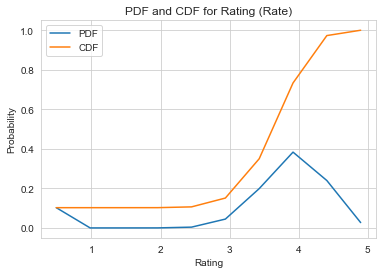

In [76]:
pdf=counts/(sum(counts)) #Here we are plotting the PDF and CDF of "rate" to find out about its distribution
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf,label='PDF')
plt.plot(bin_edges[1:],cdf,label='CDF')
plt.title('PDF and CDF for Rating (Rate)')
plt.ylabel('Probability')
plt.xlabel('Rating')
plt.legend()
plt.show()

We can notice that the distribution of pdf is not even as there are no points for rating between 1 and 2, to get a clear idea about the distribution we plot a bar graph.

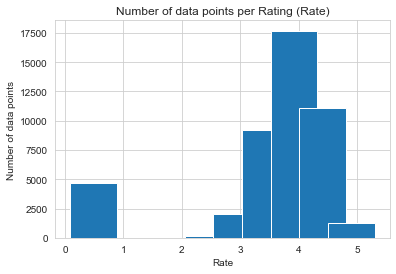

In [77]:
plt.bar(bin_edges[1:],counts)
plt.xlabel('Rate')
plt.ylabel('Number of data points')
plt.title('Number of data points per Rating (Rate)')
plt.show()

We can observe that, while there are a lot of points between the rating of 3 and 5 and good amount of points for 0, there is no points between 1 and 2.
for us to use this feature to find our class label, the distribution of data should be evenly distributed.

In [78]:
counts,bin_edges = np.histogram(df.avg_user_rating, bins=10, density=False)
print(counts)
print(bin_edges)

[ 2314     0  1449   500  2241  2978  8409  9445 11869  6937]
[0.  0.5 1.  1.5 2.  2.5 3.  3.5 4.  4.5 5. ]


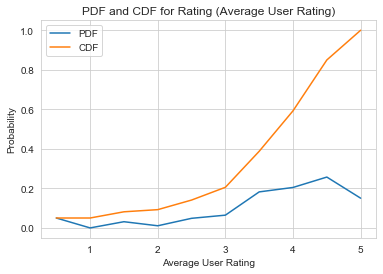

In [79]:
pdf=counts/(sum(counts))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf,label='PDF')
plt.plot(bin_edges[1:],cdf,label='CDF')
plt.title('PDF and CDF for Rating (Average User Rating)')
plt.ylabel('Probability')
plt.xlabel('Average User Rating')
plt.legend()
plt.show()

Unlike the previous feature, the data looks like its distributed in a better way. We plot the bar graph to visualize the same.

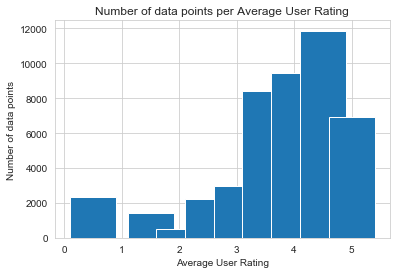

In [80]:
plt.bar(bin_edges[1:],counts)
plt.xlabel('Average User Rating')
plt.ylabel('Number of data points')
plt.title('Number of data points per Average User Rating')
plt.show()

It looks like the number of points whch were having 0 as rating is here and there are some points between 1 and 2.
We do more analysis, like mean and percentile to find out more about the distribution of their data.

In [81]:
print("Rate : ")
print('Maximum value of rate : {}'.format(df.rate.max()))
print("Median value of rate : {}".format(np.median(df.rate)))
print('Mean rate with an outlier value : {}'.format(np.median(np.append(df.rate,50))))
print()
print("avg_user_rating : ")
print('Maximum value of avg_user_rating : {}'.format(df.avg_user_rating.max()))
print("Mean value of avg_user_rating : {}".format(np.median(df.avg_user_rating)))
print('Mean avg_user_rating with an outlier value : {}'.format(np.median(np.append(df.avg_user_rating,50))))

Rate : 
Maximum value of rate : 4.9
Median value of rate : 3.7
Mean rate with an outlier value : 3.7

avg_user_rating : 
Maximum value of avg_user_rating : 5.0
Mean value of avg_user_rating : 3.71
Mean avg_user_rating with an outlier value : 3.71


In [82]:
print('Percentiles for Rate:')
for i in range(0,100,5):
    print('The {} percentile is {}'.format(i,np.percentile(df.rate,i)))
for i in range(90,100):
    print('The {} percentile is {}'.format(i,np.percentile(df.rate,i)))

Percentiles for Rate:
The 0 percentile is 0.0
The 5 percentile is 0.0
The 10 percentile is 0.0
The 15 percentile is 2.9
The 20 percentile is 3.1
The 25 percentile is 3.3
The 30 percentile is 3.4000000000000004
The 35 percentile is 3.5
The 40 percentile is 3.5
The 45 percentile is 3.6
The 50 percentile is 3.7
The 55 percentile is 3.7
The 60 percentile is 3.8
The 65 percentile is 3.9
The 70 percentile is 3.9
The 75 percentile is 4.0
The 80 percentile is 4.0
The 85 percentile is 4.1
The 90 percentile is 4.2
The 95 percentile is 4.4
The 90 percentile is 4.2
The 91 percentile is 4.2
The 92 percentile is 4.3
The 93 percentile is 4.3
The 94 percentile is 4.3
The 95 percentile is 4.4
The 96 percentile is 4.4
The 97 percentile is 4.4
The 98 percentile is 4.5
The 99 percentile is 4.6


In [83]:
print('Percentiles for Average User Rating:')
for i in range(0,100,5):
    print('The {} percentile is {}'.format(i,np.percentile(df.avg_user_rating,i)))
for i in range(90,100):
    print('The {} percentile is {}'.format(i,np.percentile(df.avg_user_rating,i)))

Percentiles for Average User Rating:
The 0 percentile is 0.0
The 5 percentile is 0.0
The 10 percentile is 2.0
The 15 percentile is 2.5
The 20 percentile is 2.92
The 25 percentile is 3.0
The 30 percentile is 3.14
The 35 percentile is 3.33
The 40 percentile is 3.5
The 45 percentile is 3.6
The 50 percentile is 3.71
The 55 percentile is 3.85
The 60 percentile is 4.0
The 65 percentile is 4.0
The 70 percentile is 4.0
The 75 percentile is 4.14
The 80 percentile is 4.28
The 85 percentile is 4.5
The 90 percentile is 4.67
The 95 percentile is 5.0
The 90 percentile is 4.67
The 91 percentile is 4.75
The 92 percentile is 4.83
The 93 percentile is 5.0
The 94 percentile is 5.0
The 95 percentile is 5.0
The 96 percentile is 5.0
The 97 percentile is 5.0
The 98 percentile is 5.0
The 99 percentile is 5.0


#### 5.11 Observations:

-  Rate has a lot of data points which has a rating of 4.
-  There are any points between 1 and 2 for Rate.
-  Average User Rating has a better distribution than Rate.
-  In the paper from literature survey, they had used rate to find class label with a threshold of 3.7, anything above was considered success and rating below 3.7 was failure.
-  From our percentiles we can oberve that 3.7 comes in the 50th percentile of rate, but from our analysis, we would use Average User rating for class labels.
-  According to this paper https://www.wisk.ai/blog/restaurant-data-analytics-metrics-to-track-and-optimize-to-increase-profits 
an average restaurant has a rating of 3 and if we take 3.7 as threshold, even though we would a balanced dataset, we would consider a lot of average restaurant as failures which is not the same in the rea world.
-  We would like to consider the Average User Rating Feature as our class Label and constider this problem as a regression one instead of building a normal binary classification.

In [84]:
# We are defining a function class_labels which takes the dataframe, feature to be used and the threshold for calculating CL
# We check every value with threshold and if it is less we append the class label as 0 and 1 if its greater.
# We return the appended list of class label which will be used in further EDA

def class_labels(DataFrame,Feature):
    class_label=[]
    for i in DataFrame[Feature].values:
        if i<1:
            class_label.append(0)
        elif i>=1 and i<2:
            class_label.append(1)
        elif i>=2 and i<3:
            class_label.append(2)
        elif i>=3 and i<=4:
            class_label.append(3)
        elif i>=4 and i<5:
            class_label.append(4)
        else:
            class_label.append(5)
    return class_label

In [85]:
class_label = class_labels(df,'avg_user_rating')
df['class_label'] = class_label
#df.drop(columns=['avg_user_rating'],inplace=True)
df

C:\Users\Kaushal\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type),...,total_cuisines,multitype_restaurant,RevPASH,Total_P,Male_P,Female_P,Grocery_conc,Restaurant_conc,Cafe_conc,class_label
0,jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,Buffet,...,3,No,96.0,361799,101663,89614,1.85462,1.62798,0.29298,4
1,spice_elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,Buffet,...,3,No,112.0,361799,101663,89614,1.85462,1.62798,0.29298,3
2,san_churro_cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,Buffet,...,3,Yes,160.0,361799,101663,89614,1.85462,1.62798,0.29298,3
3,addhuri_udupi_bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300,Buffet,...,2,No,105.0,361799,101663,89614,1.85462,1.62798,0.29298,3
4,grand_village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600,Buffet,...,2,No,12.0,122889,31346,27824,2.07505,2.09132,0.51266,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46137,topsy_turvey,No,No,0.0,0,Whitefield,Bar,Finger Food,900,Pubs and bars,...,1,No,9.0,186768,39078,35595,0.93164,2.59145,0.46046,3
46138,bhagini,No,No,2.5,81,Whitefield,"Casual Dining, Bar","Andhra, South Indian, Chinese, North Indian",800,Pubs and bars,...,4,Yes,24.0,186768,39078,35595,0.93164,2.59145,0.46046,3
46139,best_brews_four_points_by_sheraton_bengaluru_,No,No,3.6,27,Whitefield,Bar,Continental,1500,Pubs and bars,...,1,No,240.0,186768,39078,35595,0.93164,2.59145,0.46046,4
46140,chime_sheraton_grand_bengaluru_whitefield_hote...,No,Yes,4.3,236,"ITPL Main Road, Whitefield",Bar,Finger Food,2500,Pubs and bars,...,1,No,150.0,39050,8150,7422,0.38413,3.55958,0.53778,3


#### 5.12 Observations:

-  We are adding a temporary feature called class label to our dataframe to distinguish our data during EDA, we will remove it after we have completed our plots and analysis. We are doing this because there are a lot of unique ratings in Average user ratings and while plotting when we tried to add legends, it was a very big list of all the values

#### 5.2 Pair Plots:

-  'name' is the unique feature for each restaurant, it is different for almost all of them, therefore we don't use that in our pair plots.
-  There are 3 binary features - 'online_order', 'book_table' and 'multipype_restaurant'.
-  There are 12 numeric features - 'rate', 'votes', ', 'approx_cost(for two people)', 'user_votes', 'total_cuisines','RevPASH',    'Total_P', 'Male_P', 'Female_P','Grocery_conc', 'Restaurant_conc' and 'Cafe_conc'
- There are 5 categorical features - 'location', 'rest_type', 'cuisines','listed_in(type)' and 'listed_in(city)'

In [87]:
df.to_csv('result.csv')

In [2]:
df = pd.read_csv('result.csv')
df.drop(columns=['Unnamed: 0'],inplace=True)
df

,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type),...,total_cuisines,multitype_restaurant,RevPASH,Total_P,Male_P,Female_P,Grocery_conc,Restaurant_conc,Cafe_conc,class_label
0,jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,Buffet,...,3,No,96.0,361799,101663,89614,1.85462,1.62798,0.29298,4
1,spice_elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,Buffet,...,3,No,112.0,361799,101663,89614,1.85462,1.62798,0.29298,3
2,san_churro_cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,Buffet,...,3,Yes,160.0,361799,101663,89614,1.85462,1.62798,0.29298,3
3,addhuri_udupi_bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300,Buffet,...,2,No,105.0,361799,101663,89614,1.85462,1.62798,0.29298,3
4,grand_village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600,Buffet,...,2,No,12.0,122889,31346,27824,2.07505,2.09132,0.51266,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46137,topsy_turvey,No,No,0.0,0,Whitefield,Bar,Finger Food,900,Pubs and bars,...,1,No,9.0,186768,39078,35595,0.93164,2.59145,0.46046,3
46138,bhagini,No,No,2.5,81,Whitefield,"Casual Dining, Bar","Andhra, South Indian, Chinese, North Indian",800,Pubs and bars,...,4,Yes,24.0,186768,39078,35595,0.93164,2.59145,0.46046,3
46139,best_brews_four_points_by_sheraton_bengaluru_,No,No,3.6,27,Whitefield,Bar,Continental,1500,Pubs and bars,...,1,No,240.0,186768,39078,35595,0.93164,2.59145,0.46046,4
46140,chime_sheraton_grand_bengaluru_whitefield_hote...,No,Yes,4.3,236,"ITPL Main Road, Whitefield",Bar,Finger Food,2500,Pubs and bars,...,1,No,150.0,39050,8150,7422,0.38413,3.55958,0.53778,3


i. Binary features pair plots: 
there is no point in having pair plots between binary features as it would make no sense.

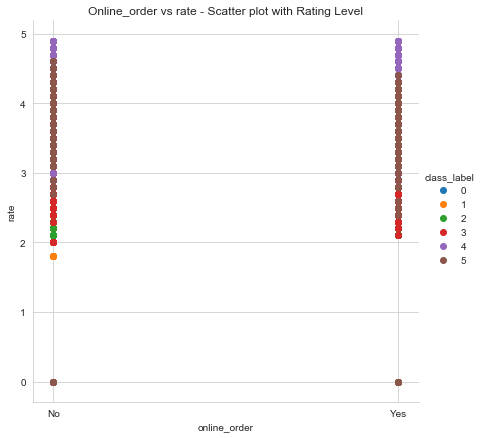

In [3]:
sns.set_style("whitegrid");
sns.FacetGrid(df,hue="class_label",height=6).map(plt.scatter,'online_order','rate').add_legend();
plt.title("Online_order vs rate - Scatter plot with Rating Level")
plt.show()

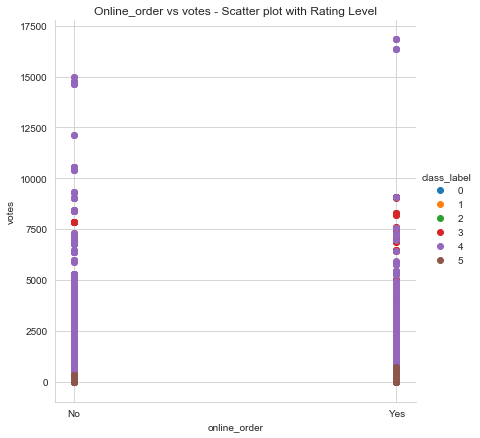

In [4]:
sns.set_style("whitegrid");
sns.FacetGrid(df,hue="class_label",height=6).map(plt.scatter,'online_order','votes').add_legend();
plt.title("Online_order vs votes - Scatter plot with Rating Level")
plt.show()

-  Since the binary feature has only 2 values, most of the data points are overlapping over each other. As a result of this, we cannot make sense of the plot.
-  We have decided not to do pair plots with binary features.
-  Since rate and Average user rating are similar features, we dont analyse rate 

ii. Other Features:

In [5]:
# We define a function plot with takes the first feature with which we want the pair plots as input
# We define a list of all the other features in our dataframe and select each one of them and do pair plots with feature 1

def plot(feature_one):
    features = ['votes', 'approx_cost(for two people)', 'user_votes', 'total_cuisines','RevPASH', 'Total_P', 'Male_P', 'Female_P','Grocery_conc', 'Restaurant_conc', 'Cafe_conc','location', 'rest_type','listed_in(type)','listed_in(city)']
    f1 = feature_one
    for f2 in features:
        if f2!=f1:
            sns.set_style("whitegrid");
            sns.FacetGrid(df,hue="class_label",height=6).map(plt.scatter,f1,f2).add_legend();
            plt.title("{} vs {} - Scatter plot with Rating Level".format(f1,f2))
            plt.show()

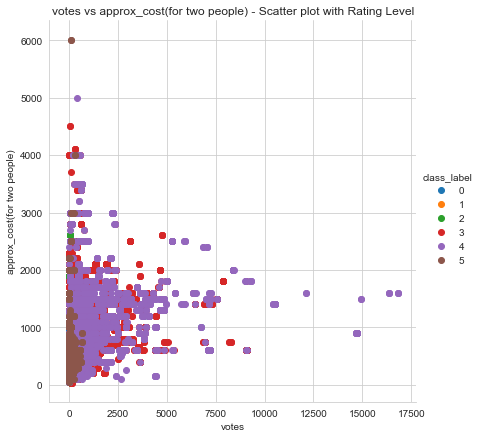

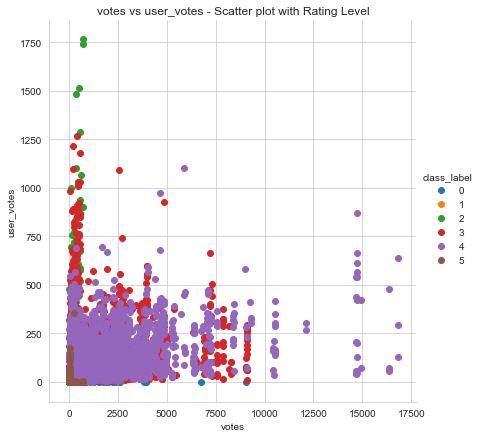

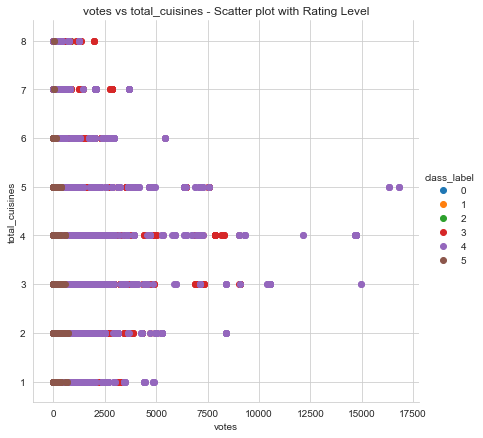

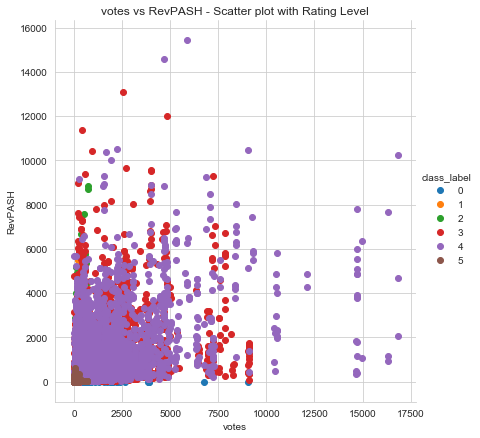

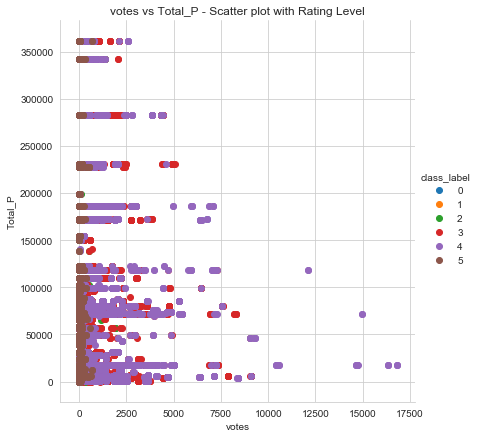

...

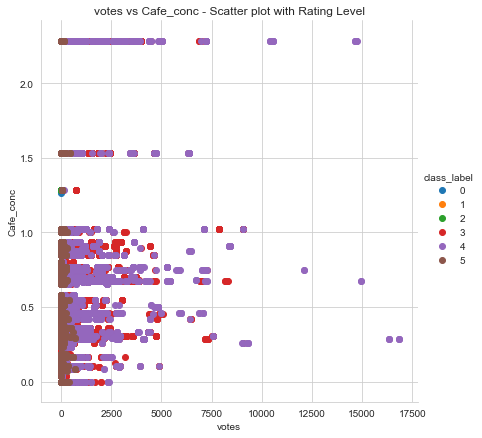

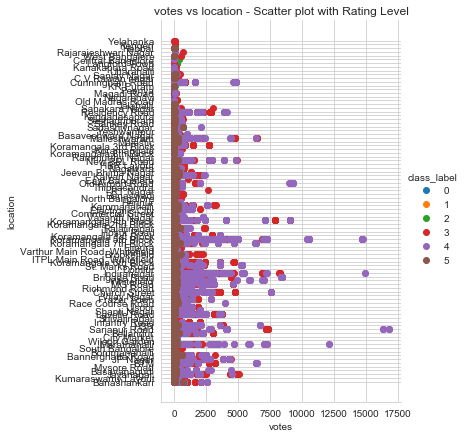

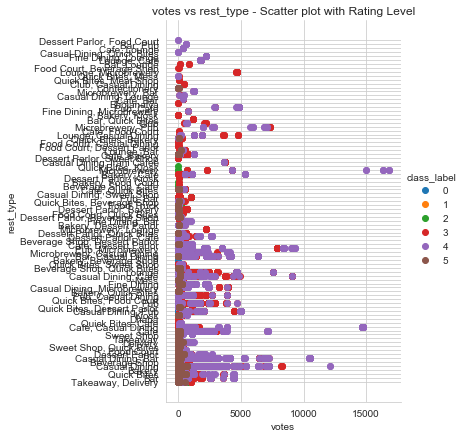

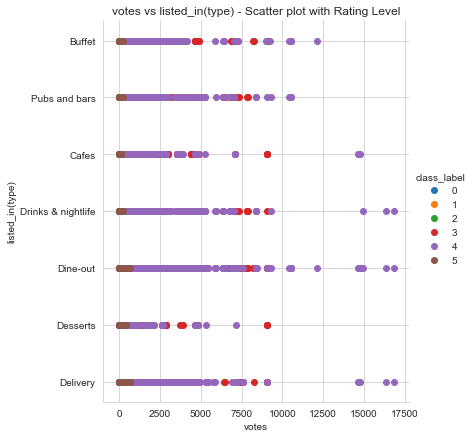

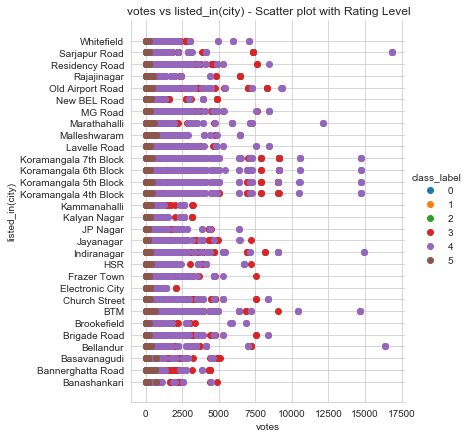

In [6]:
plot('votes')

#### 5.211 Observations:

-  **plot vs approx_cost(for two people)** : There is a lot of overlappig between the points and we cannot differentiate between the class labels
-  **plot vs user_votes** : There is some clear sepeation for class label = 2 when user_votes are greater than 1300 and votes leass than 2500
-  **plot vs total_cuisines** : Both the features are discrete and numeric, but still the class labels are overlapping.
-  **plot vs RevPASH** : Even though majority of the points are clustered around an area, some of the class label = 4 can be sepearted when votes are greater than 10000
-  **plot vs Total_p** : Data is overlapping too much
-  **plot vs Male_p** : Data is overlapping too much
-  **plot vs Female_p** : Data is overlapping too much
-  **plot vs Grocery_conc** : We can oberve an outlier point with class label = 0, other than that, the data is overlapping
-  **plot vs Restaurant_conc** : plot is similar to Grocery_conc with minor differences
-  **plot vs Cafe_conc** : Similar to the previous 2 plots
-  **plot vs Location** : Since there are a lot of unique location values, we can oberve that data points or restaurants are evenly spread out with locations
-  **plot vs Rest_type** : plot is similar to Location as there are a lot of different types of unique values there.
-  **plot vs listed_in(type)** : Both the features are discrete and therefore there is a lot of overlapping of data points.
-  **plot vs listed_in(city)** : Even though the data points are spread better than other features, we cannot differentiate between the class labels.

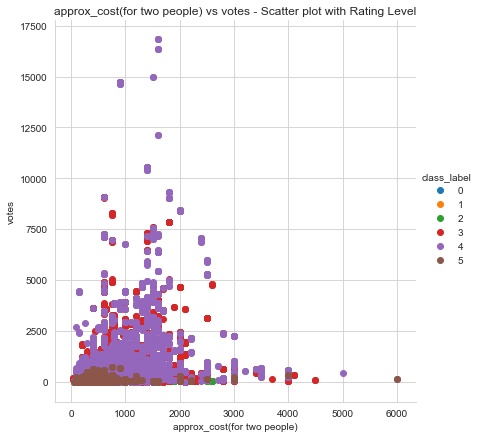

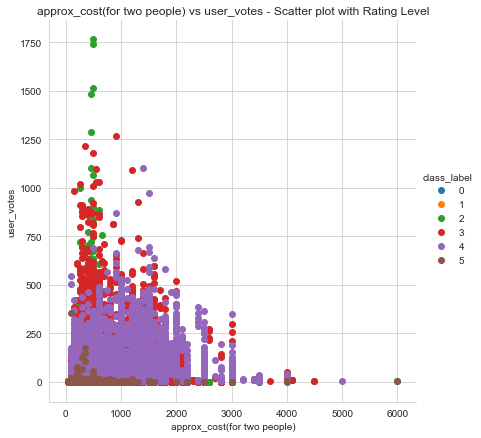

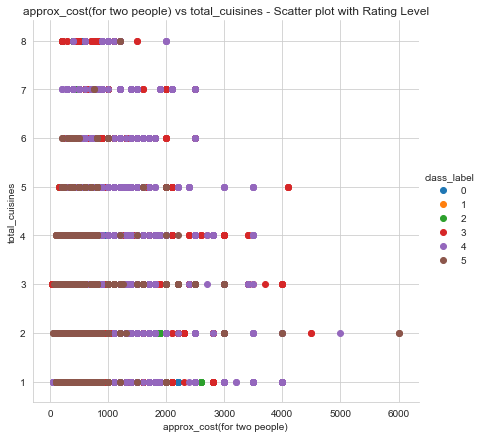

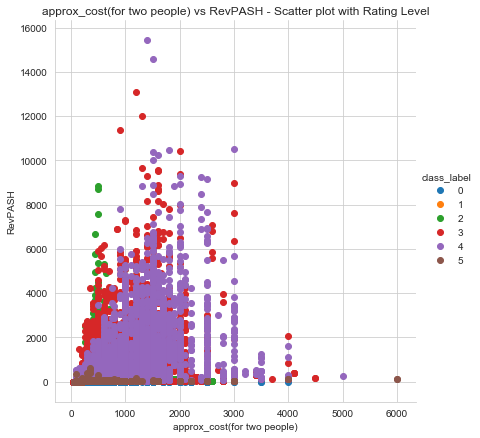

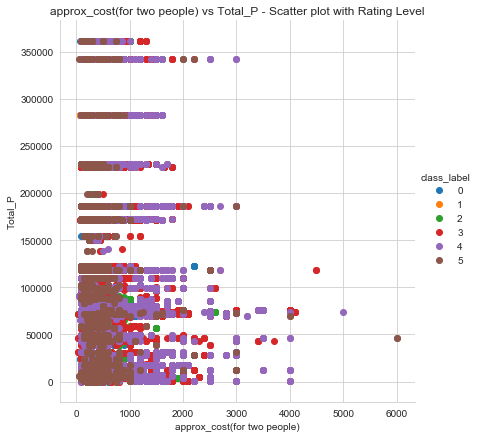

...

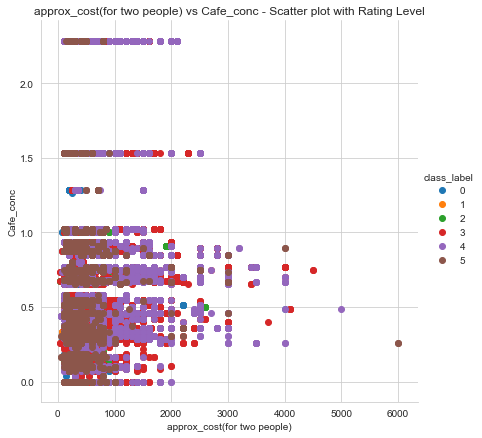

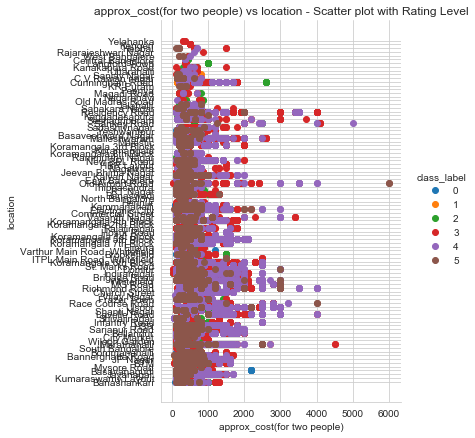

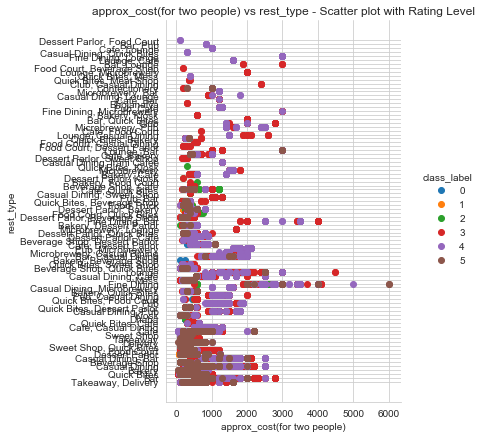

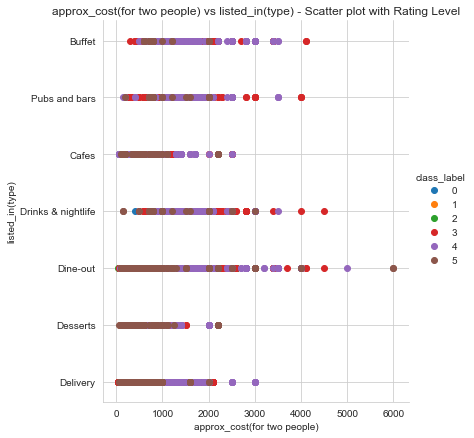

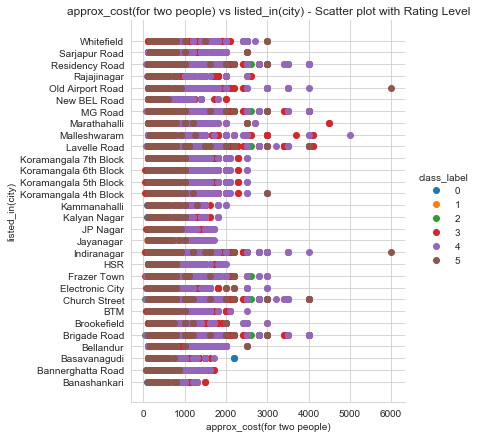

In [7]:
plot('approx_cost(for two people)')

#### 5.212 Observations:

-  **plot vs votes** : There is a lot of overlappig between the points and we cannot differentiate between the class labels
-  **plot vs user_votes** : There is some clear sepeation for class label = 2 when user_votes are greater than 1300 and votes leass than 2500
-  **plot vs total_cuisines** : We can seperate some points when the approx_cost is high at all values of total_cuisines
-  **plot vs RevPASH** : Some Class interval = 2 points can be sepearted when RevPASH is between 6000 and 9000 and approx cost is less than 1000
-  **plot vs Total_p** : Data is overlapping too much, but we can observe all class labels
-  **plot vs Male_p** : Data is overlapping too much
-  **plot vs Female_p** : Data is overlapping too much
-  **plot vs Grocery_conc** : We can oberve an outlier point with class label = 0, other than that, the data is overlapping
-  **plot vs Restaurant_conc** : plot is similar to Grocery_conc with minor differences
-  **plot vs Cafe_conc** : Similar to the previous 2 plots
-  **plot vs Location** : We can differentiate some points at some specific locations when approx_cost is less than 1000
-  **plot vs Rest_type** : plot is slightly better than that of location, as we can sepearte more points when approx cost is less than 2500
-  **plot vs listed_in(type)** : Data is overlapping too much
-  **plot vs listed_in(city)** : Data is overlapping too much

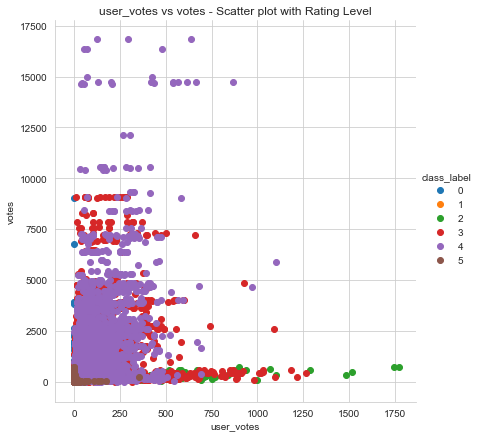

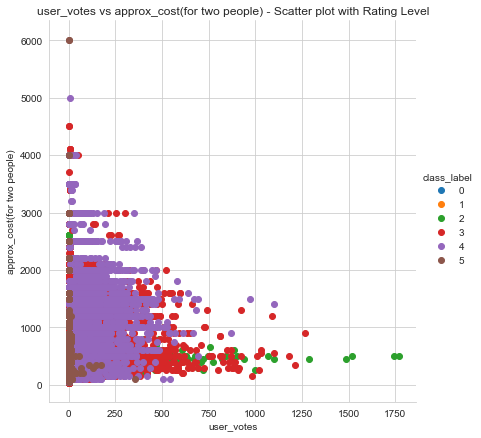

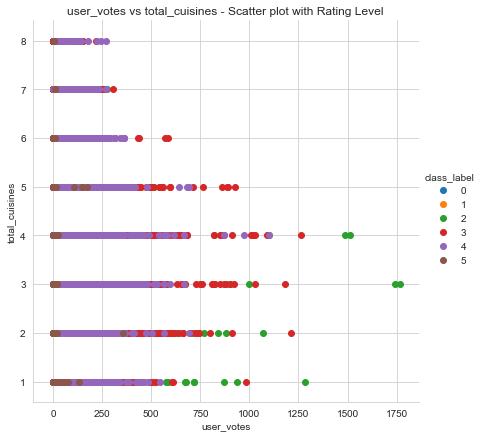

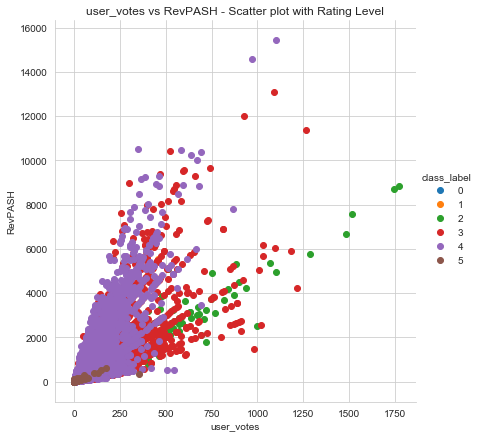

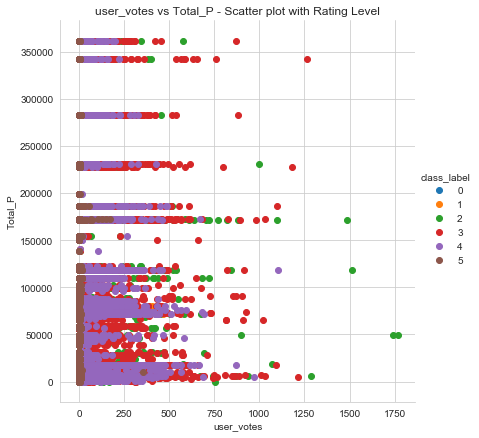

...

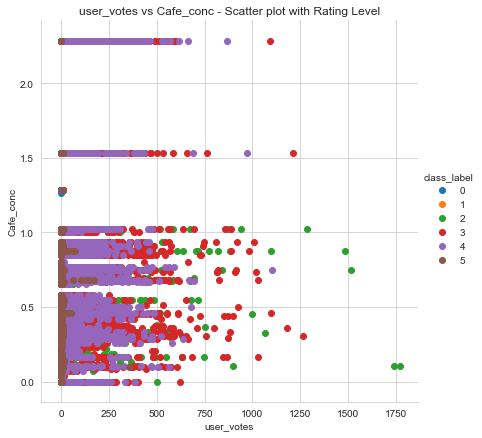

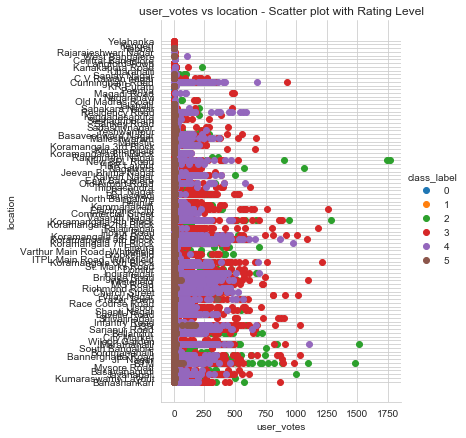

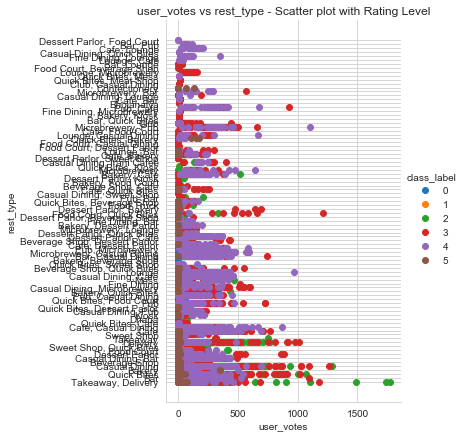

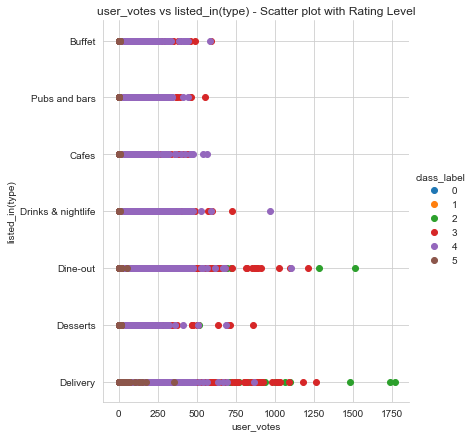

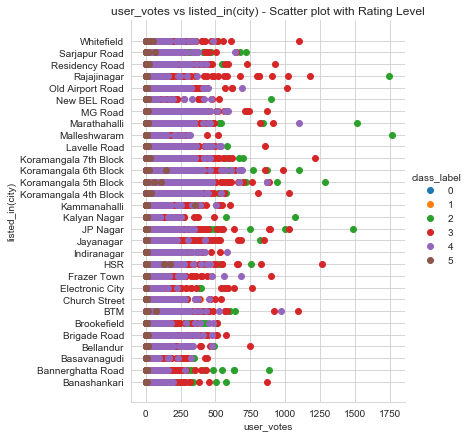

In [8]:
plot('user_votes')

#### 5.213 Observations:

-  **plot vs votes** : There is some clear sepeation for class label = 2 when user_votes are greater than 1300 and votes leass than 2500
-  **plot vs approx_cost(for two people)** : There is some clear sepeation for class label = 2 when user_votes are greater than 1300 and votes leass than 2500
-  **plot vs total_cuisines** : Again Class Label 2 can be sepearted somewhat.
-  **plot vs RevPASH** : There seems to be a pattern relationship between the two as the data points are spreading as both the feature value increases. 
-  **plot vs Total_p** : Better sepeartion of class label 3 and 2 than other graphs.
-  **plot vs Male_p** : Similar to Total_P
-  **plot vs Female_p** : Similar to Total_P
-  **plot vs Grocery_conc** : We can oberve an outlier point with class label = 0 and class label = 2 the data is overlapping
-  **plot vs Restaurant_conc** : plot is similar to Grocery_conc with minor differences
-  **plot vs Cafe_conc** : Similar to the previous 2 plots
-  **plot vs Location** : We can differentiate some points at some specific locations when approx_cost is less than 1000
-  **plot vs Rest_type** : plot is slightly better than that of location, as we can sepearte more points when approx cost is less than 2500
-  **plot vs listed_in(type)** : Data is overlapping too much with some sepeartion for Class interval = 2
-  **plot vs listed_in(city)** : Data is overlapping too much with some sepeartion for Class interval = 2

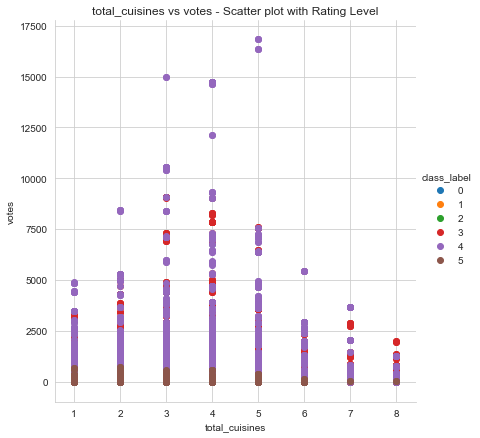

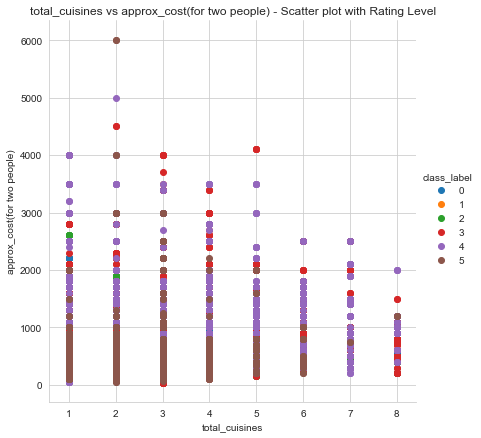

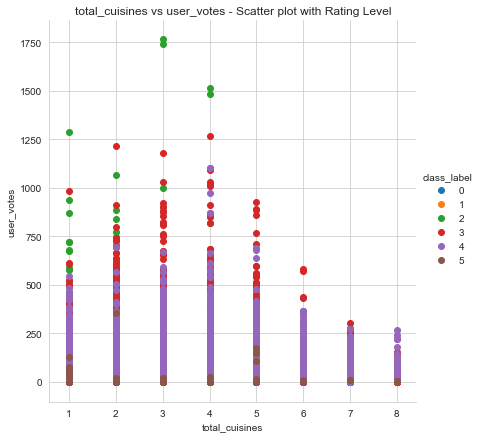

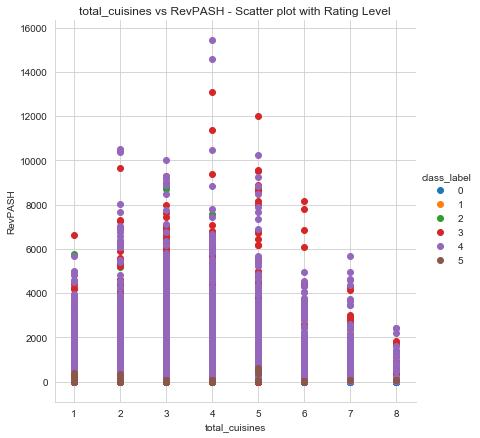

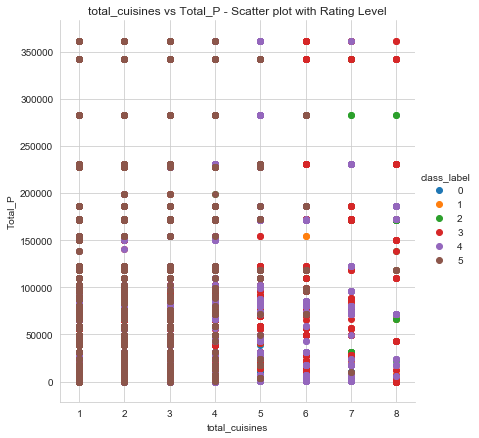

...

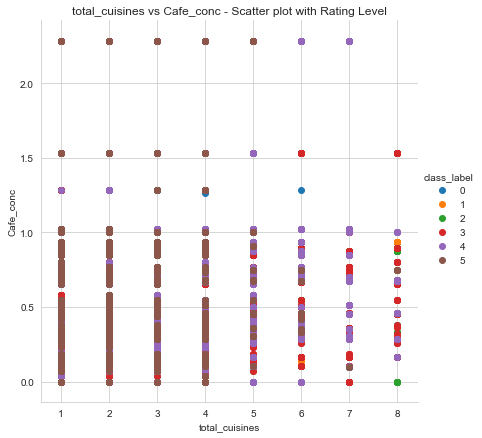

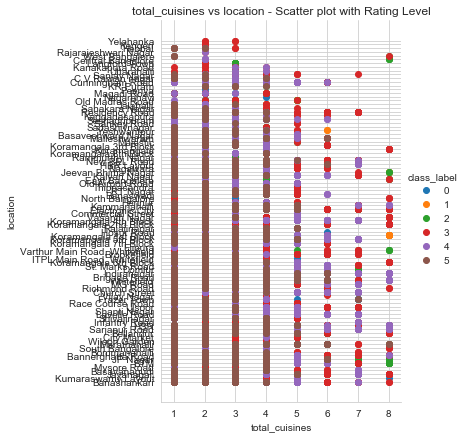

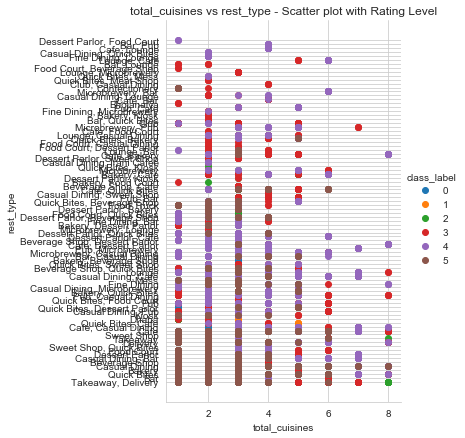

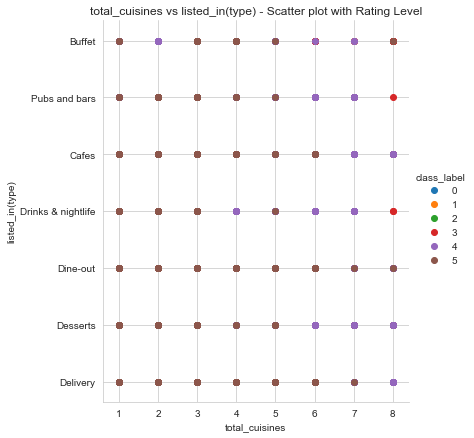

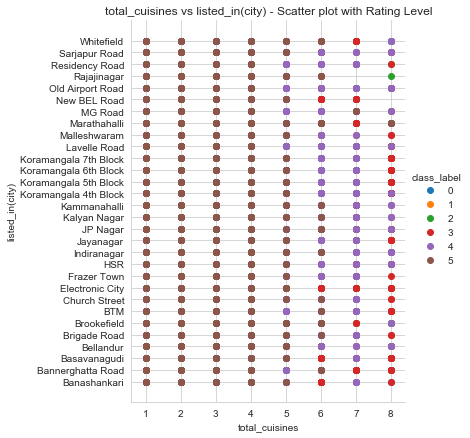

In [9]:
plot('total_cuisines')

#### 5.214 Observations:

-  **plot vs votes** : Both the features are discrete and numeric, but still the class labels are overlapping.
-  **plot vs approx_cost(for two people)** : We can seperate some points when the approx_cost is high at all values of total_cuisines
-  **plot vs user_votes** :Class Interval =2 can be sepearted at user_votes greater than 1250
-  **plot vs RevPASH** : Class Interval =3 and 4 can be sepearted somewhat at very high RevPASH values
-  **plot vs Total_p** : Clear seperation of some points at higher Total_P
-  **plot vs Male_p** : Slightly better than Total_p
-  **plot vs Female_p** : Similar to Total_P
-  **plot vs Grocery_conc** : We can oberve an outlier point with class label = 0 and class label = 2, other than that the data is overlapping
-  **plot vs Restaurant_conc** : plot is similar to Grocery_conc with minor differences
-  **plot vs Cafe_conc** : Similar to the previous 2 plots
-  **plot vs Location** : We can differentiate some points at total cuisines = 8 for some locations
-  **plot vs Rest_type** : Data is overlapping
-  **plot vs listed_in(type)** : Data is made up of 2 discrete features but its overlapping a lot
-  **plot vs listed_in(city)** : Data is made up of 2 discrete features but its overlapping a lot

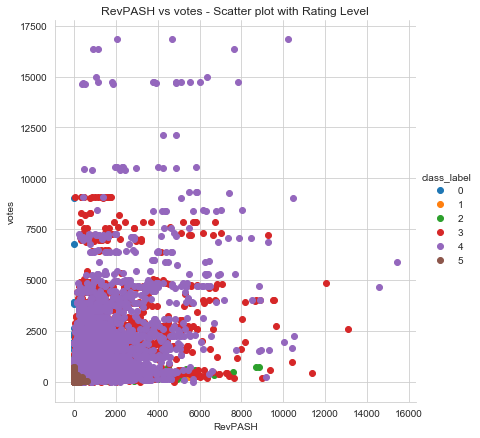

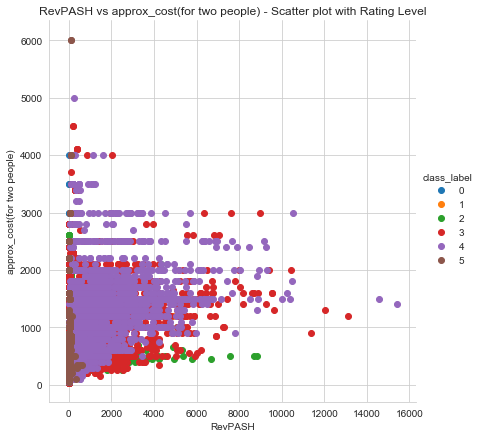

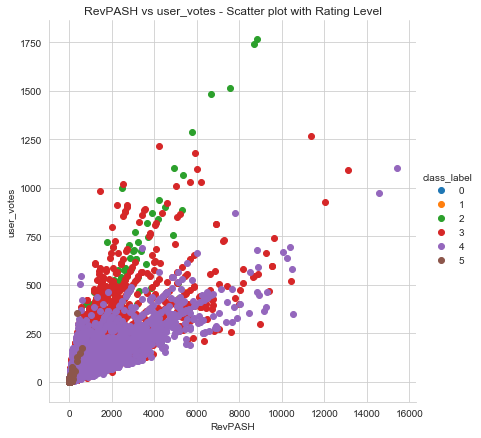

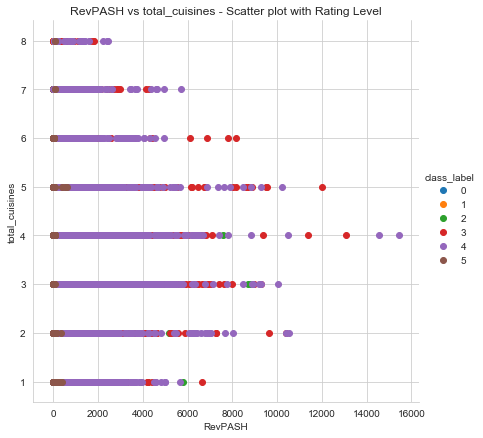

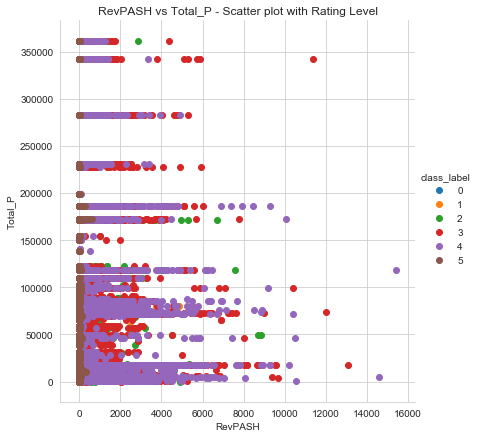

...

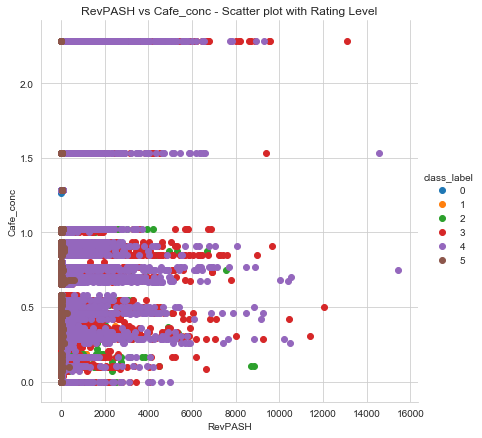

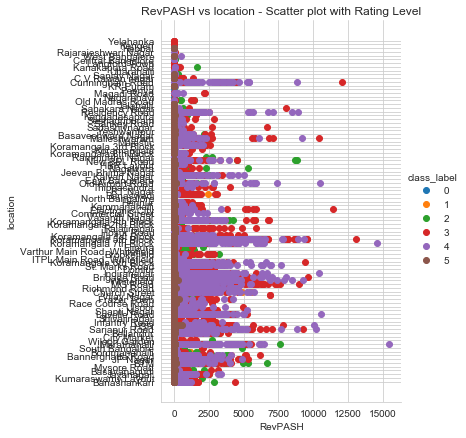

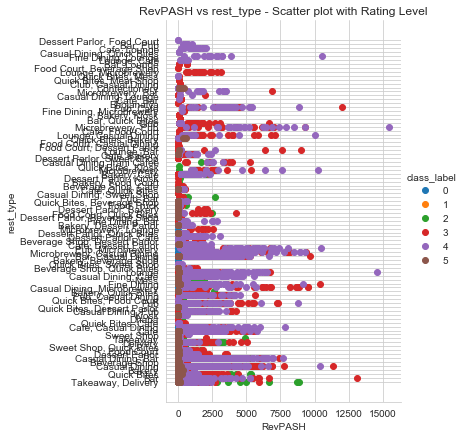

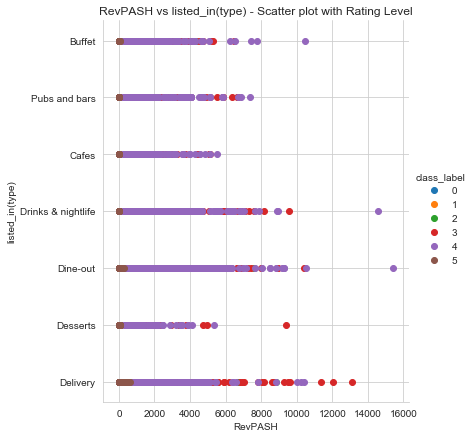

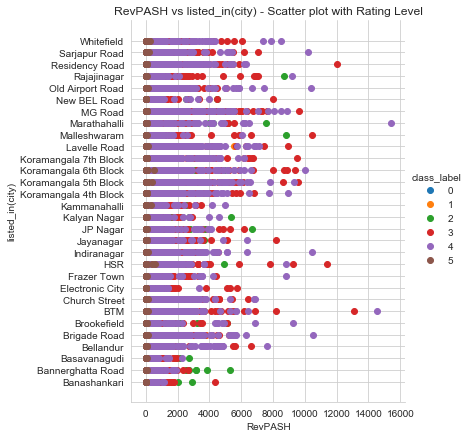

In [10]:
plot('RevPASH')

#### 5.215 Observations:

-  **plot vs votes** : Even though majority of the points are clustered around an area, some of the class label = 4 can be sepearted when votes are greater than 10000
-  **plot vs approx_cost(for two people)** :  Some Class interval = 2 points can be sepearted when RevPASH is between 6000 and 9000 and approx cost is less than 1000
-  **plot vs user_votes** :There seems to be a pattern relationship between the two as the data points are spreading as both the feature value increases.
-  **plot vs total_cuisines** : Class Interval =3 and 4 can be sepearted somewhat at very high RevPASH values
-  **plot vs Total_p** : At higher RevPASH, some data points can be seperated
-  **plot vs Male_p** : Slightly better than Total_p
-  **plot vs Female_p** : Similar to Total_P
-  **plot vs Grocery_conc** : We can oberve an outlier point with class label = 0 , other than that the data is overlapping
-  **plot vs Restaurant_conc** : plot is similar to Grocery_conc with minor differences
-  **plot vs Cafe_conc** : Similar to the previous 2 plots
-  **plot vs Location** : There is some seperation when RevPASH is between 7500 and 10000
-  **plot vs Rest_type** : Data is overlapping
-  **plot vs listed_in(type)** : Data is overlapping
-  **plot vs listed_in(city)** : There is some seperation of data at all location at higher RevPASH

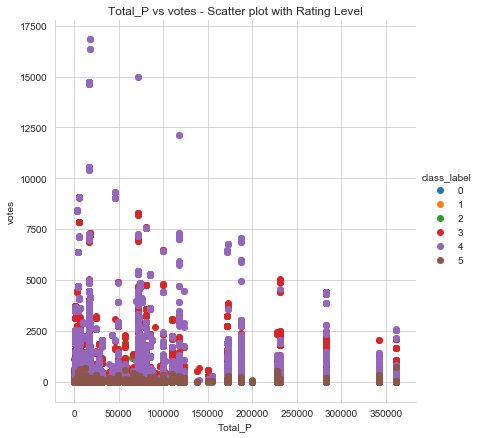

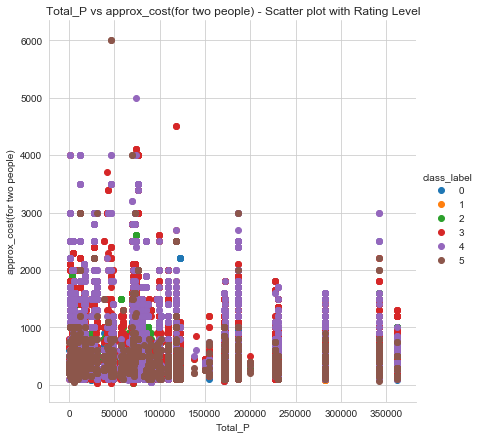

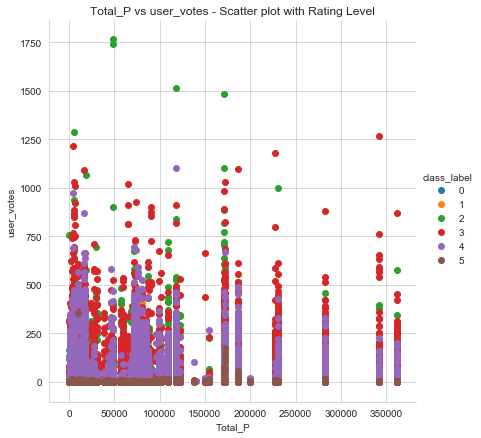

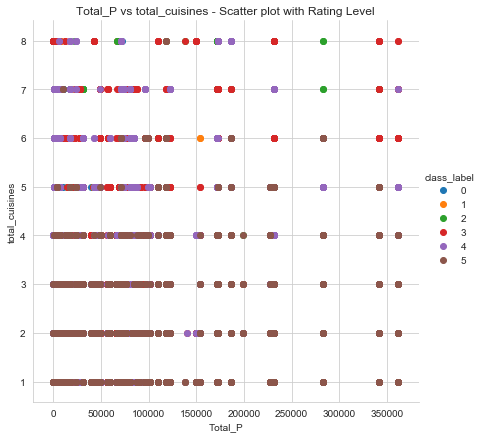

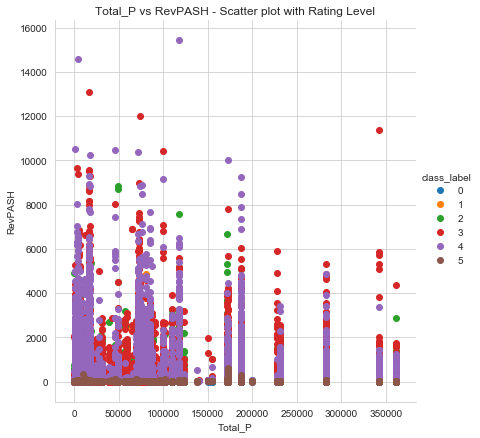

...

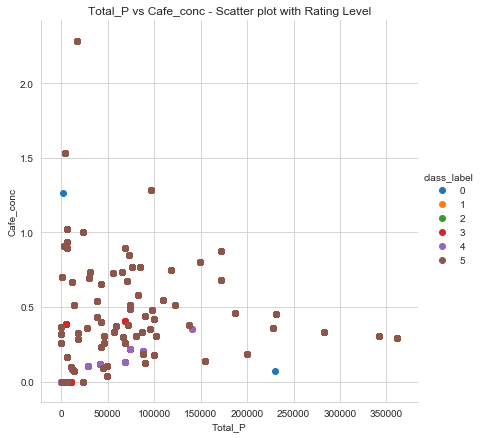

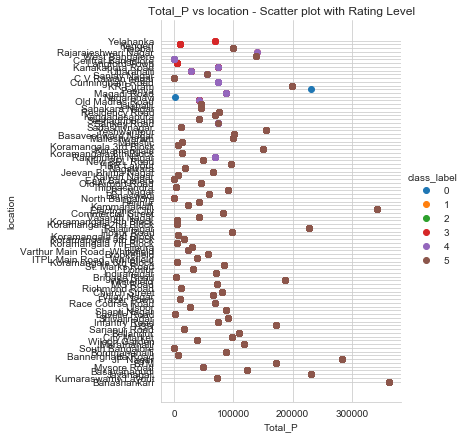

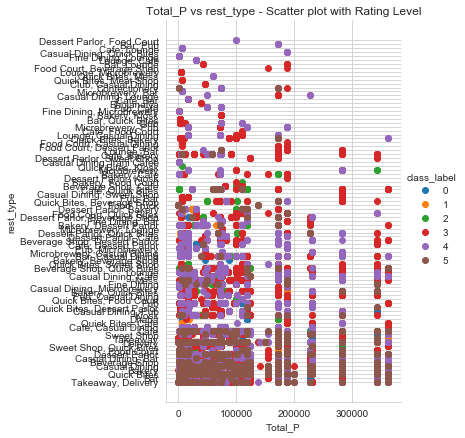

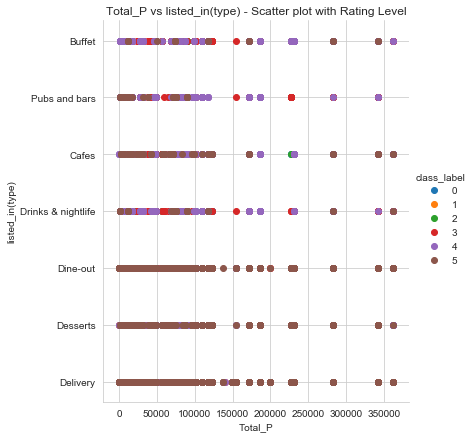

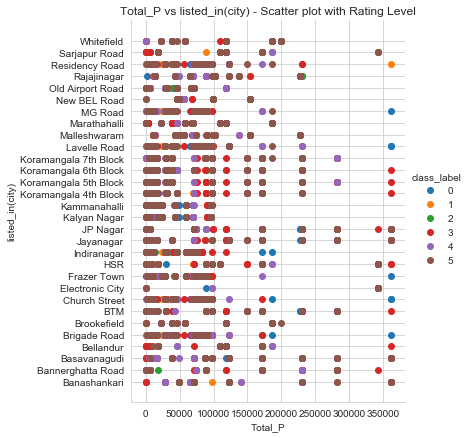

In [11]:
plot('Total_P')

#### 5.216 Observations:

-  **plot vs votes** : Data is overlapping too much, some differentiation can take place when votes is very high
-  **plot vs approx_cost(for two people)** :  Data is overlapping too much, but we can observe almost all class labels
-  **plot vs user_votes** :Better sepeartion of class label 3 and 2 than other graphs.
-  **plot vs total_cuisines** : Clear seperation of some points at higher Total_P
-  **plot vs RevPASH** : At higher RevPASH, some data points can be seperated
-  **plot vs Male_p** : We can only differentiate a couple of points, other than that the plot is highly overlapping
-  **plot vs Female_p** : Similar to Male_P
-  **plot vs Grocery_conc** : data is seperated but mostly dominated by class_label = 5
-  **plot vs Restaurant_conc** : similar to Grocery_conc
-  **plot vs Cafe_conc** : similar to Grocery_conc
-  **plot vs Location** : Some points can be sepearted at low Total_P
-  **plot vs Rest_type** : Better seperation than location
-  **plot vs listed_in(type)** : Data is overlapping
-  **plot vs listed_in(city)** : There is some seperation of data at all location

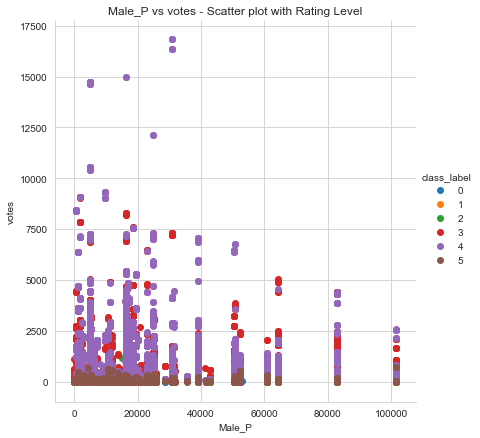

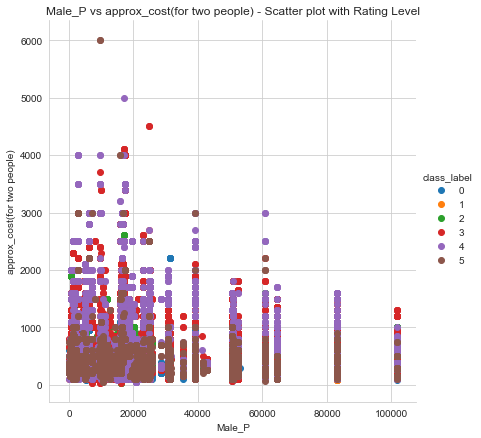

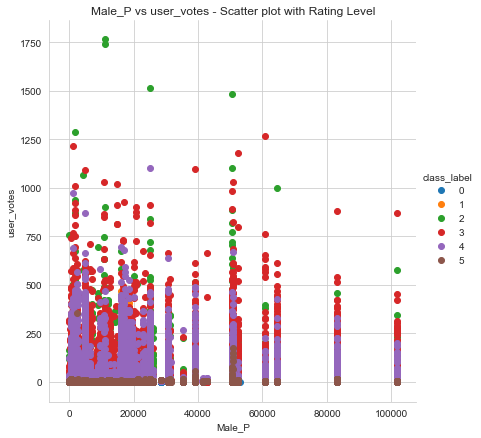

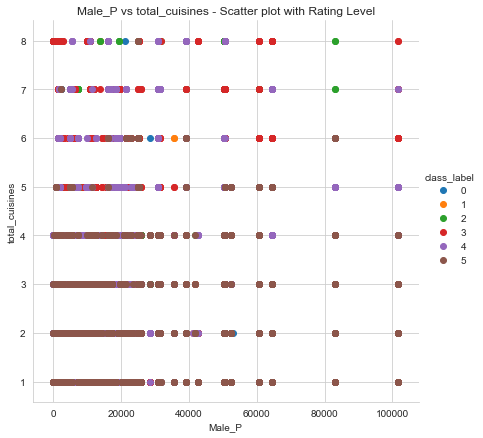

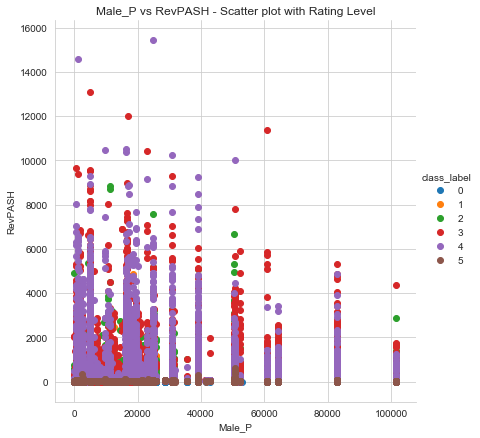

...

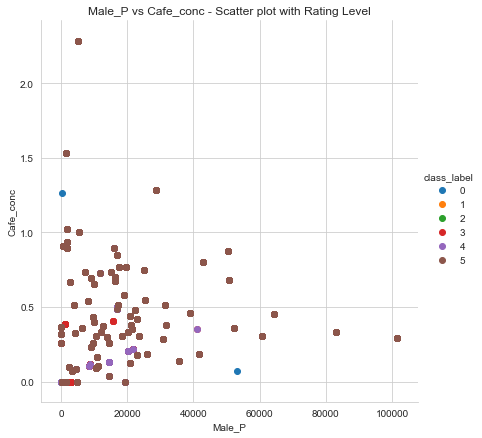

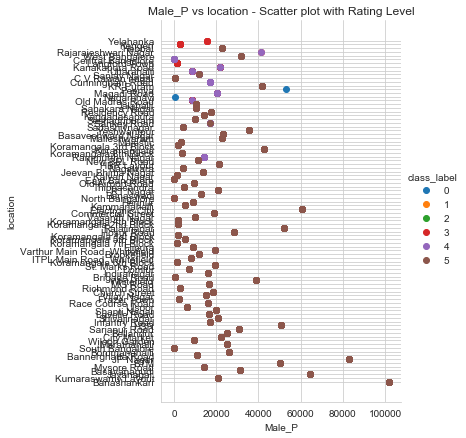

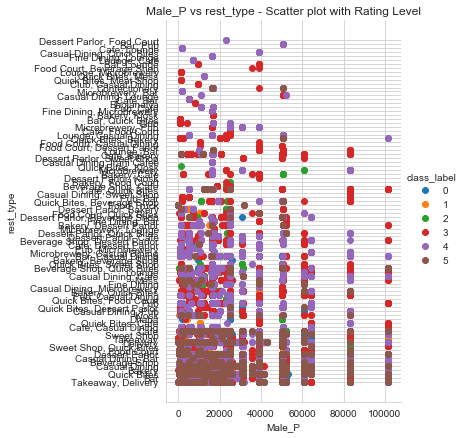

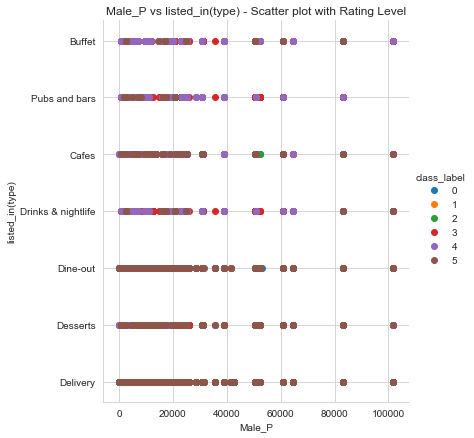

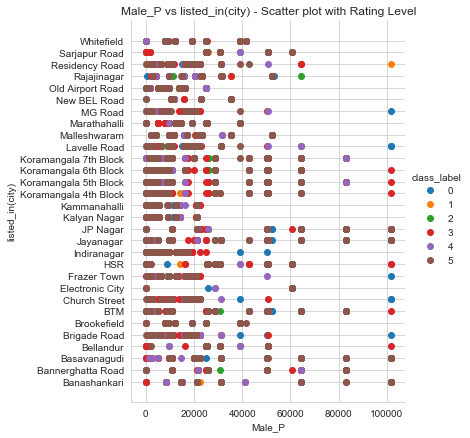

In [12]:
plot('Male_P')

#### 5.217 Observations:

-  **plot vs votes** : Data is overlapping too much, some differentiation can take place when votes is very high
-  **plot vs approx_cost(for two people)** :  Data is overlapping too much, but we can observe almost all class labels
-  **plot vs user_votes** :Better sepeartion of class label 3 and 2 than other graphs.
-  **plot vs total_cuisines** : Clear seperation of some points at higher Total_P
-  **plot vs RevPASH** : At higher RevPASH, some data points can be seperated
-  **plot vs Total_p** : We can only differentiate a couple of points, other than that the plot is highly overlapping
-  **plot vs Female_p** : Similar to Total_P
-  **plot vs Grocery_conc** : data is seperated but mostly dominated by class_label = 5
-  **plot vs Restaurant_conc** : similar to Grocery_conc
-  **plot vs Cafe_conc** : similar to Grocery_conc
-  **plot vs Location** : Some points can be sepearted at low Male_P
-  **plot vs Rest_type** : Better seperation than location
-  **plot vs listed_in(type)** : Data is overlapping
-  **plot vs listed_in(city)** : There is some seperation of data at all location

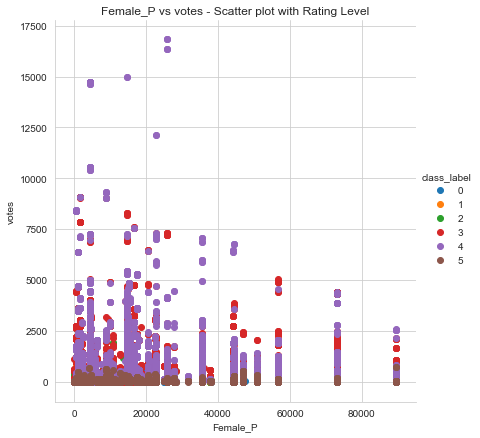

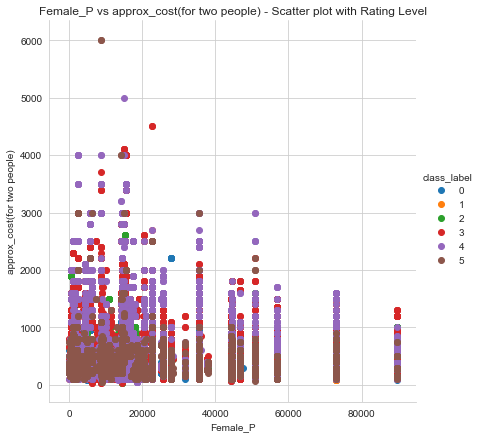

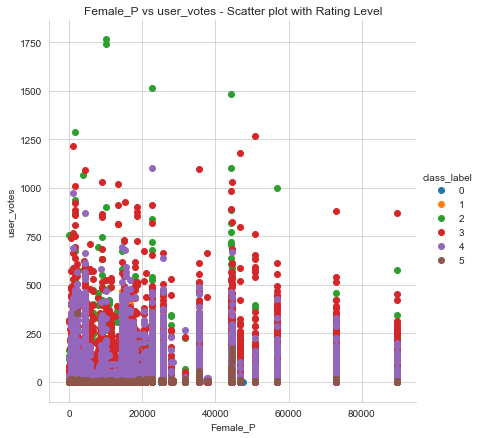

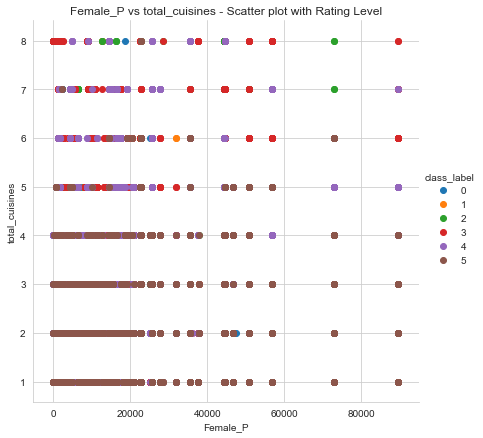

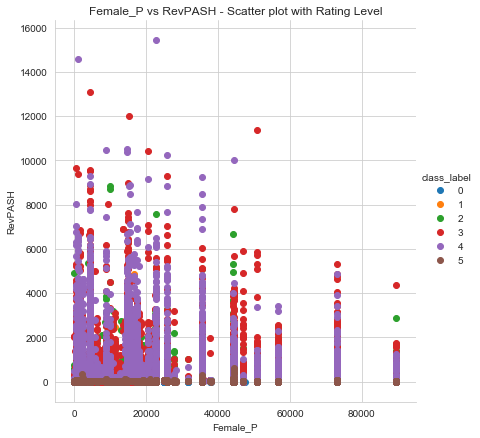

...

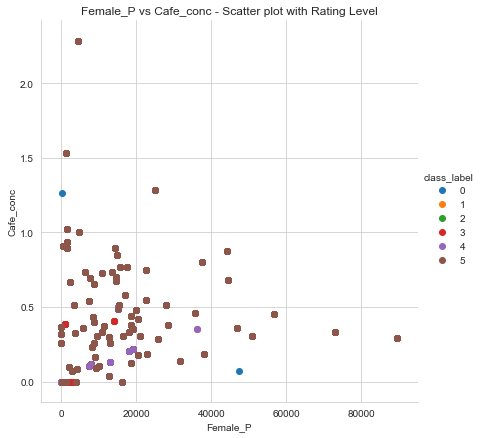

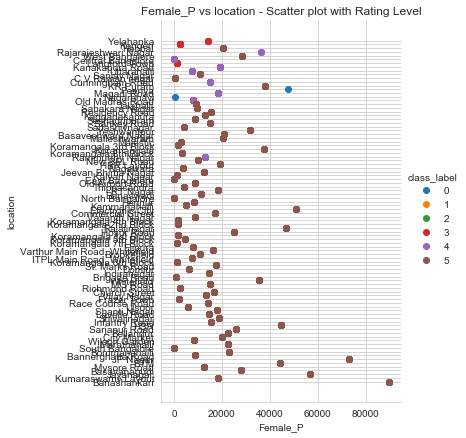

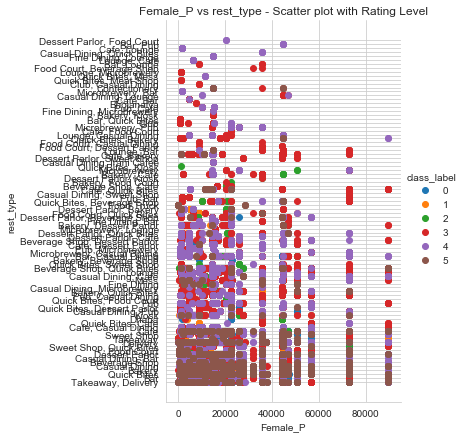

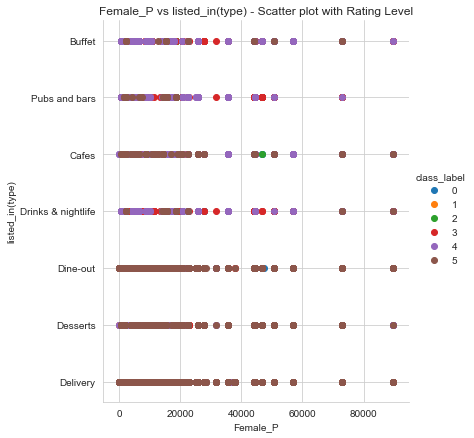

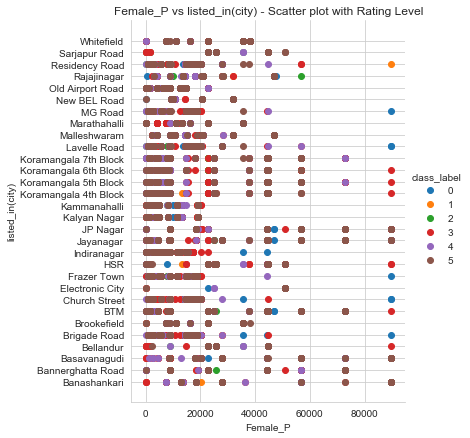

In [13]:
plot('Female_P')

#### 5.218 Observations:

-  **plot vs votes** : Data is overlapping too much, some differentiation can take place when votes is very high
-  **plot vs approx_cost(for two people)** :  Data is overlapping too much, but we can observe almost all class labels
-  **plot vs user_votes** :Better sepeartion of class label 3 and 2 than other graphs.
-  **plot vs total_cuisines** : Clear seperation of some points at higher Total_P
-  **plot vs RevPASH** : At higher RevPASH, some data points can be seperated
-  **plot vs Total_p** : We can only differentiate a couple of points, other than that the plot is highly overlapping
-  **plot vs Male_p** : Similar to Total_P
-  **plot vs Grocery_conc** : data is seperated but mostly dominated by class_label = 5
-  **plot vs Restaurant_conc** : similar to Grocery_conc
-  **plot vs Cafe_conc** : similar to Grocery_conc
-  **plot vs Location** : Some points can be sepearted at low Female_P
-  **plot vs Rest_type** : Better seperation than location
-  **plot vs listed_in(type)** : Data is overlapping
-  **plot vs listed_in(city)** : There is some seperation of data at all location

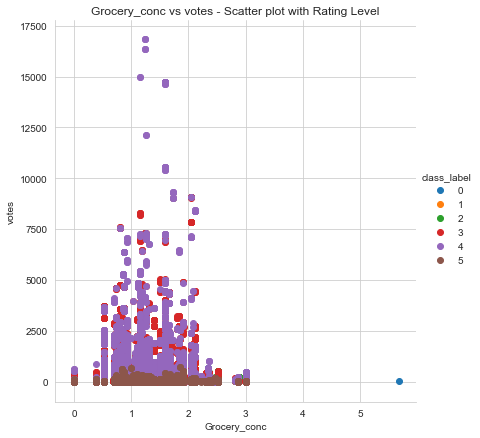

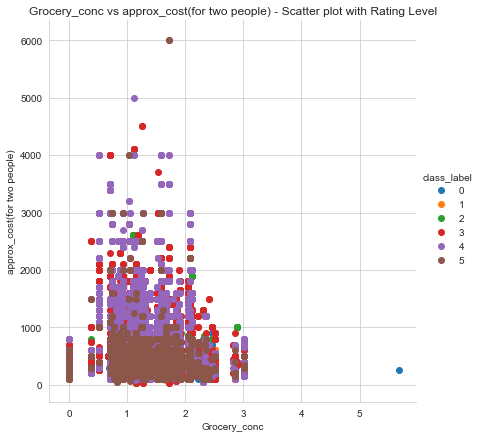

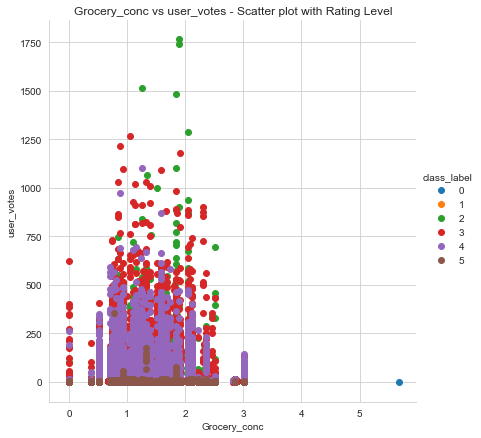

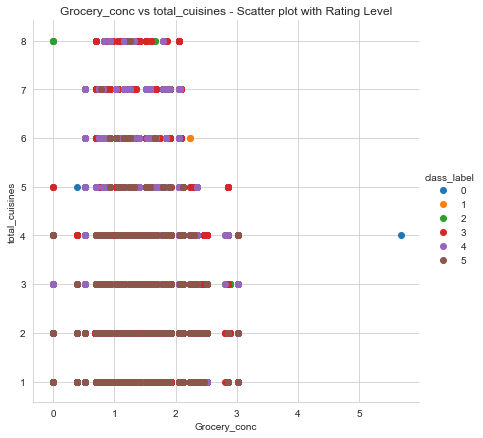

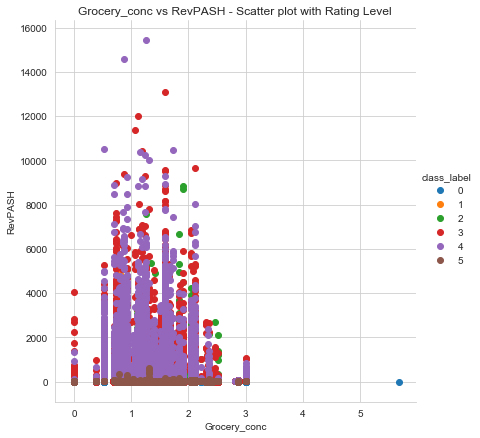

...

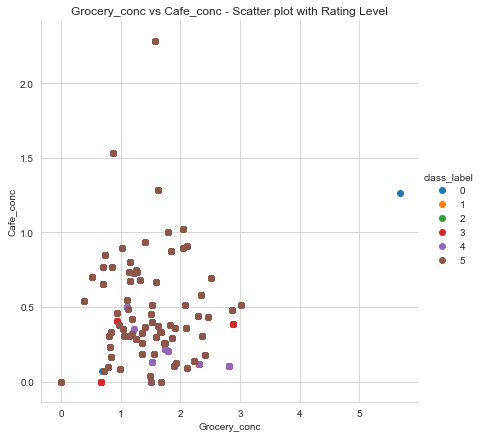

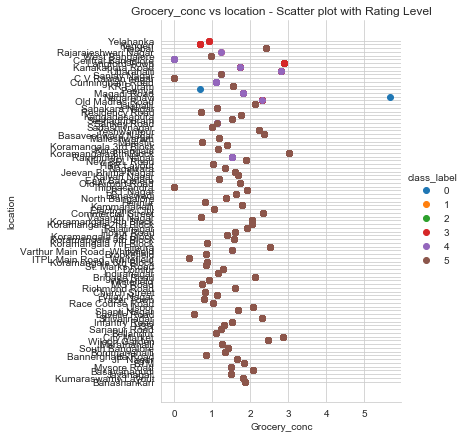

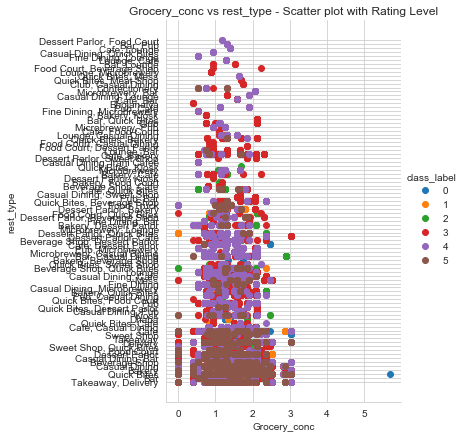

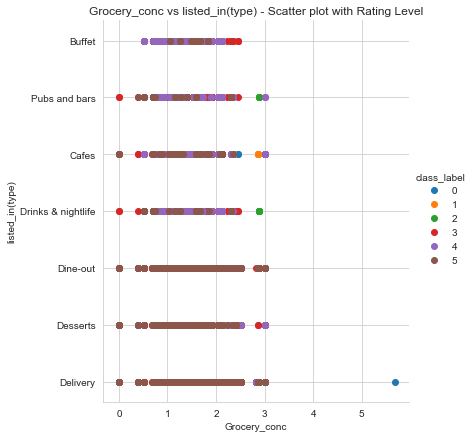

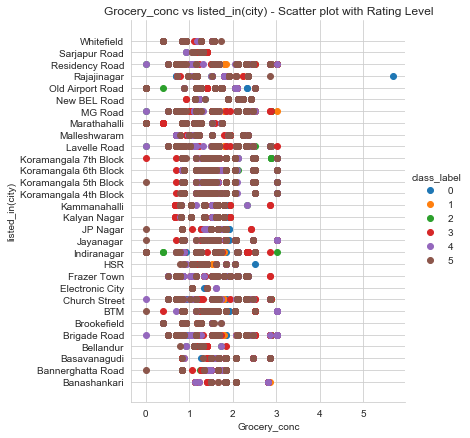

In [14]:
plot('Grocery_conc')

#### 5.219 Observations:

-  **plot vs votes** : We can oberve an outlier point with class label = 0, other than that, the data is overlapping
-  **plot vs approx_cost(for two people)** :  We can oberve an outlier point with class label = 0 and 2, other than that, the data is overlapping
-  **plot vs user_votes** :We can oberve an outlier point with class label = 0, other than that, the data is overlapping
-  **plot vs total_cuisines** : We can oberve an outlier point with class label = 0, other than that, the data is overlapping
-  **plot vs RevPASH** : We can oberve an outlier point with class label = 0 and 2, other than that, the data is overlapping
-  **plot vs Total_p** : data is seperated but mostly dominated by class_label = 5
-  **plot vs Male_p** : Similar to Total_P
-  **plot vs Female_p** : Similar to Total_P
-  **plot vs Restaurant_conc** : Data is overlapping
-  **plot vs Cafe_conc** : similar to Restaurant_conc
-  **plot vs Location** : Some points can be sepearted at low Grocery_conc
-  **plot vs Rest_type** : Better seperation than location
-  **plot vs listed_in(type)** : Data is overlapping
-  **plot vs listed_in(city)** : There is some seperation of data at all location

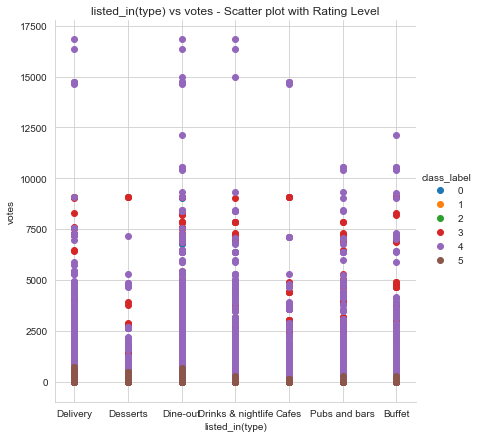

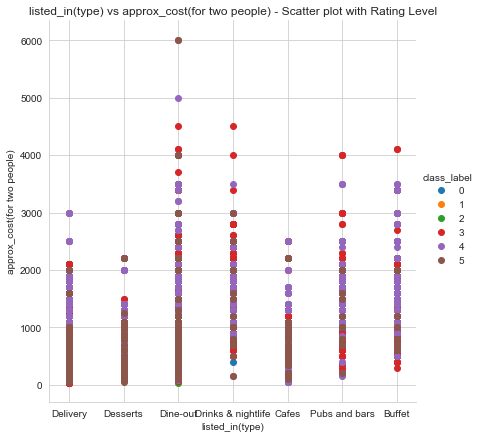

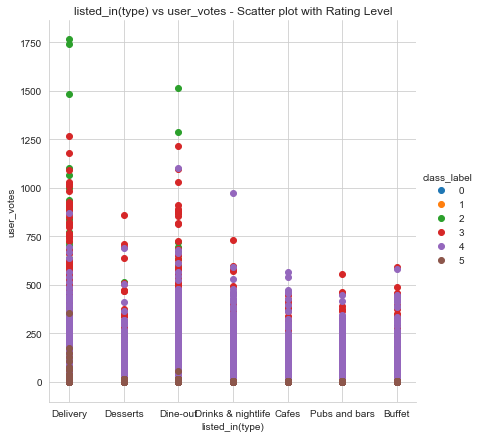

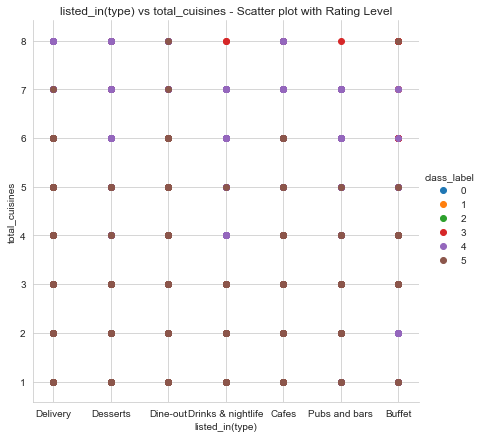

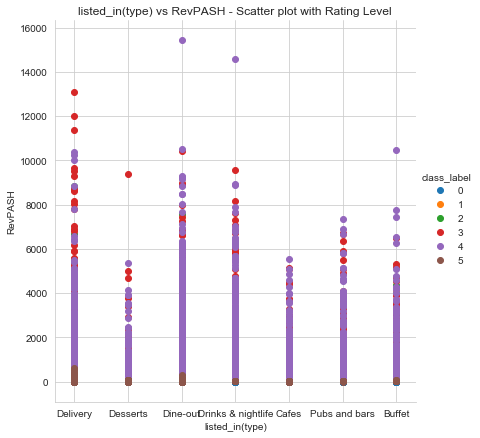

...

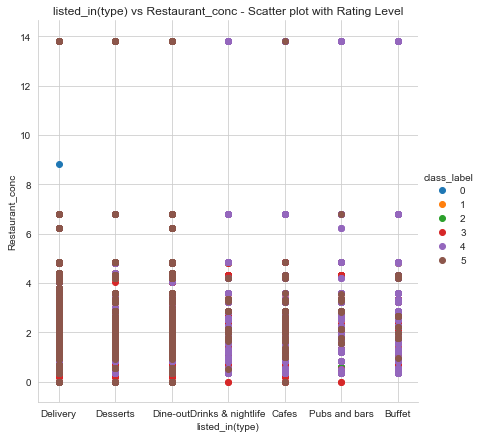

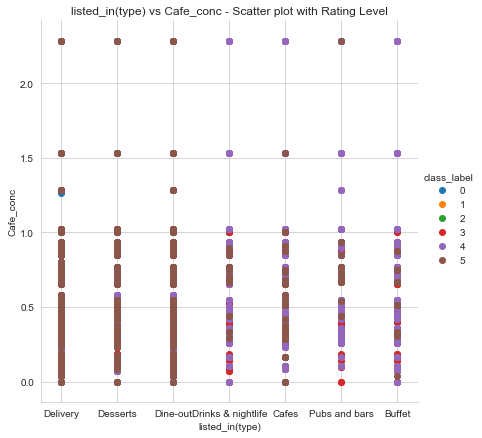

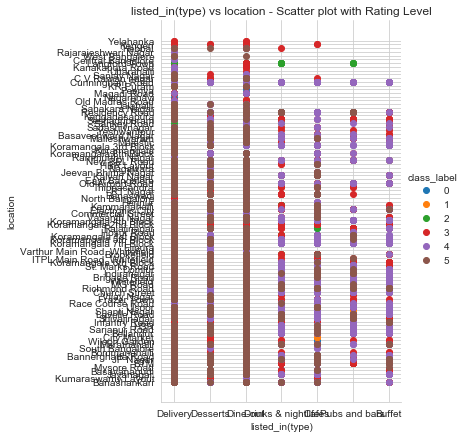

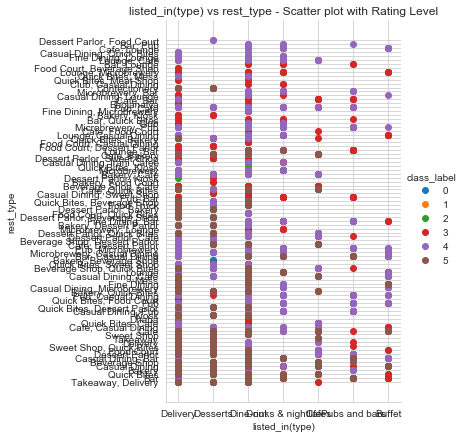

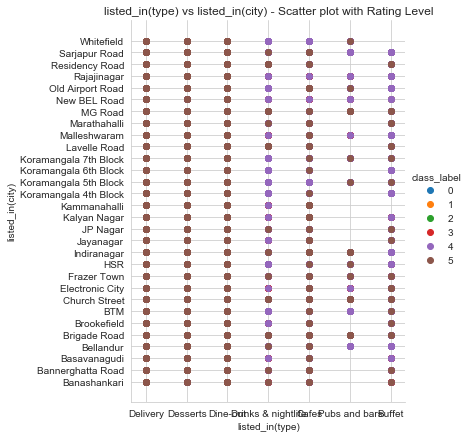

In [15]:
plot('listed_in(type)')

#### 5.220 Observations:

-  **plot vs votes** : Both the features are discrete and therefore there is a lot of overlapping of data points.
-  **plot vs approx_cost(for two people)** :  Data is overlapping too much
-  **plot vs user_votes** : Data is overlapping too much with some sepearuion at class label = 2
-  **plot vs total_cuisines** :  Data is made up of 2 discrete features but its overlapping a lot
-  **plot vs RevPASH** : Data is overlapping
-  **plot vs Total_p** : Data is overlapping
-  **plot vs Male_p** : Data is overlapping
-  **plot vs Female_p** : Data is overlapping
-  **plot vs Restaurant_conc** : Data is overlapping
-  **plot vs Cafe_conc** : Data is overlapping
-  **plot vs Location** : Data is overlapping
-  **plot vs Rest_type** : Data is overlapping
-  **plot vs Gorcery_type** : Data is overlapping
-  **plot vs listed_in(city)** : Data is overlapping

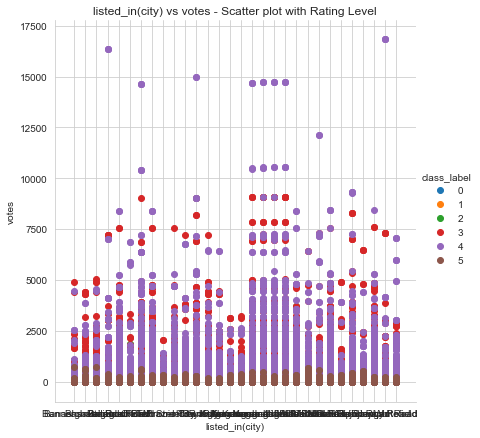

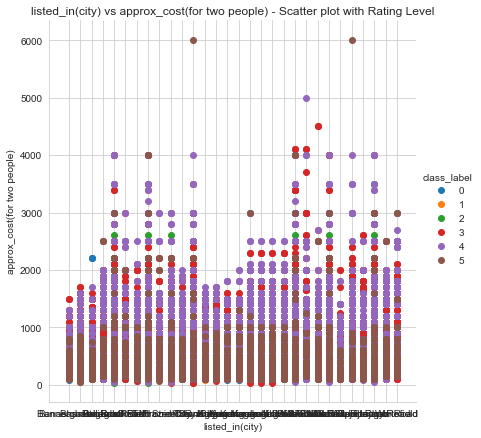

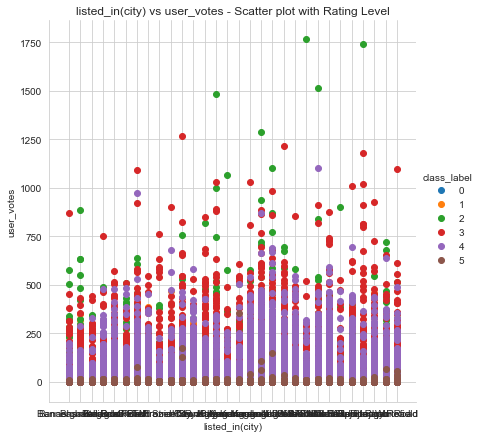

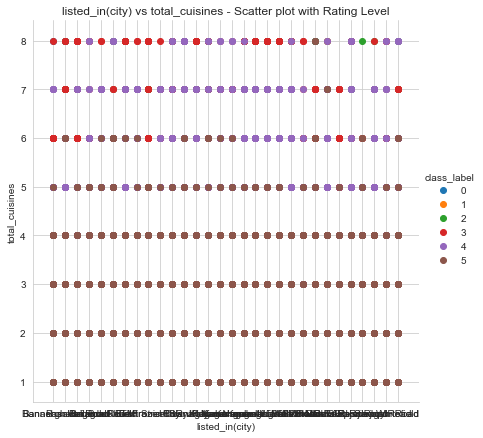

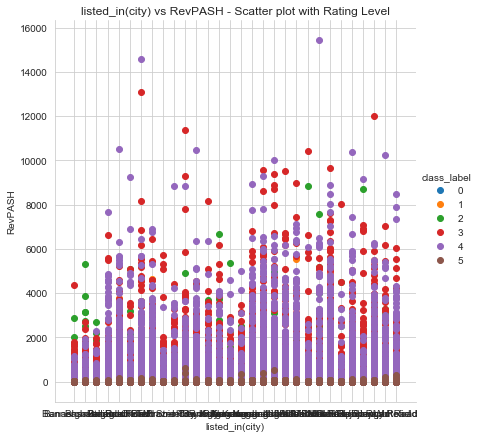

...

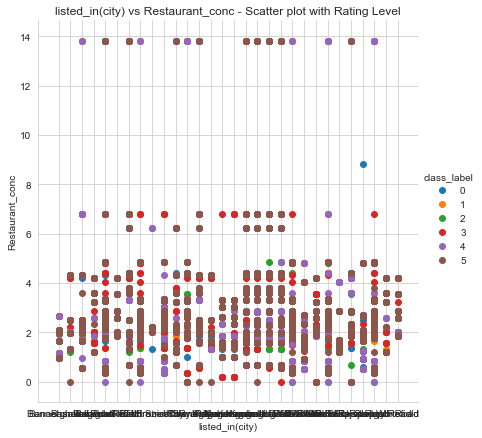

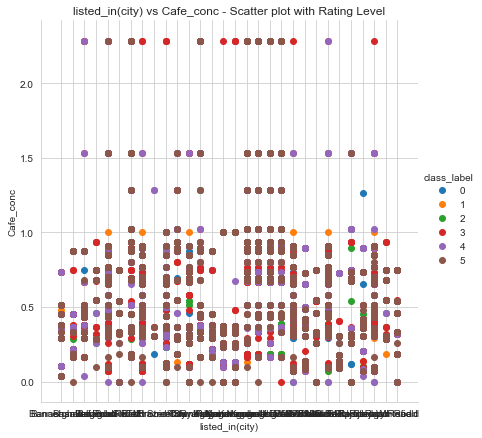

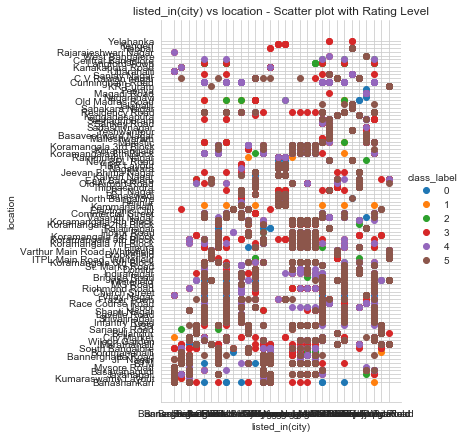

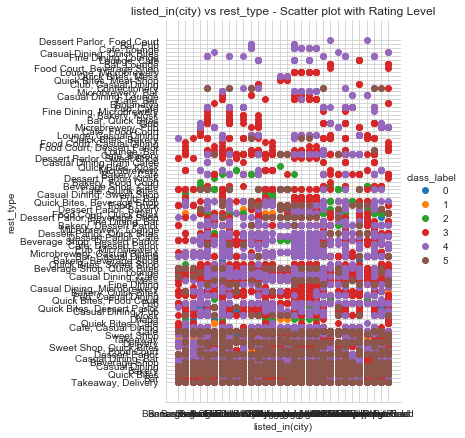

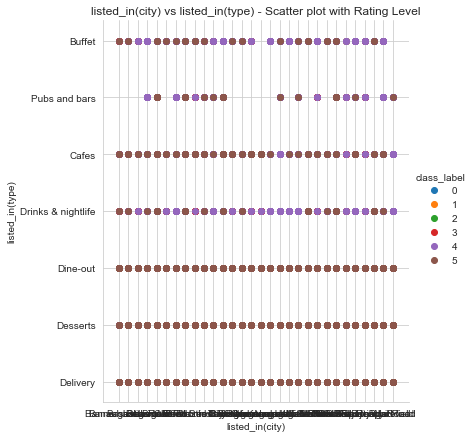

In [16]:
plot('listed_in(city)')

#### 5.221 Observations:

-  **plot vs votes** : Even though the data points are spread better than other features, we cannot differentiate between the class labels.
-  **plot vs approx_cost(for two people)** :  Data is overlapping too much
-  **plot vs user_votes** : Data is overlapping too much with some seperation at class label = 2
-  **plot vs total_cuisines** : Data is made up of 2 discrete features but its overlapping a lot
-  **plot vs RevPASH** : There is some seperation of data at all location at higher RevPASH
-  **plot vs Total_p** : There is some seperation of data at all location
-  **plot vs Male_p** : There is some seperation of data at all location
-  **plot vs Female_p** : There is some seperation of data at all location
-  **plot vs Restaurant_conc** : There is some seperation of data at all location
-  **plot vs Cafe_conc** : There is some seperation of data at all location
-  **plot vs Location** : There is some seperation of data at all location
-  **plot vs Rest_type** : There is some seperation of data at all location
-  **plot vs listed_in(type)** : Data is overlapping

#### 5.3 Individual Graphs

In [17]:
# We define a function which prints pie chart for a given dataframe and its specific feature
# We take any categorical feature as input
# We calculate the counts of each category of input and append the category and their respective total counts in 2 seperate lists l1 and l2
# We plot the values with categories and print the percentsge along with it

def pie(Dataframe,feature):
    z = Dataframe[feature].value_counts()
    l1=[]
    l2=[]
    for i in z: # Counts of the categories
        l1.append(i)
    for i in z.keys(): # Category names
        l2.append(i)
    plt.pie(l1, labels=l2,autopct='%1.0f%%')
    plt.title('Percentage of Restaurants having {}'.format(feature))
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),  #https://stackoverflow.com/questions/21572870/matplotlib-percent-label-position-in-pie-chart
          fancybox=True, shadow=True, ncol=5)
    plt.show()

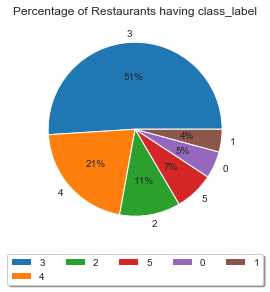

In [18]:
pie(df,'class_label')

We can oberve that 51% of the data points have a rating less than 4 but greater than 3. Therefore, we can say that its better to treat this problem as a regression one rather a binary classification one.

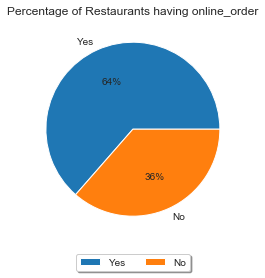

In [19]:
pie(df,'online_order')

64% of all the restaurants offer online booking.

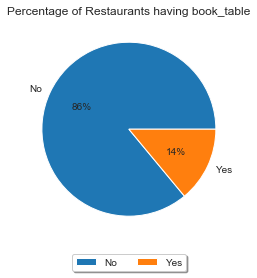

In [20]:
pie(df,'book_table')

Only 14% of restaturants in bangalore allow pre booking of table

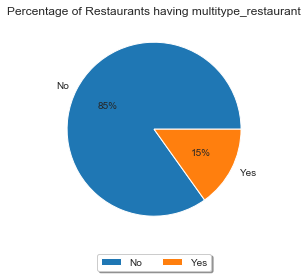

In [21]:
pie(df,'multitype_restaurant')

Only 15% of restaurants in bangalore offer multiple features.

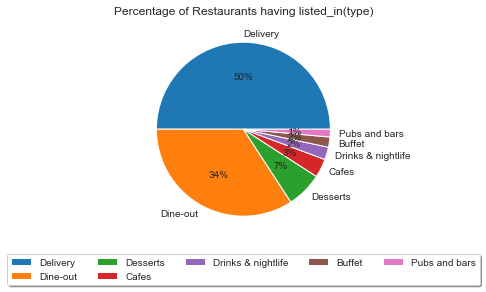

In [22]:
pie(df,'listed_in(type)')

We can oberve that about 50% of the listed restaurants provide delivery, where as 34% offer Dine-out services.
We can oberve the sub sections in the beow graph

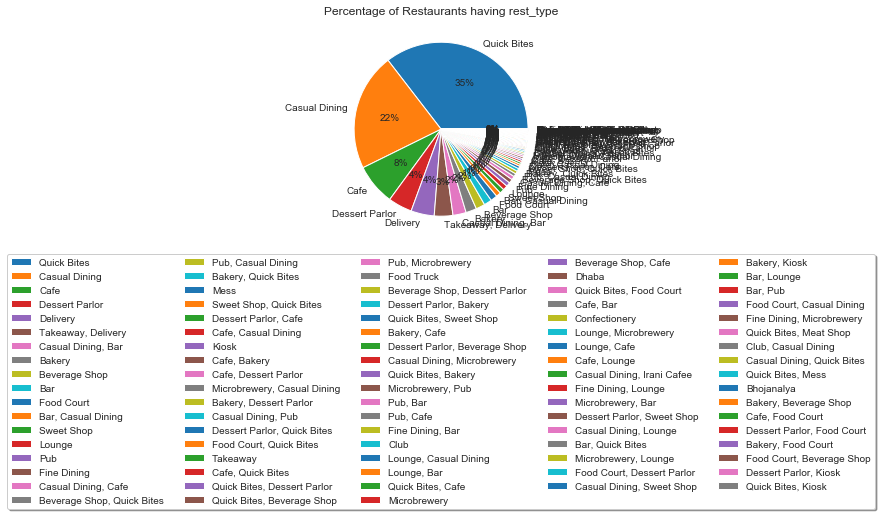

In [23]:
pie(df,'rest_type')

This graph tells us about the most frequent type of serives provided by restaurants in bangalore. About 61% are from 5 services alone. Remaining 39% are made up by 65 services. 

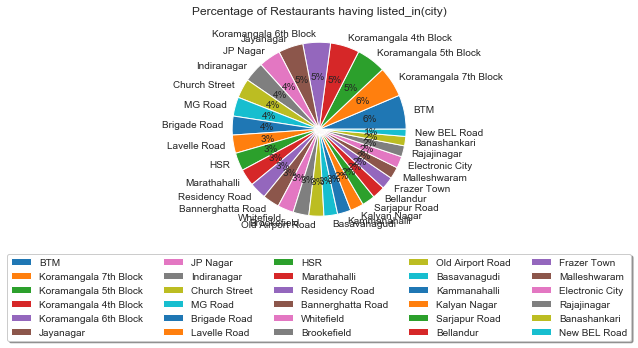

In [24]:
pie(df,'listed_in(city)')

This graph shows us that the number of restaurants are almost equally listed in the zomato site based on the locality.

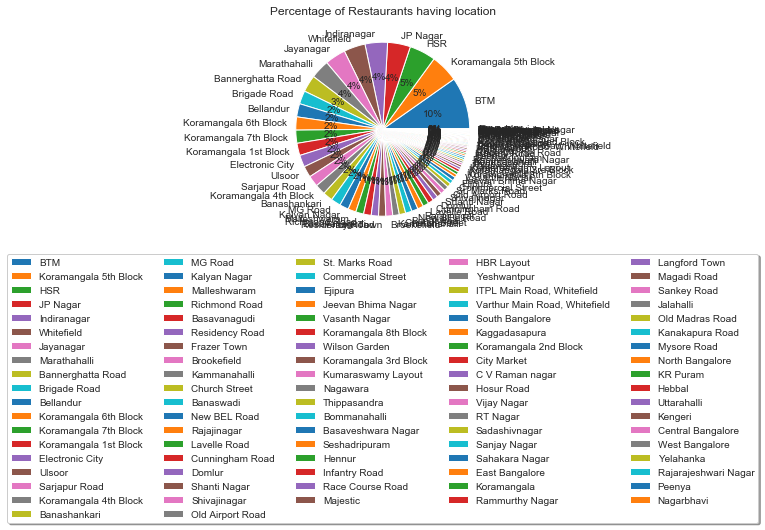

In [25]:
pie(df,'location')

Looking at this pie chart, we can oberve that BTM is the most crowded area in term of restaurants, and areas like penya and Nagarbhavi have very marginal number of restaurants.

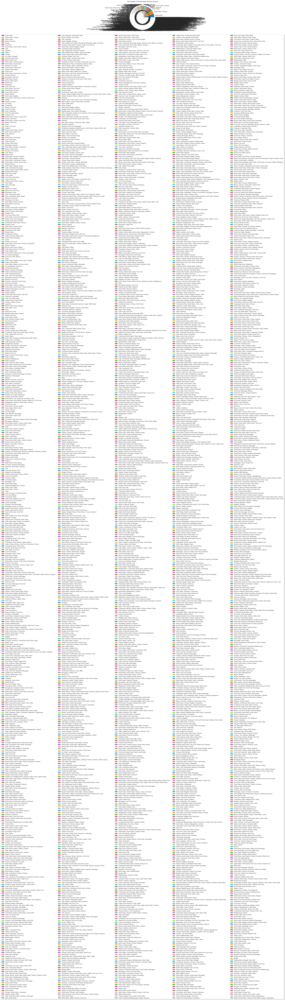

In [26]:
pie(df,'cuisines')

The number of unique cuisines offered bythe restaurants are very large. Even here North Indian makes us a large portion. This feature can be considered as having a unique value for each data points instead of a categorical feature.

In [27]:
# We define a function to plot the distribution graph of a given feature
def distribution_plot(Dataframe,feature):
    sns.FacetGrid(Dataframe,hue='class_label',height=6).map(sns.distplot,feature).add_legend();
    plt.title("Distribution Plot of {}".format(feature))
    plt.show()

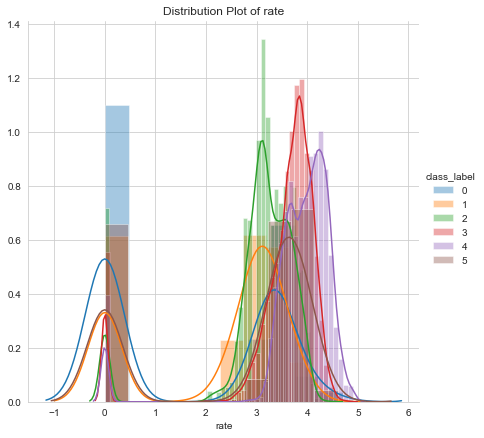

In [28]:
distribution_plot(df,'rate')

We can see that even though rate is similar to avg_user_rating, values for all the different class labels are overlapping and we cannot clearly make out the points.

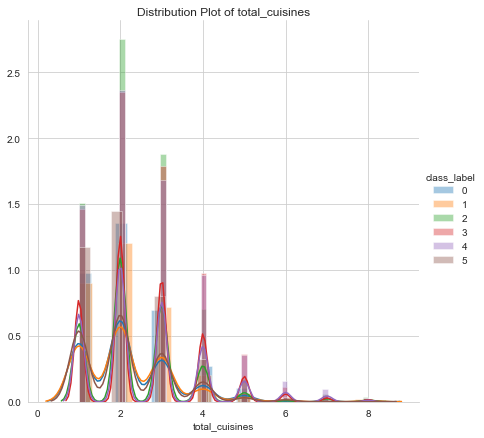

In [29]:
distribution_plot(df,'total_cuisines')

We can oberve a lot of overlapping at all the points, but we can also infer that the number of restaurants having total cuisines greater than 6 are far less and most restaurants have total_cuisines as 2.

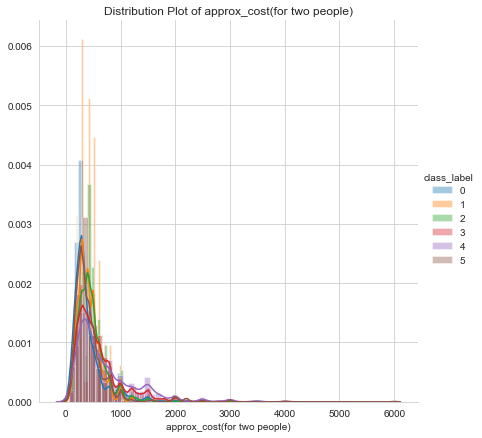

In [30]:
distribution_plot(df,'approx_cost(for two people)')

Even though the graph appears to be highly overlapping, we can observe that when approx cost is greater than 1500, there appears to be only class 4 points, but we cannot be sure.

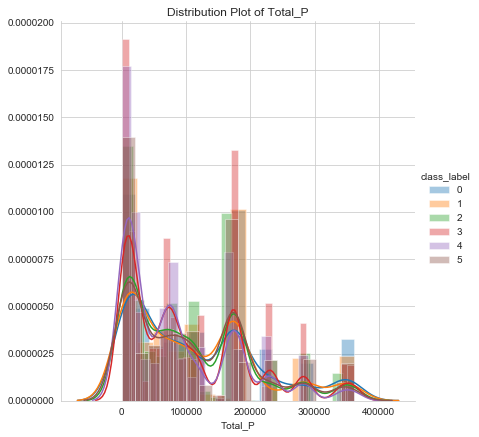

In [31]:
distribution_plot(df,'Total_P')

There is a lot of overlapping at all the different population figures.

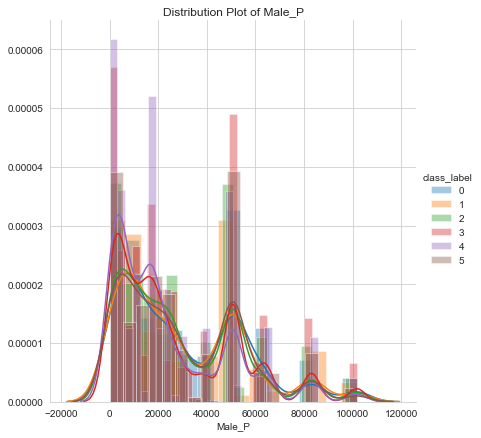

In [32]:
distribution_plot(df,'Male_P')

Plot is very similar to that of Total Population, nothing can be infered.

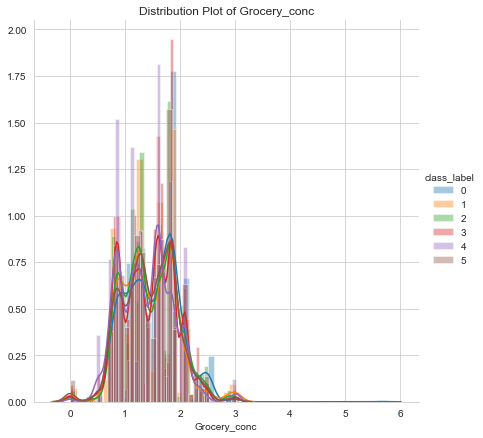

In [33]:
distribution_plot(df,'Grocery_conc')

There is a lot of overlapping of points for different class labels.

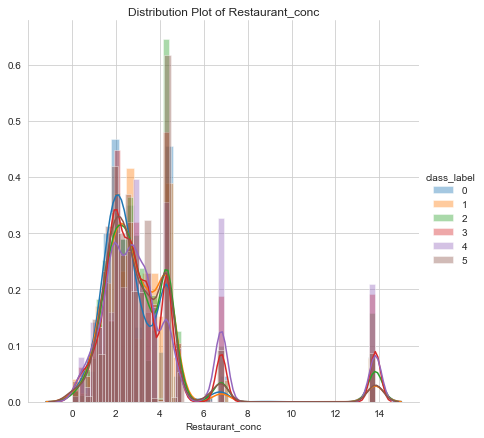

In [34]:
distribution_plot(df,'Restaurant_conc')

There appears to be presence of specific class intervals at high restaurant concentration and not all.

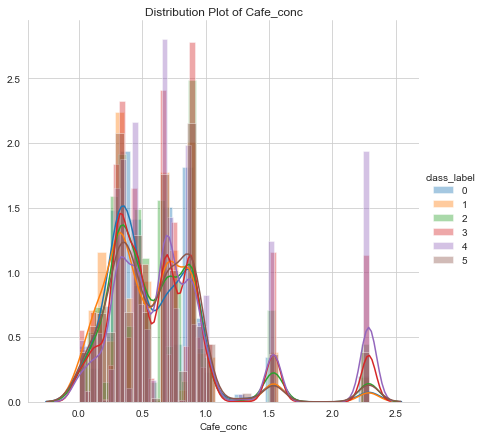

In [35]:
distribution_plot(df,'Cafe_conc')

Plot is very similar to that of the Restaurant concentration, there appears to be a very high concentration of class label = 4 at high Cafe concentration.

In [36]:
def bar_graph(dataframe,feature):
    z = dataframe[feature].value_counts()
    plt.figure(figsize = (30, 20))
    plt.bar(z.keys(),z, color='maroon')
    plt.xlabel(feature)
    plt.ylabel('Number of Restaurant')
    plt.title('Number of Restaurant per {}'.format(feature))
    plt.show()

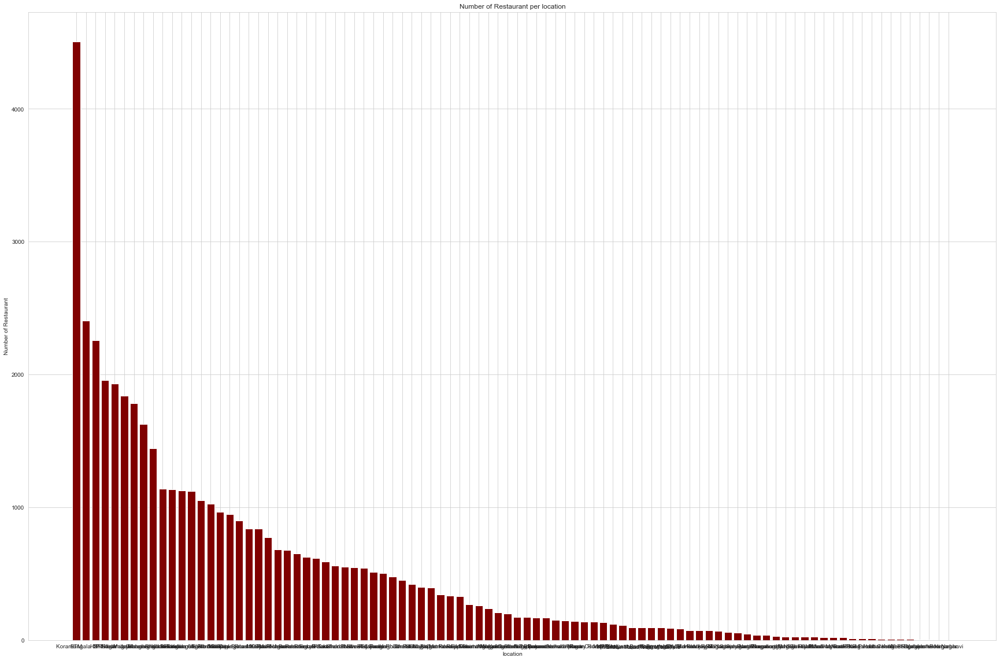

In [37]:
bar_graph(df,'location')

Looking at this bar graph, we can clearly see that about 70-80% of restaurants are present in 10-15 locations.
We can conclude by saying that locations and number of restaurants in those locations follow a Pareto Distribution.

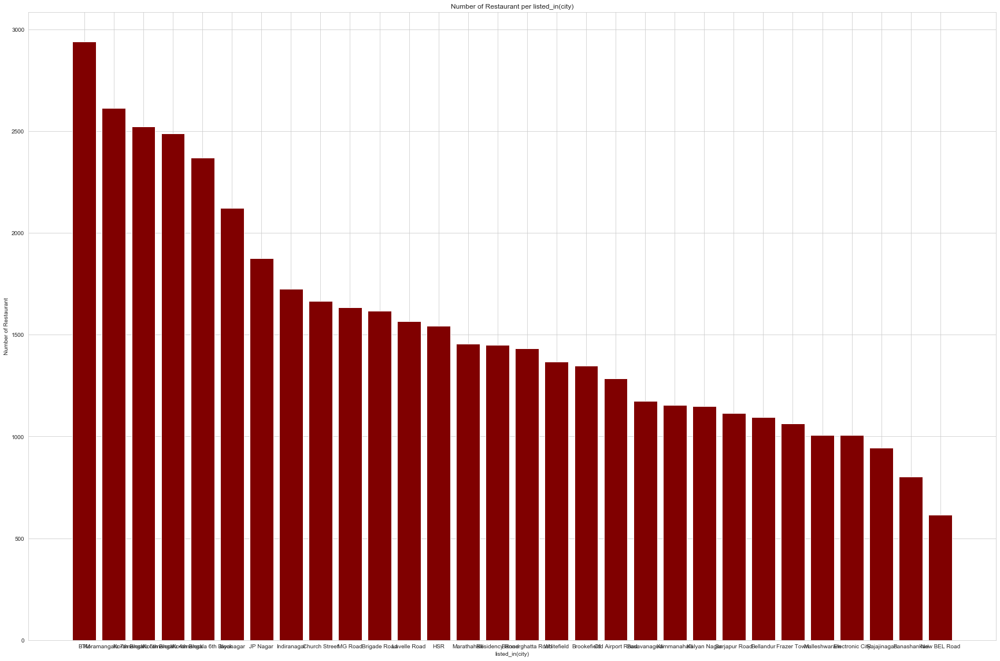

In [38]:
bar_graph(df,'listed_in(city)')

The number of listings in Zomato is not as extreme as location, the number of restaurants are equally distributed.

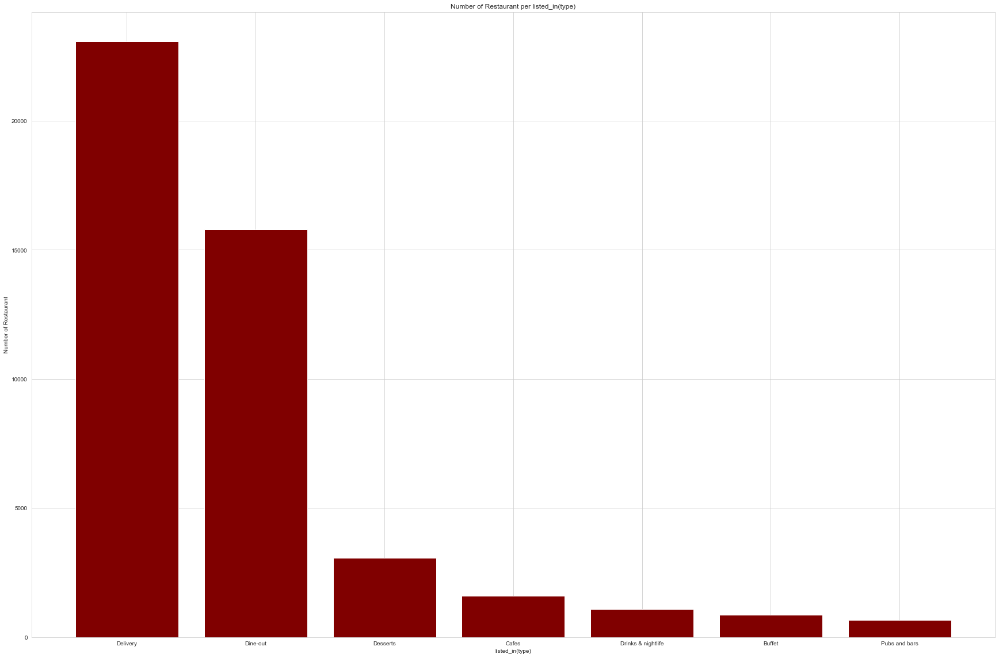

In [39]:
bar_graph(df,'listed_in(type)')

Even the listed type of serive can be said to be following pareto distribution.

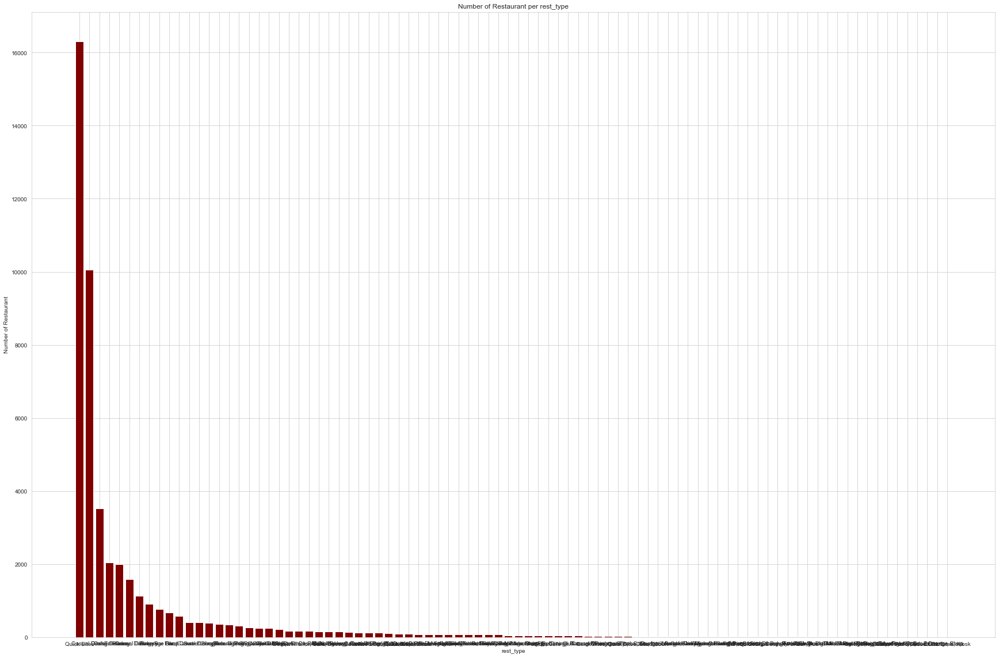

In [40]:
bar_graph(df,'rest_type')

Just like location, we can say that rest_type also follows a pareto distribution as a large potion of the restaurants provide a similar service as compared to a majority of other restaurants which offer various unique services.

In [41]:
# We defined a function word_clouds by refering this blog -  https://www.geeksforgeeks.org/generating-word-cloud-python/
# This will be used for features which have a lot of unique values and cannot be included in the previous plots.
# all the unique words are taken and compared with the set of stopwords and if its not present in the set, we plot it in the word_cloud
# The more a word apprears in the dataset, bigger it will be in the word_cloud.
# A plot of all the various unique word_cloud is given as output

def word_clouds(dataframe, feature):
    comment_words = '' 
    stopwords = set(STOPWORDS)
    for val in dataframe[feature]:
        val = str(val)
        tokens = val.split()
        for i in range(len(tokens)):
            tokens[i] = tokens[i].lower()
        comment_words += " ".join(tokens)+" "
    
    wordcloud = WordCloud(width = 800, height = 800,background_color ='white',
                stopwords = stopwords,min_font_size = 10).generate(comment_words)
 
    # plot the WordCloud image                      
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    plt.show()

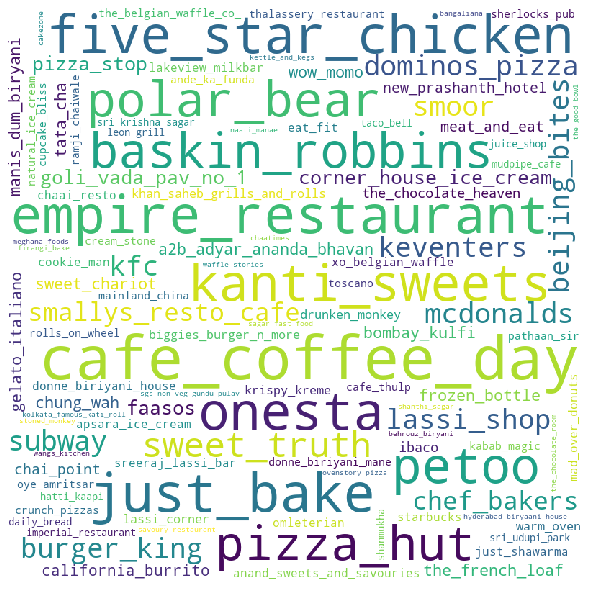

In [42]:
word_clouds(df,'name')

-  We can oberve that the biggest names are from popular fast food chains like, **'Pizza Hut', 'Cafe Coffee Day', 'Just Bake'** etc.
-  Some Indian speciality sweet shops like **'Kanti Sweets'** can also be seen which might have multiple shops at various locations.
-  Just based on the names of the big ones, we can infer that **Coffee, Fast food and Sweets** are the popular kinds of places in Bangalore.

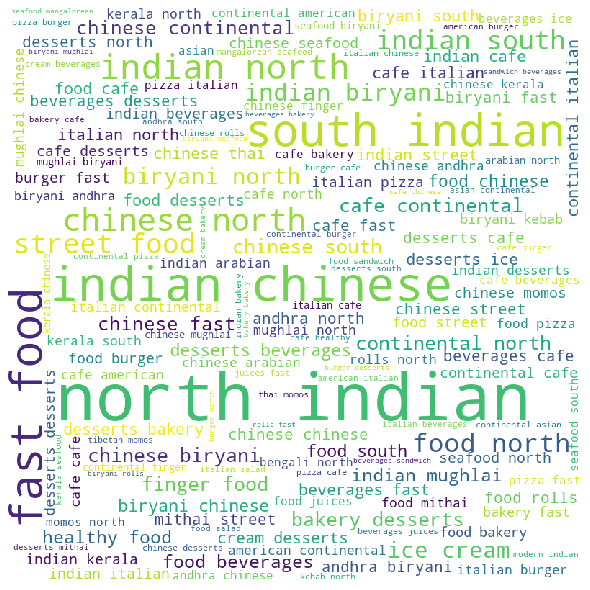

In [43]:
word_clouds(df,'cuisines')

-  We can observe that **'North Indian'** is the most popular kind of cuisine in Bnaglore.
- **Chinese** and its different variations are also quite popular.
- Just like we observed from our names word cloud, we can observe a large number of smaller names related to **Sweets, Bakery**

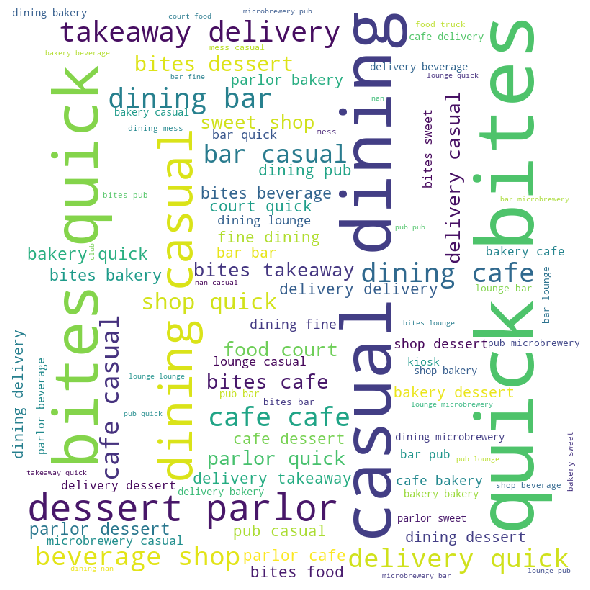

In [44]:
word_clouds(df,'rest_type')

-  We can clearly observe that **Quick bites, Casual Dining** are the most popular type of restaurant, which is in line with what we observed previously that a lot of fast food places are popular in Bangalore.
-  Similarly, we had observed that about **50%** of the restaurants provided **Delivery** options which is in line with **Quick bites**
- **Cafe and Sweet** Shops are also very popular as infered previously.

### 6. ML Problem:

From our data analysis above, we can now try to approach this problem with Machine Learning Models. When we started this project our main objective was to help find the success rate of a new restaurant opening at a specific location with specific types of cuisines, menu items and various other factors.

We observed the following based on the previous work done on the same topic:
-  There was no clear way to define the success of a restaurant.
-  A specific **threshold on the ratings (3.7)** for the restaurants was taken to divide the restaurants as successfull or failures, but this threshold was found only on the basis of making the data a balanced one for **binary classification**.
-  This resulted in majority of the restaurants having a rating of above 3 were considered as failures, we cannot generalize these results and use our model to predict similar results.
-  Based on our EDA we observed that about **35%** of the points lie between 3 and 3.7 which can be considered as average to quite well functioning restaurants and definately not failures.
-  The **rating** feature used to find a threshold and divide the data for binary classification is not suitable as seen from our EDA, as almost 15% of the points have a rating score of 0 (which may be due to a new restaurant). Along with this, this rating feature is one that is given by Zomato on its Website. There may be cases where this is not updated or not filled.


Based on the above analysis, we have decided to solve this probelm using the following steps:
-  Instaed of using **Rating** as our main feature, we would use **Avg_User_Rating**. This was extracted from the reviews given by the customers and must have more semblance as the customers are defining the value of the restaurant.
-  **Avg_User_Rating** has better distribution of points as compared to **Rating** and has only **5%** of datapoints having 0 rating as compared to **15%**.
-  Instead of finding a threshold for the feature and generalizing the model by trying to predict just the Success and Failure of a restaurant, We would try to tackle this problem as a **Regression** one.
-  We would use **Avg_User_Rating** as our **Class_Label** and try to predict the average user rating for a restaturant given the specific feature inputs.
-  This would be helpful for our partners who would be using our model. It would allow them to get a good idea about the possibility of the customer satisfaction and **True Success Rate** of a restaurant, rather than getting a vague answer of 'Yes' or 'No'.

### 7. Performance Metrics:

Since we have decided that we are going to treat this as a **Regression** problem. We need some metrics using which, we can calculate the performance of our Regression models. Based on common knowledge and research done for the topic (https://towardsdatascience.com/performance-metrics-in-machine-learning-part-2-regression-c60608f3ef6a), lets go through some of them and finalize the right one.

a. **Mean Square Error:**
-  It is calculated as the mean or average of the squared differences between predicted and expected target values in a dataset. -  The squaring has the effect of inflating or magnifying large errors, i.e, the larger the difference between the predicted and expected values, the larger the resulting squared positive error.
-  When analyzing the results, it can be a bit confusing as it gives the square of the predicted values, Therefore, we can conclude it to be **not suitable**.

b. **Root Mean Square Error:**
-  It is the same as the MSE but provides the final answer by taking the root of MSE.
-  This solves the interpretability problem of MSE.
-  But both MSE and RMSE punish larger errors more than smaller ones. In our case we want to be very precise on our prediction and therefore need equal weights on all types of errors.
-  We can conclude it to be **not suitable** for our model.

c. **Mean Absolute Error:**
-  This is very popular as just like RMSE, the units of the error score match the units of the target value that is being predicted.
-  The MAE does not give more or less weight to different types of errors and instead the scores increase linearly with increases in error.
- This can be **suitable** for our model.

d. **R Squared (R²) / Coefficient of Determination**
-  It represents the proportion of the variance for the dependent variable y that's explained by the independent variables X.
-  R² is calculated by taking one minus the sum of squares of residuals divided by the total sum of squares.
-  Drawback of R² is that, he more features are added to a model, the more the R² increases. This happens even though the features added to the model are not intrinsically predictive.
-  This can be **suitable** for our model as the number of features in our dataset aren't that many and R² would help us give a better understanding our features with respect to our Class labels.

e. **Adjusted R Squared (R²)**
-  It tries to solve the drawbacks of R².
-  It takes into account the features used in the predictive model. Doing so, the more predictive features are added to the model, the higher the Adjusted R². However, the more 'useles' features are added to the model, the lower the Adjusted R² value.
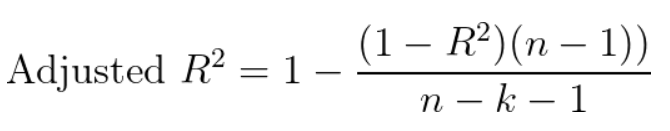
-  Where n is the number of data points and k is the number of features in the model.


Based on the above analysis we can conclude the following:
-  It is important to report both an error measure, e.g. **RMSE and an R² measure**.
-  R² expresses the relation between the features X in the model and the target variable y. Error measures, instead, express how much spread out the data points are with respect to the regression fit.
-  This would allow us to get an insight on the prediction of our model and increase the interpretability of our Model as well as find the best performance improvement metric.

### 8. Data Preparation

#### 8.1 Data Spliting

In [2]:
df = pd.read_csv('result.csv')
df.drop(columns=['Unnamed: 0'],inplace=True)
df.columns

Index(['name', 'online_order', 'book_table', 'rate', 'votes', 'location',
       'rest_type', 'cuisines', 'approx_cost(for two people)',
       'listed_in(type)', 'listed_in(city)', 'avg_user_rating', 'user_votes',
       'total_cuisines', 'multitype_restaurant', 'RevPASH', 'Total_P',
       'Male_P', 'Female_P', 'Grocery_conc', 'Restaurant_conc', 'Cafe_conc',
       'class_label'],
      dtype='object')

In [3]:
df.drop(columns=['rate','class_label'],inplace=True)
X = df.drop('avg_user_rating',axis=1)
y = df['avg_user_rating']
print(X.shape)
print(y.shape)

(46142, 20)
(46142,)


In [4]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.33)
print(X_train.shape,y_train.shape)
print(X_test.shape,y_test.shape)

(30915, 20) (30915,)
(15227, 20) (15227,)


-  We have made our **avg_user_rating** feature as our class label for our model.
-  We have divided the data based on a test size of 33%. Training set has 30915 data points and test set has 15227.

#### 8.2 Encoding features

In [5]:
# We define a function categorical to encode our  categorical and binary features
# We encode them using OneHotEncoding, we fit the Encoder on our training data
# Then we transform both the training and test feature data.
# We return the encoded feature values.

def categorical(X_train,X_test,y_train,y_test,feature):
    print(X_train[feature].shape,y_train.shape)
    print(X_test[feature].shape,y_test.shape)
    print('*'*75)
    enc = OneHotEncoder(handle_unknown='ignore')
    enc.fit(X_train[feature].values.reshape(-1, 1))
    print(enc.categories_)
    X_train_feature = enc.transform(X_train[feature].values.reshape(-1, 1))
    X_test_feature = enc.transform(X_test[feature].values.reshape(-1, 1))
    print(X_train_feature.shape,y_train.shape)
    print(X_test_feature.shape,y_test.shape)
    return X_train_feature,X_test_feature

In [6]:
X_train_order,X_test_order = categorical(X_train,X_test,y_train,y_test,'online_order')

(30915,) (30915,)
(15227,) (15227,)
***************************************************************************
[array(['No', 'Yes'], dtype=object)]
(30915, 2) (30915,)
(15227, 2) (15227,)


In [7]:
X_train_book,X_test_book = categorical(X_train,X_test,y_train,y_test,'book_table')

(30915,) (30915,)
(15227,) (15227,)
***************************************************************************
[array(['No', 'Yes'], dtype=object)]
(30915, 2) (30915,)
(15227, 2) (15227,)


In [8]:
X_train_multi,X_test_multi = categorical(X_train,X_test,y_train,y_test,'multitype_restaurant')

(30915,) (30915,)
(15227,) (15227,)
***************************************************************************
[array(['No', 'Yes'], dtype=object)]
(30915, 2) (30915,)
(15227, 2) (15227,)


In [9]:
X_train_location,X_test_location = categorical(X_train,X_test,y_train,y_test,'location')

(30915,) (30915,)
(15227,) (15227,)
***************************************************************************
[array(['BTM', 'Banashankari', 'Banaswadi', 'Bannerghatta Road',
       'Basavanagudi', 'Basaveshwara Nagar', 'Bellandur', 'Bommanahalli',
       'Brigade Road', 'Brookefield', 'C V Raman nagar',
       'Central Bangalore', 'Church Street', 'City Market',
       'Commercial Street', 'Cunningham Road', 'Domlur', 'East Bangalore',
       'Ejipura', 'Electronic City', 'Frazer Town', 'HBR Layout', 'HSR',
       'Hebbal', 'Hennur', 'Hosur Road', 'ITPL Main Road, Whitefield',
       'Indiranagar', 'Infantry Road', 'JP Nagar', 'Jalahalli',
       'Jayanagar', 'Jeevan Bhima Nagar', 'KR Puram', 'Kaggadasapura',
       'Kalyan Nagar', 'Kammanahalli', 'Kanakapura Road', 'Kengeri',
       'Koramangala', 'Koramangala 1st Block', 'Koramangala 2nd Block',
       'Koramangala 3rd Block', 'Koramangala 4th Block',
       'Koramangala 5th Block', 'Koramangala 6th Block',
       'Koramangala 7th

In [10]:
X_train_rest,X_test_rest = categorical(X_train,X_test,y_train,y_test,'rest_type')

(30915,) (30915,)
(15227,) (15227,)
***************************************************************************
[array(['Bakery', 'Bakery, Beverage Shop', 'Bakery, Cafe',
       'Bakery, Dessert Parlor', 'Bakery, Food Court', 'Bakery, Kiosk',
       'Bakery, Quick Bites', 'Bar', 'Bar, Casual Dining', 'Bar, Lounge',
       'Bar, Pub', 'Bar, Quick Bites', 'Beverage Shop',
       'Beverage Shop, Cafe', 'Beverage Shop, Dessert Parlor',
       'Beverage Shop, Quick Bites', 'Bhojanalya', 'Cafe', 'Cafe, Bakery',
       'Cafe, Bar', 'Cafe, Casual Dining', 'Cafe, Dessert Parlor',
       'Cafe, Food Court', 'Cafe, Lounge', 'Cafe, Quick Bites',
       'Casual Dining', 'Casual Dining, Bar', 'Casual Dining, Cafe',
       'Casual Dining, Irani Cafee', 'Casual Dining, Lounge',
       'Casual Dining, Microbrewery', 'Casual Dining, Pub',
       'Casual Dining, Quick Bites', 'Casual Dining, Sweet Shop', 'Club',
       'Club, Casual Dining', 'Confectionery', 'Delivery',
       'Dessert Parlor', 'Dessert 

In [11]:
X_train_type,X_test_type = categorical(X_train,X_test,y_train,y_test,'listed_in(type)')

(30915,) (30915,)
(15227,) (15227,)
***************************************************************************
[array(['Buffet', 'Cafes', 'Delivery', 'Desserts', 'Dine-out',
       'Drinks & nightlife', 'Pubs and bars'], dtype=object)]
(30915, 7) (30915,)
(15227, 7) (15227,)


In [12]:
X_train_city,X_test_city = categorical(X_train,X_test,y_train,y_test,'listed_in(city)')

(30915,) (30915,)
(15227,) (15227,)
***************************************************************************
[array(['BTM', 'Banashankari', 'Bannerghatta Road', 'Basavanagudi',
       'Bellandur', 'Brigade Road', 'Brookefield', 'Church Street',
       'Electronic City', 'Frazer Town', 'HSR', 'Indiranagar', 'JP Nagar',
       'Jayanagar', 'Kalyan Nagar', 'Kammanahalli',
       'Koramangala 4th Block', 'Koramangala 5th Block',
       'Koramangala 6th Block', 'Koramangala 7th Block', 'Lavelle Road',
       'MG Road', 'Malleshwaram', 'Marathahalli', 'New BEL Road',
       'Old Airport Road', 'Rajajinagar', 'Residency Road',
       'Sarjapur Road', 'Whitefield'], dtype=object)]
(30915, 30) (30915,)
(15227, 30) (15227,)


#### 8.3 Observations:

-  We used the above function on 7 of our features from the dataset.
-  3 of them are binary features while the remaining 4 were categorical features.
-  Feature 'Location' had the most unique value and therefore was encoded to a feature with 91 dimentions
-  In total we converted our 7 features to get 221 dimentions of data.

In [13]:
# We define a function numerical to normalize our  numerical features
# We normalize them using MinMaxScalar, we fit the Normalizer on our training data
# Then we transform both the training and test feature data.
# We return the Normalized feature values.


def numerical(X_train,X_test,feature):
    norm = MinMaxScaler()
    print(X_train[feature].shape)
    print(X_test[feature].shape)
    norm.fit(X_train[feature].values.reshape(-1,1))
    print('*'*50)
    X_Train_bow = norm.transform(X_train[feature].values.reshape(-1,1))
    X_Test_bow = norm.transform(X_test[feature].values.reshape(-1,1))
    print(X_Train_bow.shape)
    print(X_Test_bow.shape)
    return  X_Train_bow, X_Test_bow

In [14]:
X_train_votes,X_test_votes = numerical(X_train,X_test,'votes')

(30915,)
(15227,)
**************************************************
(30915, 1)
(15227, 1)


In [15]:
X_train_uv,X_test_uv = numerical(X_train,X_test,'user_votes')

(30915,)
(15227,)
**************************************************
(30915, 1)
(15227, 1)


In [16]:
X_train_cost,X_test_cost = numerical(X_train,X_test,'approx_cost(for two people)')

(30915,)
(15227,)
**************************************************
(30915, 1)
(15227, 1)


In [17]:
X_train_tc,X_test_tc = numerical(X_train,X_test,'total_cuisines')

(30915,)
(15227,)
**************************************************
(30915, 1)
(15227, 1)


In [18]:
X_train_rv,X_test_rv = numerical(X_train,X_test,'RevPASH')

(30915,)
(15227,)
**************************************************
(30915, 1)
(15227, 1)


In [19]:
X_train_tp,X_test_tp = numerical(X_train,X_test,'Total_P')

(30915,)
(15227,)
**************************************************
(30915, 1)
(15227, 1)


In [20]:
X_train_mp,X_test_mp = numerical(X_train,X_test,'Male_P')

(30915,)
(15227,)
**************************************************
(30915, 1)
(15227, 1)


In [21]:
X_train_fp,X_test_fp = numerical(X_train,X_test,'Female_P')

(30915,)
(15227,)
**************************************************
(30915, 1)
(15227, 1)


In [22]:
X_train_gc,X_test_gc = numerical(X_train,X_test,'Grocery_conc')

(30915,)
(15227,)
**************************************************
(30915, 1)
(15227, 1)


In [23]:
X_train_rc,X_test_rc = numerical(X_train,X_test,'Restaurant_conc')

(30915,)
(15227,)
**************************************************
(30915, 1)
(15227, 1)


In [24]:
X_train_cc,X_test_cc = numerical(X_train,X_test,'Cafe_conc')

(30915,)
(15227,)
**************************************************
(30915, 1)
(15227, 1)


#### 8.4 Observations:

-  We have normalized 11 of our features from the dataset
-  In the end we get 11 features with normalized values.
-  We are going to horizontally stack these together to get our final DataFrame, which we can use to model the given problem.

In [25]:
X_tra = hstack((X_train_order,X_train_book,X_train_multi,X_train_location,X_train_rest,X_train_type,X_train_city,
               X_train_votes,X_train_uv,X_train_cost,X_train_tc,X_train_rv,X_train_tp,X_train_mp,X_train_fp,X_train_gc,X_train_rc,X_train_cc)).tocsr()
X_tes = hstack((X_test_order,X_test_book,X_test_multi,X_test_location,X_test_rest,X_test_type,X_test_city,
               X_test_votes,X_test_uv,X_test_cost,X_test_tc,X_test_rv,X_test_tp,X_test_mp,X_test_fp,X_test_gc,X_test_rc,X_test_cc)).tocsr()
print(X_tra.shape,y_train.shape)
print(X_tes.shape,y_test.shape)

(30915, 235) (30915,)
(15227, 235) (15227,)


In [26]:
X_tr = pd.DataFrame(X_tra.toarray())
X_te = pd.DataFrame(X_tes.toarray())
print(X_tr.shape)
print(X_te.shape)

(30915, 235)
(15227, 235)


In [27]:
X_tr

,0,1,2,3,4,5,6,7,8,9,...,225,226,227,228,229,230,231,232,233,234
0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.000660,0.127517,0.285714,0.000519,0.209398,0.171311,0.173935,0.123110,0.241629,0.334907
1,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.013861,0.244966,0.142857,0.020417,0.003027,0.160766,0.163222,0.091584,0.206596,0.307653
2,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.000660,0.085570,0.428571,0.000356,0.303395,0.248261,0.252059,0.193984,0.232025,0.239117
3,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.000660,0.060403,0.142857,0.000259,0.474302,0.495834,0.494354,0.324056,0.313280,0.382384
4,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.007921,0.060403,0.000000,0.003111,0.196761,0.159743,0.162408,0.202704,0.206326,0.294963
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30910,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.002640,0.093960,0.142857,0.001556,0.016542,0.105437,0.099917,0.147025,0.181352,0.073099
30911,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.153795,0.018456,0.000000,0.022654,0.339661,0.308332,0.310487,0.365160,0.151317,0.224266
30912,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.001320,0.093960,0.428571,0.000778,0.946103,0.597651,0.566418,0.186106,0.161282,0.134189
30913,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.003960,0.068792,0.285714,0.001750,0.474302,0.495834,0.494354,0.324056,0.313280,0.382384


#### 8.5 Observations:

-  We can observe that our new **Test** and **Training** DataFrames have **232** features which have all been pre processed and encoded, ready to be used in our ML models.

### 9. ML Models

In [28]:
# We are defining a function model_training which would take different models and their respective parameters
# The function would try to find the best parameters for the given model based on RMSE and R2 as our Performance Metrics
# It will print the best parameters after running the model through a GridSearch

def model_training(model,params):
    scorers = {'RMSE': 'neg_root_mean_squared_error','R2': 'r2'}
    Grid = GridSearchCV(model, params, cv=5,scoring=scorers,refit='RMSE',verbose=3)
    Grid.fit(X_tr,y_train)
    print(Grid.best_params_)

In [29]:
# We are defining a function called metrics which would take the best model as input.
# The function would use the model to predict the training and test restaurant ratings, their RMSE and R2 score.
# We will print all the performance metrics related to Training and Test Dataset sepeartely.
# This function will also plot the Predicted and the Original Ratings of the first 75 Restaurants in the form of a line graph.
# This would help us visualize how closely our model is able to predict the ratings and how well it is performing.

def metrics(model):
    
    model.fit(X_tr,y_train)
    train_pred = model.predict(X_tr)
    test_pred = model.predict(X_te)
    train_r2 = r2_score(y_train, train_pred)
    test_r2 = r2_score(y_test, test_pred)
    mse_test = mean_squared_error(y_test, test_pred)
    mse_train = mean_squared_error(y_train, train_pred)
    
    print("Performace metrics for Training Data :")
    print("Mean Square Error of the model is {}".format(mse_train))
    print("Root Mean Square Error of the model is {}".format(math.sqrt(mse_train)))
    print("R² of the model is {}".format(train_r2))
    
    x = range(len(y_train[:75]))
    plt.plot(x, y_train[:75], label="original")
    plt.plot(x, train_pred[:75], label="predicted")
    plt.title("Original and predicted Ratings for Training Data")
    plt.xlabel('Data Point')
    plt.ylabel('Rating')
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=5)
    plt.grid(True)
    plt.show()
    print('*'*100)
    
    print("Performace metrics for Test Data :")
    print("Mean Square Error of the model is {}".format(mse_test))
    print("Root Mean Square Error of the model is {}".format(math.sqrt(mse_test)))
    print("R² of the model is {}".format(test_r2))
    
    x = range(len(y_test[:75]))
    plt.plot(x, y_test[:75], label="original")
    plt.plot(x, test_pred[:75], label="predicted")
    plt.title("Original and predicted Ratings for Test Data")
    plt.xlabel('Data Point')
    plt.ylabel('Rating')
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=5)
    plt.grid(True)
    plt.show()
    print('*'*100)

#### 9.1 Linear regression:

-  We have decided to keep the basic verison of a Linear Regression with default parameter values as our **base model**.
-  Using this model we can compare the others which have been hyperparameter tuned.

Performace metrics for Training Data :
Mean Square Error of the model is 1.2803284627115272
Root Mean Square Error of the model is 1.1315160019688308
R² of the model is 0.0756989117515674


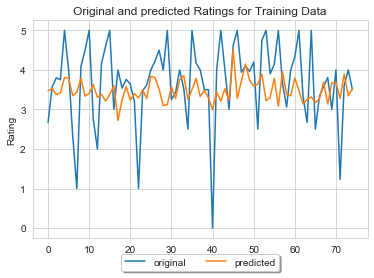

****************************************************************************************************
Performace metrics for Test Data :
Mean Square Error of the model is 2.172211254417116e+21
Root Mean Square Error of the model is 46606987184.51039
R² of the model is -1.5772463461345555e+21


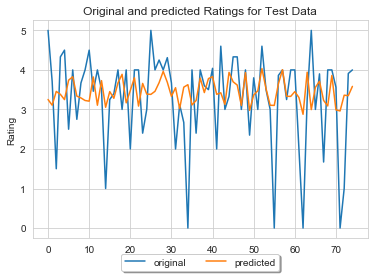

****************************************************************************************************


In [158]:
lr = LinearRegression()
metrics(lr)

#### 9.11 Observations:

-  We can observe that, our **Base Linear Regression** model does not fit well with our data at all.
-  It appears to give every data point a rating somewhere between 3 and 4, which is not good at all.
-  This Model for our **Training data** has a **RMSE of 1.1315** and **R2 of 0.0756** and for **Test data** has **RMSE of 46606987** and **R2 of -1.577**
-  After looking at these metric values, we can safely say that this model is performing very badly and any model from now on should try to imporve on this and perform better.

#### 9.2 Ridge (Linear Regression with L2 Regularization)

-  We are going to use a **Ridge Regression** and try to find the best hyperparameter **Alpha** for this using our model_training method.

In [140]:
ridge = Ridge()
params = {'alpha' : [0.001, 0.01, 0.1, 1, 10, 100, 1000]}
model_training(ridge,params)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
[CV 1/5] END alpha=0.001; R2: (test=0.054) RMSE: (test=-1.136) total time=   0.0s
[CV 2/5] END alpha=0.001; R2: (test=0.069) RMSE: (test=-1.117) total time=   0.0s
[CV 3/5] END alpha=0.001; R2: (test=0.064) RMSE: (test=-1.138) total time=   0.0s
[CV 4/5] END alpha=0.001; R2: (test=0.058) RMSE: (test=-1.165) total time=   0.0s
[CV 5/5] END alpha=0.001; R2: (test=0.065) RMSE: (test=-1.143) total time=   0.0s
[CV 1/5] END alpha=0.01; R2: (test=0.054) RMSE: (test=-1.136) total time=   0.0s
[CV 2/5] END alpha=0.01; R2: (test=0.069) RMSE: (test=-1.117) total time=   0.0s
[CV 3/5] END alpha=0.01; R2: (test=0.064) RMSE: (test=-1.138) total time=   0.0s
[CV 4/5] END alpha=0.01; R2: (test=0.058) RMSE: (test=-1.165) total time=   0.0s
[CV 5/5] END alpha=0.01; R2: (test=0.065) RMSE: (test=-1.143) total time=   0.0s
[CV 1/5] END .alpha=0.1; R2: (test=0.054) RMSE: (test=-1.136) total time=   0.0s
[CV 2/5] END .alpha=0.1; R2: (test=0.069) RM

-  After hyperparameter tuning we got a **Alpha** value of **1**, which we will use to find the best model and plot the performance metrics.

Performace metrics for Training Data :
Mean Square Error of the model is 1.280540131655533
Root Mean Square Error of the model is 1.1316095314442756
R² of the model is 0.07554610265531525


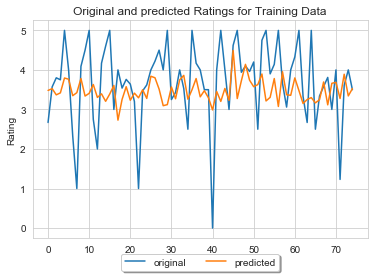

****************************************************************************************************
Performace metrics for Test Data :
Mean Square Error of the model is 1.2852643711149163
Root Mean Square Error of the model is 1.1336950079782995
R² of the model is 0.0667673187698794


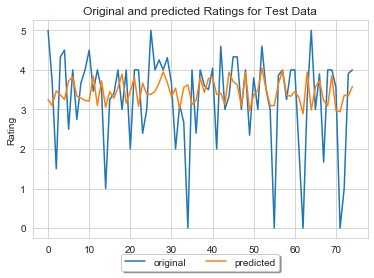

****************************************************************************************************


In [159]:
ridge = Ridge(alpha=1)
metrics(ridge)

#### 9.22 Observations:

-  We can observe that, our **Ridge** model does not fit well with our data just like our **base model**.
-  It appears to give every data point a rating somewhere between 3 and 4, similar to our base model.
-  This Model for our **Training data** has a **RMSE of 1.1315** and **R2 of 0.0755** and for **Test data** has **RMSE of 1.1336** and **R2 of 0.0667**
-  After looking at these metric values, we can say that this model is performing almost similar to our base model for **Training data**, but performs slightly better for **Test data**.
-  But this model still has a **Test RMSE** of **1.1336** which means that our predicted ratings are having a average error value of 1.1336. This is a very big error value.
-  Similarly, **Test R2** of **0.0667** means our model can explain only **6.67%** of the variance in our data set which is not great.

#### 9.3 Lasso (Linear Regression with L1 Regularization):

-  We are going to use a **Lasso Regression** and try to find the best hyperparameter **Alpha** for this using our model_training method.

In [143]:
lasso = Lasso()
params = {'alpha' : [0.001, 0.01, 0.1, 1, 10, 100, 1000]}
model_training(lasso,params)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
[CV 1/5] END alpha=0.001; R2: (test=0.049) RMSE: (test=-1.139) total time=   0.2s
[CV 2/5] END alpha=0.001; R2: (test=0.062) RMSE: (test=-1.121) total time=   0.3s
[CV 3/5] END alpha=0.001; R2: (test=0.057) RMSE: (test=-1.142) total time=   0.3s
[CV 4/5] END alpha=0.001; R2: (test=0.051) RMSE: (test=-1.169) total time=   0.2s
[CV 5/5] END alpha=0.001; R2: (test=0.057) RMSE: (test=-1.148) total time=   0.2s
[CV 1/5] END alpha=0.01; R2: (test=0.028) RMSE: (test=-1.152) total time=   0.1s
[CV 2/5] END alpha=0.01; R2: (test=0.032) RMSE: (test=-1.138) total time=   0.1s
[CV 3/5] END alpha=0.01; R2: (test=0.035) RMSE: (test=-1.155) total time=   0.1s
[CV 4/5] END alpha=0.01; R2: (test=0.029) RMSE: (test=-1.182) total time=   0.1s
[CV 5/5] END alpha=0.01; R2: (test=0.032) RMSE: (test=-1.163) total time=   0.1s
[CV 1/5] END alpha=0.1; R2: (test=-0.000) RMSE: (test=-1.168) total time=   0.1s
[CV 2/5] END alpha=0.1; R2: (test=-0.000) RM

-  After hyperparameter tuning we got a **Alpha** value of **0.001**, which we will use to find the best model and plot the performance metrics.

Performace metrics for Training Data :
Mean Square Error of the model is 1.3001752133899973
Root Mean Square Error of the model is 1.1402522586647208
R² of the model is 0.06137104684457717


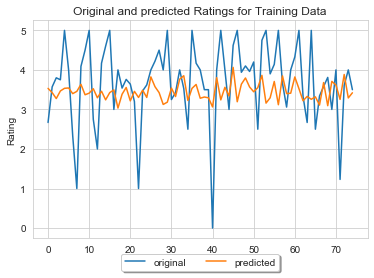

****************************************************************************************************
Performace metrics for Test Data :
Mean Square Error of the model is 1.30011072705564
Root Mean Square Error of the model is 1.1402239810912767
R² of the model is 0.05598735406188737


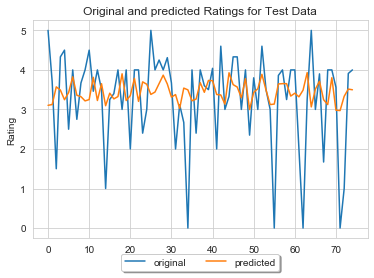

****************************************************************************************************


In [160]:
lasso = Lasso(alpha=0.001)
metrics(lasso)

#### 9.31 Observations:

-  We can observe that, our **Lasso** model does not fit well with our data just like our **base model**.
-  It appears to give every data point a rating somewhere between 3 and 4, similar to our base model.
-  This Model for our **Training data** has a **RMSE of 1.1402** and **R2 of 0.0613** and for **Test data** has **RMSE of 1.1402** and **R2 of 0.0559**
-  After looking at these metric values, we can say that this model is performing slightly worse than our base model for **Training data**, but performs slightly better for **Test data**.
-  This model still has a **Test RMSE** of **1.1402** which means that our predicted ratings are having a average error value of 1.1402. This is a very big error value and worse than **Ridge**
-  Similarly, **Test R2** of **0.0559** means our model can explain only **5.59%** of the variance in our data which is again worse than what we got from Ridge.

#### 9.4 Elastic Net (Linear Regression with L1 and L2 Regularization)

-  We are going to use a **Elastic Net** and try to find the best hyperparameter **Alpha and L1_ratio** for this using our model_training method.

In [145]:
elastic_net = ElasticNet()
params ={'alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000],'l1_ratio': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]}
model_training(elastic_net,params)

Fitting 5 folds for each of 70 candidates, totalling 350 fits
[CV 1/5] END alpha=0.001, l1_ratio=0.1; R2: (test=0.053) RMSE: (test=-1.137) total time=   1.3s
[CV 2/5] END alpha=0.001, l1_ratio=0.1; R2: (test=0.067) RMSE: (test=-1.118) total time=   1.3s
[CV 3/5] END alpha=0.001, l1_ratio=0.1; R2: (test=0.063) RMSE: (test=-1.139) total time=   1.4s
[CV 4/5] END alpha=0.001, l1_ratio=0.1; R2: (test=0.056) RMSE: (test=-1.166) total time=   1.6s
[CV 5/5] END alpha=0.001, l1_ratio=0.1; R2: (test=0.063) RMSE: (test=-1.144) total time=   1.1s
[CV 1/5] END alpha=0.001, l1_ratio=0.2; R2: (test=0.053) RMSE: (test=-1.137) total time=   1.2s
[CV 2/5] END alpha=0.001, l1_ratio=0.2; R2: (test=0.066) RMSE: (test=-1.118) total time=   1.4s
[CV 3/5] END alpha=0.001, l1_ratio=0.2; R2: (test=0.062) RMSE: (test=-1.139) total time=   1.1s
[CV 4/5] END alpha=0.001, l1_ratio=0.2; R2: (test=0.055) RMSE: (test=-1.166) total time=   1.3s
[CV 5/5] END alpha=0.001, l1_ratio=0.2; R2: (test=0.062) RMSE: (test=-1.14

-  After hyperparameter tuning we got a **Alpha** value of **0.001** and **L1_Ratio** of **0.1**, which we will use to find the best model and plot the performance metrics.

Performace metrics for Training Data :
Mean Square Error of the model is 1.287755604609915
Root Mean Square Error of the model is 1.134793199049904
R² of the model is 0.07033707255233834


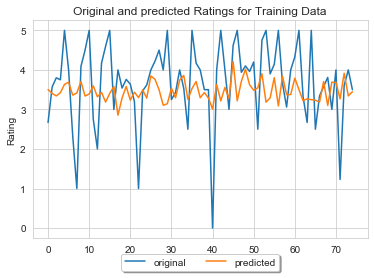

****************************************************************************************************
Performace metrics for Test Data :
Mean Square Error of the model is 1.290022285955887
Root Mean Square Error of the model is 1.1357914799627118
R² of the model is 0.06331258858059385


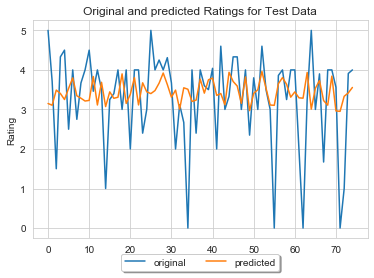

****************************************************************************************************


In [161]:
elastic_net = ElasticNet(alpha= 0.001, l1_ratio= 0.1)
metrics(elastic_net)

#### 9.41 Observations:

-  We can observe that, our **Elastic Net** model does not fit well with our data just like our **base model**.
-  It appears to give every data point a rating somewhere between 3 and 4, similar to our base model.
-  This Model for our **Training data** has a **RMSE of 1.134** and **R2 of 0.0703** and for **Test data** has **RMSE of 1.1357** and **R2 of 0.0633**
-  After looking at these metric values, we can say that this model is performing slightly worse than our **Ridge** model.
-  This model still has a **Test RMSE** of **1.135** which means that our predicted ratings are having a average error value of 1.1357 very similar to **Ridge**
-  Similarly, **Test R2** of **0.0633** means our model can explain only **6.33%** of the variance in our data which is again worse than what we got from Ridge.
-  We can finally say that, **Linear Regression** and its varriants are not good for our DataSet.

#### 9.5 KNN (K Nearest Neighbours)

-  We are going to use a **KNN model** and try to find the best hyperparameter **K** for this using our model_training method.

In [185]:
params = {'n_neighbors':[5,6,7,8,9,10,11,12,13,14,15]}
knn = neighbors.KNeighborsRegressor()
model_training(knn,params)

Fitting 5 folds for each of 11 candidates, totalling 55 fits
[CV 1/5] END n_neighbors=5; R2: (test=0.084) RMSE: (test=-1.118) total time=   3.7s
[CV 2/5] END n_neighbors=5; R2: (test=0.087) RMSE: (test=-1.106) total time=   3.5s
[CV 3/5] END n_neighbors=5; R2: (test=0.075) RMSE: (test=-1.131) total time=   3.6s
[CV 4/5] END n_neighbors=5; R2: (test=0.094) RMSE: (test=-1.142) total time=   3.7s
[CV 5/5] END n_neighbors=5; R2: (test=0.107) RMSE: (test=-1.117) total time=   3.5s
[CV 1/5] END n_neighbors=6; R2: (test=0.100) RMSE: (test=-1.108) total time=   3.6s
[CV 2/5] END n_neighbors=6; R2: (test=0.104) RMSE: (test=-1.095) total time=   3.6s
[CV 3/5] END n_neighbors=6; R2: (test=0.094) RMSE: (test=-1.119) total time=   3.6s
[CV 4/5] END n_neighbors=6; R2: (test=0.115) RMSE: (test=-1.129) total time=   3.9s
[CV 5/5] END n_neighbors=6; R2: (test=0.114) RMSE: (test=-1.113) total time=   3.6s
[CV 1/5] END n_neighbors=7; R2: (test=0.104) RMSE: (test=-1.106) total time=   3.8s
[CV 2/5] END n_

-  After hyperparameter tuning we got a **K** value of **10**, which we will use to find the best model and plot the performance metrics.

Performace metrics for Training Data :
Mean Square Error of the model is 0.9603931517386382
Root Mean Square Error of the model is 0.9799965059828725
R² of the model is 0.3066682018312885


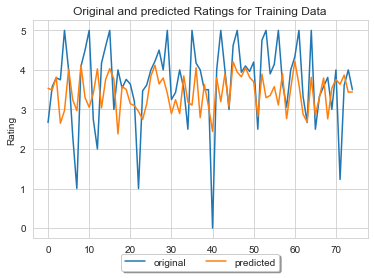

****************************************************************************************************
Performace metrics for Test Data :
Mean Square Error of the model is 1.1729237413804428
Root Mean Square Error of the model is 1.0830160392997155
R² of the model is 0.14833804418198926


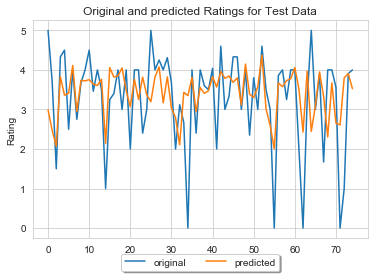

****************************************************************************************************


In [186]:
model = neighbors.KNeighborsRegressor(n_neighbors = 10)
metrics(model)

#### 9.51 Observations:

-  We can observe that, our **KNN** model is fitting better than our **base model**.
-  It appears to give some differentiation to the ratings for every data points, which we didnt see in our previous 4 models along with our **Base model**. But still it cannot seem to give rating like **0,1,5**
-  This Model for our **Training data** has a **RMSE of 0.9799** and **R2 of 0.3066** and for **Test data** has **RMSE of 1.08301** and **R2 of 0.14833**
-  After looking at these metric values, we can say that this model is way better than our **Base Model**.
-  This model still has a **Test RMSE** of **1.083** which means that our predicted ratings are having a average error value of 1.083 which is still very large
-  Similarly, **Test R2** of **0.14833** means our model can explain  **14.833%** of the variance in our data which is much better than our previous model but still very less for any practical use. 
-  We can finally say that, **KNN** performs better than **Linear Regression** and its varriants for our DataSet, but not good enough to take inference from it.

#### 9.6 Decision Tree Regressor

-  We are going to use a **Decision Tree Regressor** and try to find the best hyperparameter **Max_depth** and **Min_samples** for this using our model_training method.

In [36]:
Tree=DecisionTreeRegressor()
params = {"min_samples_leaf":[1,2,3,4,5],"max_depth": [1,5,10,15,20,25,30,35,40,45,50]}
model_training(Tree,params)

Fitting 5 folds for each of 55 candidates, totalling 275 fits
[CV 1/5] END max_depth=1, min_samples_leaf=1; R2: (test=0.428) RMSE: (test=-0.879) total time=   0.0s
[CV 2/5] END max_depth=1, min_samples_leaf=1; R2: (test=0.471) RMSE: (test=-0.867) total time=   0.0s
[CV 3/5] END max_depth=1, min_samples_leaf=1; R2: (test=0.455) RMSE: (test=-0.866) total time=   0.0s
[CV 4/5] END max_depth=1, min_samples_leaf=1; R2: (test=0.477) RMSE: (test=-0.857) total time=   0.0s
[CV 5/5] END max_depth=1, min_samples_leaf=1; R2: (test=0.449) RMSE: (test=-0.872) total time=   0.0s
[CV 1/5] END max_depth=1, min_samples_leaf=2; R2: (test=0.428) RMSE: (test=-0.879) total time=   0.1s
[CV 2/5] END max_depth=1, min_samples_leaf=2; R2: (test=0.471) RMSE: (test=-0.867) total time=   0.0s
[CV 3/5] END max_depth=1, min_samples_leaf=2; R2: (test=0.455) RMSE: (test=-0.866) total time=   0.0s
[CV 4/5] END max_depth=1, min_samples_leaf=2; R2: (test=0.477) RMSE: (test=-0.857) total time=   0.0s
[CV 5/5] END max_dep

-  After hyperparameter tuning we got a  **Max_depth** of **35** and **Min_samples** of **2**, which we will use to find the best model and plot the performance metrics.

Performace metrics for Training Data :
Mean Square Error of the model is 0.053064482419280176
Root Mean Square Error of the model is 0.23035729295874308
R² of the model is 0.961735817476232


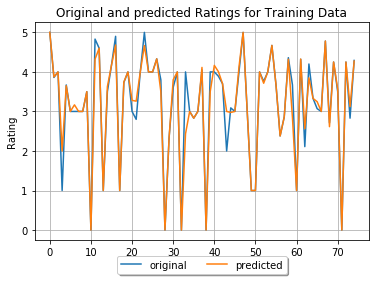

****************************************************************************************************
Performace metrics for Test Data :
Mean Square Error of the model is 0.38578529545422396
Root Mean Square Error of the model is 0.6211161690490951
R² of the model is 0.7192258508624882


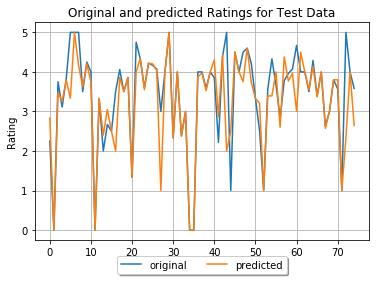

****************************************************************************************************


In [35]:
Tree=DecisionTreeRegressor(max_depth=35,min_samples_leaf=2)
metrics(Tree)

#### 9.61 Observation:

-  We can observe that, our **Decision Tree Regressor** is fitting quite well with our data.
-  It appears to give good differentiation to the ratings for every data points at every rating value with higher affinity for lower ratings.
-  This Model for our **Training data** has a **RMSE of 0.2305** and **R2 of 0.9617** and for **Test data** has **RMSE of 0.6211** and **R2 of 0.7192**
-  After looking at these metric values, we can say that this model is performing much better than previous models.
-  This model still has a **Test RMSE** of **0.6211** which means that our predicted ratings are having a average error value of 0.6211 which is better but can be improved further.
-  Similarly, **Test R2** of **0.7192** means our model can explain  **71.92%** of the variance in our data, this tells us that this model is able to utilize 72% of the features to predict our ratings.
-  We can finally say that, **Decision Tree Regressor** performs well with our dataset. We should apply various ensemble models of Decison Tree to improve the performance metrics.

#### 9.7 Random Forest Regressor

-  We are going to use a **Random Forest Regressor** and try to find the best hyperparameter **Max_depth** and **N_Estimators** for this using our model_training method.

In [155]:
forest=RandomForestRegressor()
params = {"n_estimators":[5, 10, 20, 50, 100],"max_depth": [1,5,10,15,20,25,30,35]}
model_training(forest,params)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
[CV 1/5] END max_depth=1, n_estimators=5; R2: (test=0.451) RMSE: (test=-0.865) total time=   0.3s
[CV 2/5] END max_depth=1, n_estimators=5; R2: (test=0.446) RMSE: (test=-0.861) total time=   0.3s
[CV 3/5] END max_depth=1, n_estimators=5; R2: (test=0.464) RMSE: (test=-0.861) total time=   0.3s
[CV 4/5] END max_depth=1, n_estimators=5; R2: (test=0.448) RMSE: (test=-0.892) total time=   0.3s
[CV 5/5] END max_depth=1, n_estimators=5; R2: (test=0.470) RMSE: (test=-0.861) total time=   0.3s
[CV 1/5] END max_depth=1, n_estimators=10; R2: (test=0.451) RMSE: (test=-0.865) total time=   0.6s
[CV 2/5] END max_depth=1, n_estimators=10; R2: (test=0.446) RMSE: (test=-0.861) total time=   0.6s
[CV 3/5] END max_depth=1, n_estimators=10; R2: (test=0.464) RMSE: (test=-0.861) total time=   0.6s
[CV 4/5] END max_depth=1, n_estimators=10; R2: (test=0.447) RMSE: (test=-0.892) total time=   0.8s
[CV 5/5] END max_depth=1, n_estimators=10; R2: (test

-  After hyperparameter tuning we got a  **Max_depth** of **35** and **N_Estimators** of **100**, which we will use to find the best model and plot the performance metrics.

Performace metrics for Training Data :
Mean Square Error of the model is 0.04434718598300238
Root Mean Square Error of the model is 0.21058771565075296
R² of the model is 0.9679846590475429


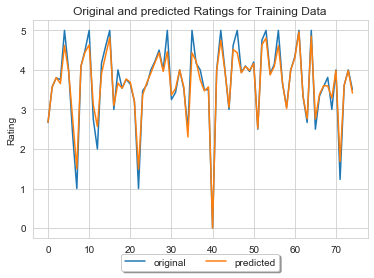

****************************************************************************************************
Performace metrics for Test Data :
Mean Square Error of the model is 0.23398888267935017
Root Mean Square Error of the model is 0.4837239736454564
R² of the model is 0.8301002678760432


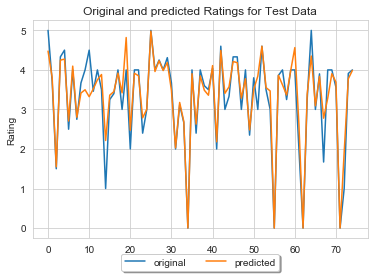

****************************************************************************************************


In [165]:
forest=RandomForestRegressor(max_depth=35,n_estimators=100)
metrics(forest)

#### 9.71 Observations:

-  We can observe that, our **Random Forest Regressor** is fitting quite well with our data.
-  It appears to give good differentiation to the ratings for every data points at every rating value.
-  This Model for our **Training data** has a **RMSE of 0.2105** and **R2 of 0.9679** and for **Test data** has **RMSE of 0.48372** and **R2 of 0.8301**
-  After looking at these metric values, we can say that this model is performing very well.
-  This model still has a **Test RMSE** of **0.48372** which means that our predicted ratings are having a average error value of 0.48372 which is very good as the predicted rating from our model would be quite accurate.
-  Similarly, **Test R2** of **0.8301** means our model can explain  **83.01%** of the variance in our data, this tells us that this model is able to utilize 83% of the features to predict our ratings.
-  We can finally say that, **Random Forest Regressor** performs very well with our dataset. The model starts to get overfitted but the test results are very good as compared to our previous models.

#### 9.8 XgBoosted Regressor

-  We are going to use a **XgBoosted Regressor** and try to find the best hyperparameter **Max_depth** and **N_Estimators** for this using our model_training method.

In [166]:
xgb = XGBRegressor()
params = {"n_estimators":[5, 10, 20, 50, 100],"max_depth": [1,3,5,7,9,11,13,15]}
model_training(xgb,params)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
[CV 1/5] END max_depth=1, n_estimators=5; R2: (test=0.254) RMSE: (test=-1.009) total time=   0.5s
[CV 2/5] END max_depth=1, n_estimators=5; R2: (test=0.245) RMSE: (test=-1.005) total time=   0.1s
[CV 3/5] END max_depth=1, n_estimators=5; R2: (test=0.272) RMSE: (test=-1.004) total time=   0.1s
[CV 4/5] END max_depth=1, n_estimators=5; R2: (test=0.294) RMSE: (test=-1.008) total time=   0.2s
[CV 5/5] END max_depth=1, n_estimators=5; R2: (test=0.262) RMSE: (test=-1.015) total time=   0.2s
[CV 1/5] END max_depth=1, n_estimators=10; R2: (test=0.451) RMSE: (test=-0.865) total time=   0.3s
[CV 2/5] END max_depth=1, n_estimators=10; R2: (test=0.446) RMSE: (test=-0.861) total time=   0.3s
[CV 3/5] END max_depth=1, n_estimators=10; R2: (test=0.464) RMSE: (test=-0.861) total time=   0.5s
[CV 4/5] END max_depth=1, n_estimators=10; R2: (test=0.454) RMSE: (test=-0.886) total time=   0.4s
[CV 5/5] END max_depth=1, n_estimators=10; R2: (test

-  After hyperparameter tuning we got a  **Max_depth** of **15** and **N_Estimators** of **100**, which we will use to find the best model and plot the performance metrics.

Performace metrics for Training Data :
Mean Square Error of the model is 0.016855552538288136
Root Mean Square Error of the model is 0.1298289356741714
R² of the model is 0.9878315557234639


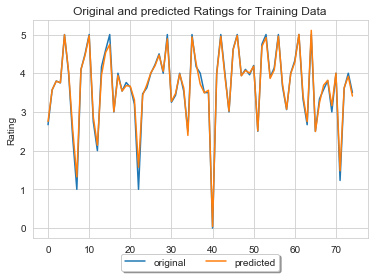

****************************************************************************************************
Performace metrics for Test Data :
Mean Square Error of the model is 0.2227336880908431
Root Mean Square Error of the model is 0.47194670047669907
R² of the model is 0.8382726841194714


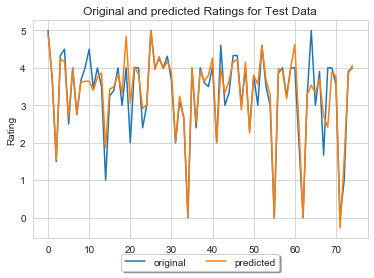

****************************************************************************************************


In [167]:
xgb=XGBRegressor(max_depth=15,n_estimators=100)
metrics(xgb)

#### 9.81 Observations:

-  We can observe that, our **XgBoosted Regressor** is fitting quite well with our data.
-  It appears to give good differentiation to the ratings for every data points at every rating value just like our **Random Forest Regressor**.
-  This Model for our **Training data** has a **RMSE of 0.1298** and **R2 of 0.9878** and for **Test data** has **RMSE of 0.4719** and **R2 of 0.8382**
-  After looking at these metric values, we can say that this model is performing slightly better than **Random Forest Regressor**.
-  This model still has a **Test RMSE** of **0.4719** which means that our predicted ratings are having a average error value of 0.4719 which is an improvement on our previous model.
-  Similarly, **Test R2** of **0.8382** means our model can explain  **83.82%** of the variance in our data, this tells us that this model is able to utilize 83.82% of the features to predict our ratings.
-  We can finally say that, **XgBoosted Regressor** performs very well with our dataset. The model has produced the best results thus far.

#### 9.9 Light GBM Regressor

-  We are going to use a **Light GBM Regressor** and try to find the best hyperparameter **Max_depth** and **N_Estimators** for this using our model_training method.

In [174]:
lf = LGBMRegressor()
params = {"n_estimators":[500,1000,1500,2000,2500,3000,3500],"max_depth": [1,3,5,7,9,11,13,15,17]}
model_training(lf,params)

Fitting 5 folds for each of 63 candidates, totalling 315 fits
[CV 1/5] END max_depth=1, n_estimators=500; R2: (test=0.482) RMSE: (test=-0.841) total time=   0.5s
[CV 2/5] END max_depth=1, n_estimators=500; R2: (test=0.480) RMSE: (test=-0.834) total time=   0.6s
[CV 3/5] END max_depth=1, n_estimators=500; R2: (test=0.494) RMSE: (test=-0.837) total time=   0.7s
[CV 4/5] END max_depth=1, n_estimators=500; R2: (test=0.477) RMSE: (test=-0.868) total time=   0.6s
[CV 5/5] END max_depth=1, n_estimators=500; R2: (test=0.500) RMSE: (test=-0.836) total time=   0.6s
[CV 1/5] END max_depth=1, n_estimators=1000; R2: (test=0.484) RMSE: (test=-0.839) total time=   0.9s
[CV 2/5] END max_depth=1, n_estimators=1000; R2: (test=0.483) RMSE: (test=-0.832) total time=   0.9s
[CV 3/5] END max_depth=1, n_estimators=1000; R2: (test=0.496) RMSE: (test=-0.835) total time=   1.0s
[CV 4/5] END max_depth=1, n_estimators=1000; R2: (test=0.479) RMSE: (test=-0.866) total time=   0.9s
[CV 5/5] END max_depth=1, n_estima

-  After hyperparameter tuning we got a  **Max_depth** of **15** and **N_Estimators** of **3500**, but we should experiment with more values of **N_Estimators** as it seems to have not been optimized.
-  We run the model again with only **N_Estimators** as hyperparameter but with higher values.

In [179]:
lf = LGBMRegressor()
params = {"n_estimators":[2000,4000,6000,8000,12000,14000]}
model_training(lf,params)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END n_estimators=2000; R2: (test=0.777) RMSE: (test=-0.552) total time=   5.0s
[CV 2/5] END n_estimators=2000; R2: (test=0.764) RMSE: (test=-0.562) total time=   4.8s
[CV 3/5] END n_estimators=2000; R2: (test=0.781) RMSE: (test=-0.551) total time=   5.3s
[CV 4/5] END n_estimators=2000; R2: (test=0.781) RMSE: (test=-0.561) total time=   5.6s
[CV 5/5] END n_estimators=2000; R2: (test=0.784) RMSE: (test=-0.550) total time=   5.7s
[CV 1/5] END n_estimators=4000; R2: (test=0.798) RMSE: (test=-0.525) total time=  10.3s
[CV 2/5] END n_estimators=4000; R2: (test=0.788) RMSE: (test=-0.533) total time=  10.6s
[CV 3/5] END n_estimators=4000; R2: (test=0.801) RMSE: (test=-0.525) total time=  11.4s
[CV 4/5] END n_estimators=4000; R2: (test=0.805) RMSE: (test=-0.529) total time=  11.3s
[CV 5/5] END n_estimators=4000; R2: (test=0.804) RMSE: (test=-0.523) total time=  11.3s
[CV 1/5] END n_estimators=6000; R2: (test=0.805) RMSE: (test

-  We still arent sure about this and therefore run it one more time with different values.

In [182]:
lf = LGBMRegressor()
params = {"n_estimators":[14000,16000,18000,20000]}
model_training(lf,params)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5] END n_estimators=14000; R2: (test=0.810) RMSE: (test=-0.509) total time=  33.8s
[CV 2/5] END n_estimators=14000; R2: (test=0.799) RMSE: (test=-0.519) total time=  35.2s
[CV 3/5] END n_estimators=14000; R2: (test=0.812) RMSE: (test=-0.509) total time=  38.7s
[CV 4/5] END n_estimators=14000; R2: (test=0.815) RMSE: (test=-0.515) total time=  39.3s
[CV 5/5] END n_estimators=14000; R2: (test=0.815) RMSE: (test=-0.509) total time=  39.0s
[CV 1/5] END n_estimators=16000; R2: (test=0.810) RMSE: (test=-0.509) total time=  39.9s
[CV 2/5] END n_estimators=16000; R2: (test=0.799) RMSE: (test=-0.519) total time=  40.9s
[CV 3/5] END n_estimators=16000; R2: (test=0.813) RMSE: (test=-0.509) total time=  44.4s
[CV 4/5] END n_estimators=16000; R2: (test=0.815) RMSE: (test=-0.516) total time=  44.0s
[CV 5/5] END n_estimators=16000; R2: (test=0.815) RMSE: (test=-0.508) total time=  45.2s
[CV 1/5] END n_estimators=18000; R2: (test=0.810) 

-  We can finally oberve that our model will have a **Max_depth** of **15** and **N_Estimators** of **16000**, which we will use to find the best model and plot the performance metrics.

Performace metrics for Training Data :
Mean Square Error of the model is 0.006353545620296928
Root Mean Square Error of the model is 0.07970913134827733
R² of the model is 0.9954132167626428


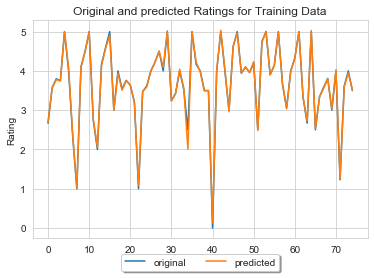

****************************************************************************************************
Performace metrics for Test Data :
Mean Square Error of the model is 0.20653459900279425
Root Mean Square Error of the model is 0.45446077828872566
R² of the model is 0.8500348707037083


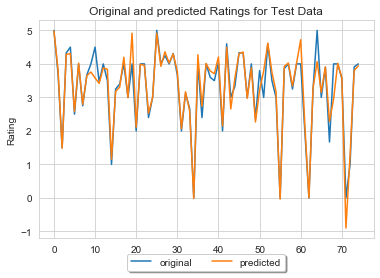

****************************************************************************************************


In [181]:
lf=LGBMRegressor(max_depth=15,n_estimators=16000)
metrics(lf)

#### 9.91 Observations:

-  We can observe that, our **Light GBM Regressor** is fitting very well with our data.
-  It appears to give the best differentiation to the ratings for every data points at every rating value.
-  This Model for our **Training data** has a **RMSE of 0.0797** and **R2 of 0.9954** and for **Test data** has **RMSE of 0.4544** and **R2 of 0.8503**
-  After looking at these metric values, we can say that this model is performing the best as compared to previous models
-  This model still has a **Test RMSE** of **0.4544** which means that our predicted ratings are having a average error value of 0.4544 which is the best we have seen till now.
-  Similarly, **Test R2** of **0.85003** means our model can explain  **85.03%** of the variance in our data, this tells us that this model is able to utilize 85.03% of the features to predict our ratings.
-  We can finally say that, **Light GBM Regressor** performs very well with our dataset. The model has produced the best results and cannot be optimized further as the training set is starting to overfit.

### 10. Ensemble Models

We have seen 9 different types of ML models, using which we were able to achieve a maximum **Test R2** of **0.8503** and minimum **Test RMSE** of **0.4544**. We would now try to create ensemble of the best 3 performing models to check if we can imporve our performance metrics. The Models that we are going to use are:
-  **Random Forest Regressor**
-  **Xgboosted Regressor**
-  **Light GBM Regressor**

We are going to try the following Ensemble models on our Dataset:
-  **Voting Regressor**
-  **Stacking Regressor**

#### 10.1 Voting Regressor

-  This will fit the given base regressors, each on the whole dataset. Then it averages the individual predictions to form a final prediction.

Performace metrics for Training Data :
Mean Square Error of the model is 0.01610854408249001
Root Mean Square Error of the model is 0.12691943934043362
R² of the model is 0.9883843157821773


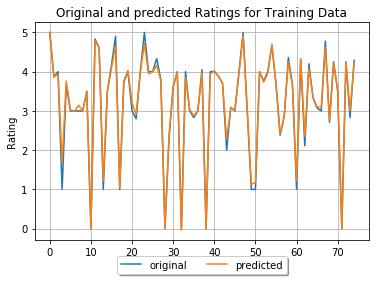

****************************************************************************************************
Performace metrics for Test Data :
Mean Square Error of the model is 0.19241227781309633
Root Mean Square Error of the model is 0.4386482392682049
R² of the model is 0.8599625381704239


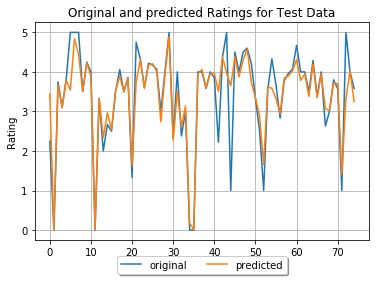

****************************************************************************************************


In [40]:
forest=RandomForestRegressor(max_depth=35,n_estimators=100)
xgb=XGBRegressor(max_depth=15,n_estimators=100)
lf=LGBMRegressor(max_depth=15,n_estimators=16000)
Vr = VotingRegressor([('rf', forest), ('xgb', xgb),('lgbm',lf)])
metrics(Vr)

#### 10.11 Observations:

-  We can observe that our **Voting Regressor** performs better than all our previous models.
-  It appears to give the best differentiation to the ratings for every data points at every rating value.
-  This Model for our **Training data** has a **RMSE of 0.1269** and **R2 of 0.9883** and for **Test data** has **RMSE of 0.4386** and **R2 of 0.8599**
-  After looking at these metric values, we can say that this model is performing the best as compared to previous models
-  This model has a **Test RMSE** of **0.4386** which means that our predicted ratings are having a average error value of 0.4386 which is the best we have seen till now.
-  Similarly, **Test R2** of **0.8599** means our model can explain  **85.99%** of the variance in our data, this tells us that this model is able to utilize 86% of the features to predict our ratings.
-  We can finally say that, **Voting Regressor** performs better than our previous model and is not even overfitting as much as the previous ones. 

#### 10.2 Stacking Regressor

-  It stacks the output of individual estimator and uses a regressor to compute the final prediction. Stacking allows to use the strength of each individual estimator by using their output as input of a final estimator.

Performace metrics for Training Data :
Mean Square Error of the model is 0.012544587196400437
Root Mean Square Error of the model is 0.11200262138182497
R² of the model is 0.9909542437373517


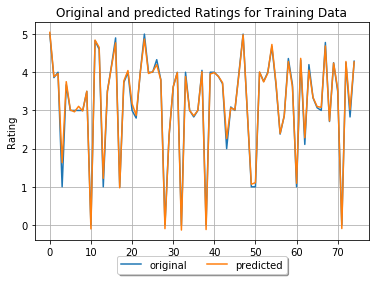

****************************************************************************************************
Performace metrics for Test Data :
Mean Square Error of the model is 0.1910628532126077
Root Mean Square Error of the model is 0.4371073703480733
R² of the model is 0.8609446480343608


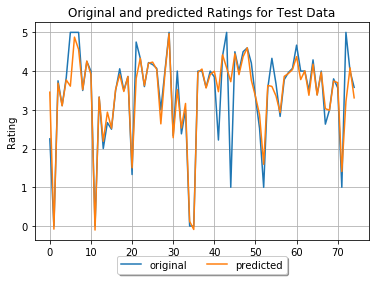

****************************************************************************************************


In [42]:
forest=RandomForestRegressor(max_depth=35,n_estimators=100)
xgb=XGBRegressor(max_depth=15,n_estimators=100)
lf=LGBMRegressor(max_depth=15,n_estimators=16000)
Sr = StackingRegressor([('rf', forest), ('xgb', xgb),('lgbm',lf)])
metrics(Sr)

#### 10.21 Observations:

-  We can observe that our **Stacking Regressor** performs better than all our previous models.
-  It appears to give the best differentiation to the ratings for every data points at every rating value.
-  This Model for our **Training data** has a **RMSE of 0.1120** and **R2 of 0.9909** and for **Test data** has **RMSE of 0.4371** and **R2 of 0.8609**
-  After looking at these metric values, we can say that this model is performing the best as compared to previous models
-  This model has a **Test RMSE** of **0.4371** which means that our predicted ratings are having a average error value of 0.4371 which is the best we have seen till now.
-  Similarly, **Test R2** of **0.8609** means our model can explain  **86.09%** of the variance in our data, this tells us that this model is able to utilize 86.09% of the features to predict our ratings.
-  We can finally say that, **Stacking Regressor** performs better than our previous model and is not even overfitting as much as the previous ones. 

### 11. Summary

In [43]:
x = PrettyTable()
x.field_names = ["Model","Train_RMSE","Train_R2","Test_RMSE", "Test_R2"]
x.add_row(['Linear Regression','1.1315','0.0756','466069','-1.5276'])
x.add_row(['Ridge','1.1316','0.0755','1.1336','0.0667'])
x.add_row(['Lasso','1.1402','0.0613','1.1402','0.0559'])
x.add_row(['Elastic Net','1.1347','0.0703','1.1357','0.0633'])
x.add_row(['KNN','0.9799','0.3066','1.0830','0.1483'])
x.add_row(['Decison Tree Regressor','0.2305','0.9619','0.6311','0.7192'])
x.add_row(['Random Forest Regressor','0.2105','0.9679','0.4837','0.8301'])
x.add_row(['XgBoosed Regressor','0.1298',' 0.9878','0.4719','0.8382'])
x.add_row(['Light GBM Regressor','0.0797','0.9954','0.4544',' 0.8503'])
x.add_row(['Voting Regressor','0.1269','0.9883','0.4386',' 0.8599'])
x.add_row(['Stacking Regressor','0.1120','0.9909','0.4371',' 0.8609'])
print(x)

+-------------------------+------------+----------+-----------+---------+
|          Model          | Train_RMSE | Train_R2 | Test_RMSE | Test_R2 |
+-------------------------+------------+----------+-----------+---------+
|    Linear Regression    |   1.1315   |  0.0756  |   466069  | -1.5276 |
|          Ridge          |   1.1316   |  0.0755  |   1.1336  |  0.0667 |
|          Lasso          |   1.1402   |  0.0613  |   1.1402  |  0.0559 |
|       Elastic Net       |   1.1347   |  0.0703  |   1.1357  |  0.0633 |
|           KNN           |   0.9799   |  0.3066  |   1.0830  |  0.1483 |
|  Decison Tree Regressor |   0.2305   |  0.9619  |   0.6311  |  0.7192 |
| Random Forest Regressor |   0.2105   |  0.9679  |   0.4837  |  0.8301 |
|    XgBoosed Regressor   |   0.1298   |  0.9878  |   0.4719  |  0.8382 |
|   Light GBM Regressor   |   0.0797   |  0.9954  |   0.4544  |  0.8503 |
|     Voting Regressor    |   0.1269   |  0.9883  |   0.4386  |  0.8599 |
|    Stacking Regressor   |   0.1120  

-  We had kept **Linear Regression** as our **Base Model**.
-  We can observe that **Linear regression** and all its different varients **(Lasso, Ridge and Elastic Net)**, all perform very badly with our DataSet.
-  **KNN** produces slightly better results but is still not great.
-  We were able to achieve good metric values using **Decison Tree**
-  We started to imporve on our performance building ensemble models on **Decison Tree**, starting with **Random Forest**.
-  We are able to reduce the tolerance between the predicted and original values for ratngs to an average value of **0.48** per rating.
-  **Random Forest** also explained **83% variance** of our data.
-  Both these metrics are fully optimized by our **Light GBM Regressor**, which reduced the average variance in rating to **0.45** and could explain **85%** of the variance in the data.
-  When we used Ensemble methods to optimize our results, we were able to achieve it in both **Voting** and **Stacking Regressor**.
-  Both the Ensemble models were slightly less overfitting and were improve the performance metrics.
-  We were able to achieve the best **Test RMSE** of **0.4371** and **Test R2** of **0.8609** using the **Stacking Regressor**